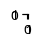

In [4]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
f,a = plt.subplots(1,1,figsize=(1e-2, 1e-2))
mpl.rcParams['figure.dpi'] = 150
sns.set_style('darkgrid')
import os,sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import warnings
warnings.filterwarnings("ignore")
import glob
from tqdm.auto import tqdm
from datetime import datetime as dt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import LabelEncoder
import torch
from torch import optim
from torch.utils.data import RandomSampler, SequentialSampler
from torch import nn
from torch.nn import functional as F
mpl.rcParams['figure.dpi'] = 180
# Load models together
%load_ext autoreload
%autoreload 2
    
from src.torch_utils import load_model_full
from src.utils import get_class_initcode_keys
from torch.utils.data import SequentialSampler
from src.datasets import *
from src.models import *
from src.utils import mkdirs, convert_path, pkl_dump, pkl_load, add_median_labels, get_palette
from src.data_processing import BL62_VALUES, BL62FREQ_VALUES, HLAS, AA_KEYS
from src.utils import pkl_load, pkl_dump, get_palette
from src.sim_utils import make_dist_matrix
from src.torch_utils import save_checkpoint, load_checkpoint
from src.train_eval import predict_model, train_eval_loops
from src.models import FullTCRVAE, TwoStageVAECLF
from src.multimodal_datasets import MultimodalMarginalLatentDataset
from src.multimodal_models import BSSVAE, JMVAE
from src.multimodal_train_eval import predict_multimodal
from src.metrics import reconstruction_accuracy, VAELoss, TripletLoss, CombinedVAELoss, compute_cosine_distance
from src.datasets import TCRSpecificDataset, FullTCRDataset



In [5]:
import networkx as nx

In [29]:
new_df_noswap = pd.read_csv('../data/multimodal/240326_nettcr_paired_NOswaps.csv')
new_df_wswap = pd.read_csv('../data/multimodal/240326_nettcr_paired_withswaps.csv')
new_df_filt = pd.read_csv('../data/filtered/240418_nettcr_expanded_20binders_17pep_POSONLY.csv')
df_old = pd.read_csv('../data/filtered/240416_nettcr_old_26pep_no_swaps.csv')

In [22]:
new_min20binders = new_df_noswap.query('partition==0').groupby('peptide').agg(count=('B3','count')).sort_values('count', ascending=False).query('count>=20').index

In [23]:
# 240507 reload after crash
files_dict = pkl_load('../output/240411_ClusteringTests/files_dict.pkl')
compdict = pkl_load('../output/240411_ClusteringTests/comp_dict.pkl')
tbcr_dm_140_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/OUTPUT_distmatrix_kernelsim_140peps_labelled.csv')
tbcr_dm_old_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/OUTPUT_distmatrix_kernelsim_140peps_labelled.csv')

In [24]:
tcrdist_dm_140_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/240422_new_df_tcrdist3_labelled.csv', index_col=0)
tcrdist_dm_old_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/tcrdist3_old_26peps_labelled.csv', index_col=0)


# fct defs

In [7]:
def get_latent_df(model, df, dataset_params:dict=None):
    
    # Init dataset and pred fct depending on model type
    dataset_params = dict(max_len_a1=7, max_len_a2=8, max_len_a3=22,
                          max_len_b1=6, max_len_b2=7, max_len_b3=23, max_len_pep=0,
                          encoding='BL50LO', pad_scale=-20,
                          a1_col='A1', a2_col='A2', a3_col='A3', b1_col='B1', b2_col='B2', b3_col='B3',
                          pep_col='peptide') if dataset_params is None else dataset_params
    
    if hasattr(model, 'vae'):
        model = model.vae
        if model.max_len>7+8+22+6+7+23:
            dataset_params['max_len_pep']=12
        else:
            dataset_params['max_len_pep']=0
            
    dataset_params['add_positional_encoding'] = model.add_positional_encoding

    if type(model) == FullTCRVAE:
        print(dataset_params)
        dataset = FullTCRDataset(df, **dataset_params)
        dataloader = dataset.get_dataloader(512, SequentialSampler)
        latent_df = predict_model(model, dataset, dataloader)
        
    elif type(model) in [BSSVAE, JMVAE]:
        pred_fct = predict_multimodal
        dataset_params['pair_only'] = True
        dataset_params['return_pair'] = type(model)==JMVAE
        dataset_params['modality']='tcr'
        dataset = MultimodalMarginalLatentDataset(model, df, **dataset_params)
        latent_df = df.copy()
        zdim = dataset.z.shape[1]
        latent_df[[f'z_{i}' for i in range(zdim)]] = dataset.z

    return latent_df

def get_distances_labels_from_latent(latent_df, label_col='peptide', seq_cols= ('A1','A2','A3','B1','B2','B3')):
    # Columns for making distmatrix
    rest_cols = list(x for x in latent_df.columns if x in ['peptide', 'original_peptide','origin', 'binder'])
    # Getting distmatrix and arrays
    dist_matrix = make_dist_matrix(latent_df, label_col, seq_cols, cols=rest_cols)
    dist_array = dist_matrix.iloc[:len(dist_matrix), :len(dist_matrix)].values
    # Getting label encoder and features for computing metrics
    features = latent_df[[z for z in latent_df.columns if z.startswith('z_')]].values
    label_encoder = LabelEncoder()
    labels = dist_matrix[label_col].values
    encoded_labels = label_encoder.fit_transform(labels)
    return dist_matrix, dist_array, features, labels, encoded_labels, label_encoder

def get_merged_distances_labels(dist_matrix, original_df, index_tcr_df, label_col='peptide', query_subset=None):
    # Assumes a square matrix with no other columns, and that the original_df and index_tcr_df match
    merged = pd.merge(index_tcr_df, original_df[[x for x in original_df.columns if x in['seq_id','peptide','partition','binder','origin','fulltcr']]],
         left_on=['q_index', 'tcr'], right_on=['seq_id','fulltcr'])
    
    assert((merged['seq_id']==merged['q_index']).all() and (merged['tcr']==merged['fulltcr']).all()),'fuck'
    merged = merged.set_index('q_index')[[x for x in merged.columns if x in ['peptide','partition','binder','origin']]]
    merged_dist_matrix = pd.merge(dist_matrix, merged, left_index=True,right_index=True)
    extra_cols = merged_dist_matrix.columns.difference(dist_matrix.columns)
    
    if query_subset is not None:
        query = merged_dist_matrix.query(query_subset)
        merged_dist_matrix = query[list(str(x) for x in query.index)+list(extra_cols)]
    
    return merged_dist_matrix, extra_cols

def get_distances_labels_from_distmatrix(dist_matrix, original_df, index_tcr_df, label_col='peptide', query_subset=None):
    merged_dist_matrix, extra_cols = get_merged_distances_labels(dist_matrix, original_df, index_tcr_df, label_col, query_subset)
    dist_array = merged_dist_matrix.iloc[:,:-len(extra_cols)].values
    features = torch.randn([dist_array.shape[0], 3])
    label_encoder = LabelEncoder()
    labels = merged_dist_matrix[label_col].values
    encoded_labels = label_encoder.fit_transform(labels)
    return merged_dist_matrix, dist_array, features, labels, encoded_labels, label_encoder

def cluster_all_thresholds(dist_array, features, labels, encoded_labels, label_encoder,
                           decimals=5, n_points=1500):
    # Getting clustering at all thresholds
    limits = get_linspace(dist_array, decimals, n_points)
    results = []
    for t in tqdm(limits):
        c = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold=t, linkage='complete')
        c.fit(dist_array)
        results.append(get_all_metrics(t, features, c, dist_array, labels, encoded_labels, label_encoder))
    results = pd.DataFrame(results)
    results['retention'] = (dist_array.shape[0]-results['n_singletons']) / dist_array.shape[0]
    return results

In [8]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score as ch_score, davies_bouldin_score as db_score, adjusted_rand_score
def get_model(folder, map_location='cpu'):
    pt = glob.glob(folder+'/*checkpoint_best*.pt')
    pt = [x for x in pt if 'interval' not in x][0]
    js = glob.glob(folder+'/*checkpoint*.json')[0]
    model = load_model_full(pt, js, map_location='cpu')
    # Extract the vae part if the model comes from a two stage VAE
    if type(model)==TwoStageVAECLF:
        model = model.vae
    model.eval()
    return model


def get_purity(counts):
    # Purity in absolute % of a cluster, taking the majority label 
    # high = better
    sorted_counts = dict(sorted(counts.items(), key=lambda item: item[1], reverse=True))
    return sorted_counts[list(sorted_counts.keys())[0]] / sum(sorted_counts.values())
    
def get_mixity(counts):
    # how many different labels are inside a cluster, weighted by the number of members
    # low = better
    return len(counts.keys()) / sum(counts.values())
    
def get_coherence(dist_array):
    # Assumes dist_array is the subset of the distance array for a given cluster label
    # mean distance within a cluster
    # low = better

    # get upper triangle mask without the diagonale
    mask = np.triu(np.ones(dist_array.shape), k=0) - np.eye(dist_array.shape[0])
    flat_array = dist_array[mask==1]
    return np.mean(flat_array)

def get_purity_mixity_coherence(cluster_label:int, 
                                true_labels:list, 
                                pred_labels:list, 
                                dist_array:np.array,
                                label_encoder):
    """
        For a given cluster label (int) returned by clustering.labels_, 
        Return the purity, mixity, coherence, cluster_size, and scale (==cluster_size/total_size)
        scale should be used to get a weighted average metric at the end
    """
    indices = np.where(pred_labels==cluster_label)[0]
    cluster_size = len(indices)
    if cluster_size<=1:
        # return np.nan, np.nan, np.nan, 1, 1/len(true_labels)
        return {'purity':np.nan, 'coherence':np.nan, 'cluster_size':1}

    # Query the subset of the true labels belonging to this cluster using indices 
    # Convert to int label encodings in order to use np.bincount to get purity and mixity
    subset = true_labels[indices]
    encoded_subset = label_encoder.transform(subset)
    counts = {i:k for i,k in enumerate(np.bincount(encoded_subset)) if k>0}
    purity = get_purity(counts)
    # mixity = get_mixity(counts)
    # index the distance matrix and return the mean distance within this cluster (i.e. coherence)
    coherence = get_coherence(dist_array[indices][:, indices])
    
    # return purity, mixity, coherence, cluster_size, cluster_size / len(true_labels)
    return {'purity':purity, 'coherence':coherence, 'cluster_size':cluster_size}

def get_all_metrics(t, features, c, array, true_labels, encoded_labels, label_encoder, return_df=False):
    n_cluster = np.sum((np.bincount(c.labels_)>1))
    n_singletons = (np.bincount(c.labels_)==1).sum()
    try:
        s_score = silhouette_score(array, c.labels_, metric='precomputed')
    except:
        s_score = np.nan
    try:
        c_score = ch_score(features, c.labels_)
    except:
        c_score = np.nan
    try:
        d_score = db_score(features, c.labels_)
    except:
        d_score = np.nan
    try:
        ari_score = adjusted_rand_score(encoded_labels, c.labels_)
    except:
        ari_score = np.nan
    
    xd = pd.concat([pd.DataFrame(get_purity_mixity_coherence(k, true_labels, c.labels_, array, label_encoder), index=[0]).assign(pred_label=k)
                    for k in set(c.labels_)])
    mean_purity = xd['purity'].dropna().mean()
    mean_coherence = xd['coherence'].dropna().mean()
    mean_cs = xd['cluster_size'].dropna().mean()
    nc_07 = len(xd.dropna().query('purity>=0.7'))
    metrics = {'threshold':t, 
            'n_cluster':n_cluster, 'n_singletons':n_singletons,
            'n_cluster_over_70p':nc_07,
            'mean_purity':xd.dropna()['purity'].mean(), 
            'min_purity':xd.dropna()['purity'].min(), 
            'max_purity':xd.dropna()['purity'].max(), 
            'mean_coherence':xd.dropna()['coherence'].mean(), 
            'min_coherence':xd.dropna()['coherence'].min(), 
            'max_coherence':xd.dropna()['coherence'].max(), 
            'mean_cluster_size': xd.dropna()['cluster_size'].mean(),
            'min_cluster_size': xd.dropna()['cluster_size'].min(),
            'max_cluster_size': xd.dropna()['cluster_size'].max(),
            'silhouette':s_score,
            'ch_index':c_score, 'db_index':d_score, 'ARI':ari_score}
    if return_df :
        return metrics, xd
    else:
        return metrics

def get_bounds(array, decimals=5):
    lower_bound = array[array>0].min()
    upper_bound = array.max()
    factor = 10 ** decimals
    return np.floor(lower_bound * factor)/factor, np.ceil(upper_bound*factor)/factor


def get_linspace(array, decimals=5, n_points=1500):
    return np.round(np.linspace(*get_bounds(array, decimals), n_points), decimals)

In [9]:
def plot_curve_clustersizes(run, filter=None):
    if filter is None:
        filter = run.input_type.unique()
    else:
        if ['TBCRalign'] not in filter:
            filter = ['TBCRalign']+filter
        if ['tcrdist3'] not in filter:
            filter = ['tcrdist3']+filter
            
    sns.set_palette('gnuplot2', n_colors=len(filter)-2)
    f,a = plt.subplots(1, 1, figsize=(13,9))
    a.set_xlim([0,1])
    a.set_ylim([0,1])
    a.set_xlabel('Retention', fontweight='semibold', fontsize=14)
    a.set_ylabel('Avg Purity', fontweight='semibold', fontsize=14)
    # Setting major ticks
    major_ticks = np.arange(0, 1.1, 0.1)
    a.set_xticks(major_ticks)
    a.set_yticks(major_ticks)
    # Setting minor ticks
    minor_ticks = np.arange(0, 1.1, 0.05)
    a.set_xticks(minor_ticks, minor=True)
    a.set_yticks(minor_ticks, minor=True)
    plt.grid(which='both', linestyle='--', linewidth=0.5)
    ax2 = a.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.set_yscale('log', base=2)
    
    markers = ['*', '.', '+', 'h', 's', '3', 'v', 'o', 'x', 'p']
    print(len(filter))
    for i,input_type in enumerate(filter):
        query = run.query('input_type==@input_type')
        retentions = query['retention'].values
        purities = query['mean_purity'].values
        clustersizes = query['mean_cluster_size']
        if input_type=="TBCRalign":
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='-.', c='g', lw=1.)
            ax2.scatter(retentions, clustersizes, label=input_type.lstrip('_'), marker='x', lw=0.5, s=8, c='g')
        elif input_type=="tcrdist3":
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='-.', c='y', lw=1.)
            ax2.scatter(retentions, clustersizes, label=input_type.lstrip('_'), marker='v', lw=0.1, s=8, c='y')
        else:
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='--', lw=1.)
            ax2.scatter(retentions, clustersizes, label=input_type.lstrip('_'), marker='+', lw=1.15, s=12)
        
    a.axhline(0.6, label='60% purity cut-off', ls=':', lw=.75, c='m')
    a.axhline(0.7, label='70% purity cut-off', ls=':', lw=.75, c='c')
    a.axhline(0.8, label='80% purity cut-off', ls=':', lw=.75, c='y')
    
    a.legend(title='distance matrix', bbox_to_anchor=(1.1, 0.85),
             title_fontproperties={'size':14, 'weight':'semibold'}, prop={'weight':'semibold','size':12})
    
    ax2.legend(title='Mean cluster size', bbox_to_anchor=(1.1, 0.35),
             title_fontproperties={'size':14, 'weight':'semibold'}, prop={'weight':'semibold','size':12})
    
    f.tight_layout()

In [10]:
from sklearn.metrics import auc

def vae_clustering_pipeline(model_folder, input_df, name, dataset_params=None, n_points=500):
    model = get_model(model_folder, map_location='cpu')
    latent_df = get_latent_df(model, input_df, dataset_params)
    dist_matrix, dist_array, features, labels, encoded_labels, label_encoder = get_distances_labels(latent_df)
    results = cluster_all_thresholds(dist_array, features, labels, encoded_labels, label_encoder, n_points=n_points)
    results['input_type'] = name
    return results

def plot_pipeline(results, b, plot_title = 'None', fig_fn = None, filter=None, palette=None, more=False, add_cluster_size=False):
    runs = pd.concat([b, results])
    # plotting options
    if filter is None:
        filter = ['TBCRalign', 'KernelSim', 'tcrdist3'] + list(results.input_type.unique())

    if palette is None:
        palette='gnuplot2'
    if more:
        palette = get_palette(palette, n_colors=len(filter)-3)
    else:
        palette = sns.color_palette(palette, n_colors=len(filter)-3)

    sns.set_palette(palette)
    f,a = plt.subplots(1, 1, figsize=(9,9))
    a.set_xlim([0,1])
    a.set_ylim([0,1])
    a.set_xlabel('Retention', fontweight='semibold', fontsize=14)
    a.set_ylabel('Avg Purity', fontweight='semibold', fontsize=14)
    # Setting major ticks
    major_ticks = np.arange(0, 1.1, 0.1)
    a.set_xticks(major_ticks)
    a.set_yticks(major_ticks)
    # Setting minor ticks
    minor_ticks = np.arange(0, 1.1, 0.05)
    a.set_xticks(minor_ticks, minor=True)
    a.set_yticks(minor_ticks, minor=True)
    plt.grid(which='both', linestyle='--', linewidth=0.5)
    print(runs.duplicated().any())
    if add_cluster_size:
        ax2 = a.twinx()  # instantiate a second axes that shares the same x-axis
        ax2.set_yscale('log', base=2)
        
    for i, input_type in enumerate(filter):
        query = runs.query('input_type==@input_type')
        retentions = query['retention'].values[1:-1]
        purities = query['mean_purity'].values[1:-1]
        print(input_type, '\t', round(get_retpur_auc(retentions, purities),4))
        ls = '-' if i%2==0 else '--'
        if add_cluster_size:
            cluster_sizes = query['mean_cluster_size'].values[1:-1]
        # Plotting baselines with fixed styles colors etc
        if input_type=="TBCRalign":
            a.plot(retentions, purities, label='TBCRalign', ls=':', c='k', lw=1.)
            if add_cluster_size:
                ax2.scatter(retentions, cluster_sizes, label=input_type.lstrip('_'), marker='x', lw=0.5, s=8, c='k')
        elif input_type=="KernelSim":
            a.plot(retentions, purities, label='KernelSim', ls=':', c='m', lw=1.)
            if add_cluster_size:
                ax2.scatter(retentions, cluster_sizes, label=input_type.lstrip('_'), marker='v', lw=0.1, s=8, c='m')
        elif input_type=="tcrdist3":
            a.plot(retentions, purities, label='tcrdist3', ls=':', c='y', lw=1.)
            if add_cluster_size:
                ax2.scatter(retentions, cluster_sizes, label=input_type.lstrip('_'), marker='*', lw=0.1, s=8, c='y')
        # Plotting the actual things
        else:
            a.plot(retentions, purities, label=input_type.lstrip('_').replace('_',' ').replace('checkpoint best',''), ls=ls, lw=1.)
            if add_cluster_size:
                ax2.scatter(retentions, cluster_sizes, label=input_type.lstrip('_'), marker='+', lw=1.15, s=12)
        
    a.axhline(0.6, label='60% purity cut-off', ls=':', lw=.75, c='m')
    a.axhline(0.7, label='70% purity cut-off', ls=':', lw=.75, c='c')
    a.axhline(0.8, label='80% purity cut-off', ls=':', lw=.75, c='y')
    
    a.legend(title='distance matrix', title_fontproperties={'size':14, 'weight':'semibold'}, prop={'weight':'semibold','size':12})

    

    
    f.suptitle(f'{plot_title}', fontweight='semibold', fontsize=15)
    f.tight_layout()
    if fig_fn is not None:
        f.savefig(f'../output/240411_ClusteringTests/{fig_fn}.png', dpi=200)
    return runs
    
def get_retpur_auc(retentions, purities):
    return auc(retentions, purities)
 
def plot_pipeline(results, b, plot_title = 'None', f=None, ax=None, fig_fn = None, filter=None, palette=None, more=False, add_cluster_size=False):
    runs = pd.concat([b, results])
    # plotting options
    if filter is None:
        filter = ['TBCRalign', 'KernelSim', 'tcrdist3'] + list(results.input_type.unique())

    if palette is None:
        palette='gnuplot2'
    if more:
        palette = get_palette(palette, n_colors=len(filter)-3)
    else:
        palette = sns.color_palette(palette, n_colors=len(filter)-3)

    sns.set_palette(palette)
    if f is None and ax is None:
        f,ax = plt.subplots(1, 1, figsize=(9,9))
    ax.set_xlim([0,1])
    ax.set_ylim([0,1])
    ax.set_xlabel('Retention', fontweight='semibold', fontsize=14)
    ax.set_ylabel('Avg Purity', fontweight='semibold', fontsize=14)
    # Setting major ticks
    major_ticks = np.arange(0, 1.1, 0.1)
    ax.set_xticks(major_ticks)
    ax.set_yticks(major_ticks)
    # Setting minor ticks
    minor_ticks = np.arange(0, 1.1, 0.05)
    ax.set_xticks(minor_ticks, minor=True)
    ax.set_yticks(minor_ticks, minor=True)
    plt.grid(which='both', linestyle='--', linewidth=0.5)
    print(runs.duplicated().any())
    if add_cluster_size:
        ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
        ax2.set_yscale('log', base=2)
        
    for i, input_type in enumerate(filter):
        query = runs.query('input_type==@input_type')
        retentions = query['retention'].values[1:-1]
        purities = query['mean_purity'].values[1:-1]
        try:
            print(input_type, '\t', round(get_retpur_auc(retentions, purities),4))
        except:
            print(input_type)
        ls = '-' if i%2==0 else '--'
        if add_cluster_size:
            cluster_sizes = query['mean_cluster_size'].values[1:-1]
        # Plotting baselines with fixed styles colors etc
        if input_type=="TBCRalign":
            ax.plot(retentions, purities, label='TBCRalign', ls=':', c='k', lw=1.)
            if add_cluster_size:
                ax2.scatter(retentions, cluster_sizes, label=input_type.lstrip('_'), marker='x', lw=0.5, s=8, c='k')
        elif input_type=="KernelSim":
            ax.plot(retentions, purities, label='KernelSim', ls=':', c='m', lw=1.)
            if add_cluster_size:
                ax2.scatter(retentions, cluster_sizes, label=input_type.lstrip('_'), marker='v', lw=0.1, s=8, c='m')
        elif input_type=="tcrdist3":
            ax.plot(retentions, purities, label='tcrdist3', ls=':', c='y', lw=1.)
            if add_cluster_size:
                ax2.scatter(retentions, cluster_sizes, label=input_type.lstrip('_'), marker='*', lw=0.1, s=8, c='y')
        # Plotting the actual things
        else:
            ax.plot(retentions, purities, label=input_type.lstrip('_').replace('_',' ').replace('checkpoint best',''), ls=ls, lw=1.)
            if add_cluster_size:
                ax2.scatter(retentions, cluster_sizes, label=input_type.lstrip('_'), marker='+', lw=1.15, s=12)
        
    ax.axhline(0.6, label='60% purity cut-off', ls=':', lw=.75, c='m')
    ax.axhline(0.7, label='70% purity cut-off', ls=':', lw=.75, c='c')
    ax.axhline(0.8, label='80% purity cut-off', ls=':', lw=.75, c='y')
    
    ax.legend(title='distance matrix', title_fontproperties={'size':14, 'weight':'semibold'}, prop={'weight':'semibold','size':12})

    

    
    f.suptitle(f'{plot_title}', fontweight='semibold', fontsize=15)
    f.tight_layout()
    if fig_fn is not None:
        f.savefig(f'../output/240411_ClusteringTests/{fig_fn}.png', dpi=200)
    return runs

In [11]:
def pipeline_best_model_clustering(model, input_df, name, n_points=500):
    # Assuming we are using VAE based models 
    if type(model)==str:
        model = get_model(model_folder, map_location='cpu')
    latent_df = get_latent_df(model, input_df)
    print(len(latent_df))
    dist_matrix, dist_array, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(latent_df)
    results = cluster_all_thresholds(dist_array, features, labels, encoded_labels, label_encoder, n_points=n_points)
    results['input_type'] = name
    return results
    
# Here, do a run ith only the best

In [15]:
import glob
from src.torch_utils import load_model_full
import re

def sort_key(item):
    if item == 'last_epoch':
        return float('inf'), 1  # last_epoch will be the second last
    elif item == 'checkpoint_best':
        return float('inf'), 2  # checkpoint_best will be last
    else:
        # Extract the number from strings like 'epoch_6000' and convert to integer
        return int(re.search(r'\d+', item).group()), 0
        
def run_interval_clustering(model_folder, input_df, identifier='VAEmodel', n_points=1500):
    # Assuming we are using VAE based models 
    files = glob.glob(f'{model_folder}*.pt')
    js = glob.glob(f'{model_folder}*JSON*.json')[0]
    # Get the epochs and sort them
    epochs = ['_'.join(os.path.basename(x.replace(model_folder, '')).split('_')[:2]) for x in files]
    sorted_epochs = sorted(epochs, key=sort_key)
    # Get the mapping to load the files in the correct order
    map_epochs_files = {k:v for k,v in zip(epochs, files)}

    # Run the analysis for each of these VAE models
    cat_results = []
    for name in sorted_epochs:
        if 'last_epoch' in name:
            continue
        checkpoint = map_epochs_files[name]
        model = load_model_full(checkpoint, js, map_location='cpu')
        latent_df = get_latent_df(model, input_df)
        dist_matrix, dist_array, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(latent_df)
        results = cluster_all_thresholds(dist_array, features, labels, encoded_labels, label_encoder, n_points=n_points)
        results['input_type'] = f'{identifier}_{name}'
        cat_results.append(results)
    return pd.concat(cat_results)
    
def run_interval_plot_pipeline(model_folder, input_df, identifier='', n_points=250,
                               baselines=None, plot_title = 'None', fig_fn = None):
    try:
        interval_runs = run_interval_clustering(model_folder, input_df, identifier, n_points)
    except:
        print('\n\n\n\n', model_folder, identifier, '\n\n\n\n')
        raise ValueError(model_folder, identifier)
    # Only do TBCRalign and tcrdist3 because we know we are better than KernelSim by a good margin
    interval_runs = pd.concat([baselines.query('input_type=="TBCRalign"'), 
                               baselines.query('input_type == "tcrdist3"'), 
                               interval_runs])
    # plotting options
    sns.set_palette('gnuplot2', n_colors=len(interval_runs.input_type.unique())-2)
    f,a = plt.subplots(1, 1, figsize=(9,9))
    a.set_xlim([0,1])
    a.set_ylim([0,1])
    a.set_xlabel('Retention', fontweight='semibold', fontsize=14)
    a.set_ylabel('Avg Purity', fontweight='semibold', fontsize=14)
    # Setting major ticks
    major_ticks = np.arange(0, 1.1, 0.1)
    a.set_xticks(major_ticks)
    a.set_yticks(major_ticks)
    # Setting minor ticks
    minor_ticks = np.arange(0, 1.1, 0.05)
    a.set_xticks(minor_ticks, minor=True)
    a.set_yticks(minor_ticks, minor=True)
    plt.grid(which='both', linestyle='--', linewidth=0.5)
    
    for input_type in interval_runs.input_type.unique():
        query = interval_runs.query('input_type==@input_type')
        retentions = query['retention'][1:-1].values
        purities = query['mean_purity'][1:-1].values
        if input_type=="TBCRalign":
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='-.', c='g', lw=1.)
        elif input_type=="tcrdist3":
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='-.', c='y', lw=1.)
        else:
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='--', lw=1.)
        
    a.axhline(0.6, label='60% purity cut-off', ls=':', lw=.75, c='m')
    a.axhline(0.7, label='70% purity cut-off', ls=':', lw=.75, c='c')
    a.axhline(0.8, label='80% purity cut-off', ls=':', lw=.75, c='y')
    
    a.legend(title='distance matrix', title_fontproperties={'size':14, 'weight':'semibold'}, prop={'weight':'semibold','size':12})
    f.suptitle(f'{plot_title}\t{identifier}', fontweight='semibold', fontsize=15)
    f.tight_layout()
    if fig_fn is not None:
        f.savefig(f'../output/240411_ClusteringTests/{fig_fn}.png', dpi=200)
    return interval_runs

In [16]:
import glob
from src.torch_utils import load_model_full
import re

def sort_key(item):
    if item == 'last_epoch':
        return float('inf'), 1  # last_epoch will be the second last
    elif item == 'checkpoint_best':
        return float('inf'), 2  # checkpoint_best will be last
    else:
        # Extract the number from strings like 'epoch_6000' and convert to integer
        return int(re.search(r'\d+', item).group()), 0
        
def run_interval_clustering(model_folder, input_df, identifier='VAEmodel', n_points=1500):
    # Assuming we are using VAE based models 
    files = glob.glob(f'{model_folder}*.pt')
    js = glob.glob(f'{model_folder}*JSON*.json')[0]
    # Get the epochs and sort them
    epochs = ['_'.join(os.path.basename(x.replace(model_folder, '')).split('_')[:2]) for x in files]
    sorted_epochs = sorted(epochs, key=sort_key)
    # Get the mapping to load the files in the correct order
    map_epochs_files = {k:v for k,v in zip(epochs, files)}

    # Run the analysis for each of these VAE models
    cat_results = []
    for name in sorted_epochs:
        if 'last_epoch' in name:
            continue
        checkpoint = map_epochs_files[name]
        model = load_model_full(checkpoint, js, map_location='cpu')
        latent_df = get_latent_df(model, input_df)
        dist_matrix, dist_array, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(latent_df)
        results = cluster_all_thresholds(dist_array, features, labels, encoded_labels, label_encoder, n_points=n_points)
        results['input_type'] = f'{identifier}_{name}'
        cat_results.append(results)
    return pd.concat(cat_results)
    
def run_interval_plot_pipeline(model_folder, input_df, identifier='', n_points=250,
                               baselines=None, plot_title = 'None', fig_fn = None):
    try:
        interval_runs = run_interval_clustering(model_folder, input_df, identifier, n_points)
    except:
        print('\n\n\n\n', model_folder, identifier, '\n\n\n\n')
        raise ValueError(model_folder, identifier)
    # Only do TBCRalign and tcrdist3 because we know we are better than KernelSim by a good margin
    interval_runs = pd.concat([baselines.query('input_type=="TBCRalign"'), 
                               baselines.query('input_type == "tcrdist3"'), 
                               interval_runs])
    # plotting options
    sns.set_palette('gnuplot2', n_colors=len(interval_runs.input_type.unique())-2)
    f,a = plt.subplots(1, 1, figsize=(9,9))
    a.set_xlim([0,1])
    a.set_ylim([0,1])
    a.set_xlabel('Retention', fontweight='semibold', fontsize=14)
    a.set_ylabel('Avg Purity', fontweight='semibold', fontsize=14)
    # Setting major ticks
    major_ticks = np.arange(0, 1.1, 0.1)
    a.set_xticks(major_ticks)
    a.set_yticks(major_ticks)
    # Setting minor ticks
    minor_ticks = np.arange(0, 1.1, 0.05)
    a.set_xticks(minor_ticks, minor=True)
    a.set_yticks(minor_ticks, minor=True)
    plt.grid(which='both', linestyle='--', linewidth=0.5)
    
    for input_type in interval_runs.input_type.unique():
        query = interval_runs.query('input_type==@input_type')
        retentions = query['retention'][1:-1].values
        purities = query['mean_purity'][1:-1].values
        if input_type=="TBCRalign":
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='-.', c='g', lw=1.)
        elif input_type=="tcrdist3":
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='-.', c='y', lw=1.)
        else:
            a.plot(retentions, purities, label=input_type.lstrip('_'), ls='--', lw=1.)
        
    a.axhline(0.6, label='60% purity cut-off', ls=':', lw=.75, c='m')
    a.axhline(0.7, label='70% purity cut-off', ls=':', lw=.75, c='c')
    a.axhline(0.8, label='80% purity cut-off', ls=':', lw=.75, c='y')
    
    a.legend(title='distance matrix', title_fontproperties={'size':14, 'weight':'semibold'}, prop={'weight':'semibold','size':12})
    f.suptitle(f'{plot_title}\t{identifier}', fontweight='semibold', fontsize=15)
    f.tight_layout()
    if fig_fn is not None:
        f.savefig(f'../output/240411_ClusteringTests/{fig_fn}.png', dpi=200)
    return interval_runs
    
def do_agg_clustering(model, input_df, other_dm_labelled, n_points=500):
    # provide either a model path or an actual loaded model
    if type(model)==str:
        model = get_model(model_folder)
    # Assuming both input_df and other_dm_labelled have the raw_index...
    latent_df = get_latent_df(model, input_df)
    # Sort it accordingly
    latent_df = latent_df.set_index('raw_index').loc[other_dm_labelled['raw_index'].values].reset_index()
    dist_matrix, dist_array, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(latent_df)
    other_array = other_dm_labelled.iloc[:other_dm_labelled, :other_dm_labelled].values
    agg_array = 1 - np.multiply((1-dist_array, 1-other_array))
    results = cluster_all_thresholds(agg_array, features, labels, encoded_labels, label_encoder, n_points=n_points)
    return results

# reload baselines

In [12]:
new_df_noswap['tcr'] = new_df_noswap['A1']+new_df_noswap['A2']+new_df_noswap['A3']+new_df_noswap['B1']+new_df_noswap['B2']+new_df_noswap['B3']

In [13]:
old_df = pd.read_csv('../data/filtered/231205_nettcr_old_26pep_with_swaps.csv').query('binder==1').reset_index(drop=True)
new_df = pd.read_csv('../data/multimodal/240326_nettcr_paired_withswaps.csv').query('binder==1').reset_index(drop=True)
old_df['seq_id'] = range(len(old_df))
new_df['seq_id'] = range(len(new_df))
# saving split CDRs for tbcr_alignas

In [14]:
# TBCR
tbcr_dm140 = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/OUTPUT_tbcralign_distmatrix_140peps.csv', index_col=0)
tcr_index140 = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/OUTPUT_index_tcrs_140pep.txt')
tbcr_dm, _, _, _, _, _ = get_distances_labels_from_distmatrix(tbcr_dm140, new_df_noswap, tcr_index140, label_col='peptide', 
                                                              query_subset='partition != 6')

tbcr_dm140_labeled = tbcr_dm140.merge(new_df_noswap.set_index('tcr').merge(tcr_index140.set_index('tcr'), left_index=True, right_index=True).drop_duplicates(['q_index']).reset_index().set_index('q_index')[['peptide','original_peptide','binder','partition', 'raw_index']],
                                      left_index=True, right_index=True)
tbcr_dm140_labeled.to_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv')
tbcr_dm140_part0 = tbcr_dm140_labeled.query('partition==0 and peptide in @new_df_filt.peptide.unique()')
tbcr_dm140_part0 = tbcr_dm140_part0[[str(x) for x in tbcr_dm140_part0.index.to_list()] + ['peptide','binder','partition','raw_index']]
# tbcr = cluster_all_thresholds(dist_array, features, labels, encoded_labels, label_encoder, n_points=500)
# tbcr['input_type'] = 'TBCRalign'
# baselines_valid.append(tbcr)

FileNotFoundError: [Errno 2] No such file or directory: '../output/240411_ClusteringTests/dist_matrices/OUTPUT_tbcralign_distmatrix_140peps.csv'

In [71]:
# Kernel
kernel_dm140 = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/OUTPUT_distmatrix_kernelsim_140peps_labelled.csv')
kernel_dm140_part0 = kernel_dm140.query('partition==0 and peptide in @new_df_filt.peptide.unique()')
kernel_dm140_part0 = kernel_dm140_part0[kernel_dm140_part0['db'].to_list() + ['origin', 'peptide', 'binder', 'partition']]

In [73]:
del dm_140, dm_140_part0

In [72]:
tbcr_array = tbcr_dm140_part0.iloc[:len(tbcr_dm140_part0), :len(tbcr_dm140_part0)].values
ker_array = kernel_dm140_part0.iloc[:len(kernel_dm140_part0), :len(kernel_dm140_part0)].values

In [74]:
tcrdist3_newfilt = pkl_load('../output/240411_ClusteringTests/dist_matrices/240422_new_df_filt_tcrdist3.csv')
id_newfilt = pd.read_csv('../output/240411_ClusteringTests/240422_new_df_filt_tcrdist3_LABELS.csv').drop(columns=['Unnamed: 0'])
id_newfilt_validonly = id_newfilt.query('partition==0')
labels_newfilt_validonly = id_newfilt_validonly['peptide'].values
tcrdist_array = tcrdist3_newfilt[id_newfilt_validonly.index][:, id_newfilt_validonly.index]

In [328]:
baselines_valid = []

In [329]:
tbcr_label_encoder = LabelEncoder()
tbcr_labels = tbcr_dm140_part0.peptide.values
tbcr_encoded_labels = tbcr_label_encoder.fit_transform(labels)

tbcr_newfilt = cluster_all_thresholds(tbcr_array, torch.rand([len(tbcr_array), 3]), 
                                      tbcr_labels, tbcr_encoded_labels, tbcr_label_encoder, n_points=500)
tbcr_newfilt['input_type'] = 'TBCRalign'



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.12it/s]


In [192]:
labels = kernel_dm140_part0.peptide.values
encoded_labels = label_encoder.transform(labels)
ker_newfilt = cluster_all_thresholds(ker_array, torch.rand([len(ker_array), 3]), 
                                      labels, encoded_labels, label_encoder, n_points=500)
ker_newfilt['input_type'] = 'KernelSim'



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:25<00:00,  5.82it/s]


In [234]:

encoded_labels = label_encoder.transform(labels_newfilt_validonly)
tcrdist_newfilt = cluster_all_thresholds(tcrdist_array, torch.rand([len(tcrdist_array), 3]), 
                                      labels_newfilt_validonly, encoded_labels, label_encoder, n_points=500)
tcrdist_newfilt['input_type'] = 'tcrdist'



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:57<00:00,  8.63it/s]


In [330]:
baselines_valid = pd.concat([tbcr_newfilt, ker_newfilt, tcrdist_newfilt.replace({'tcrdist':'tcrdist3'})])

In [245]:
baselines_valid.replace({'tcrdist':'tcrdist3'}, inplace=True)

In [331]:
baselines_valid.to_csv('../output/240411_ClusteringTests/baselines_valid_newfilt.csv')

# 240426 best Runs using fixed triplet loss

In [336]:
main_folder = '../output/240428_FixTriplet/'
files = [x for x in glob.glob(f'{main_folder}*/') if 'tcrbase' not in x]
names = ['_'.join(x.replace(main_folder,'').replace('RedoMargin_','').split('_')[2:]).split('_KFo')[0].replace('_leave','').replace('_out','') for x in files]
names

['FullExp_0010',
 '17Peps_0200',
 'FullExp_0800',
 'FullExp_0500',
 'FullExp_0200',
 '17Peps_0500',
 '17Peps_0010',
 'FullExp_0075',
 '17Peps_1000',
 'FullExp_1000',
 '17Peps_0075',
 '17Peps_0800']

In [337]:
results_all_partitions = pd.concat([pipeline_best_model_clustering(folder, df_filt,
                                                                   name, n_points=500) \
                                    for folder, name in zip(files, names)])

results_all_partitions = pd.concat([baselines_valid, results_all_partitions])
results_all_partitions.to_csv('../output/240411_ClusteringTests/fix_margin_results.csv')

Reloading best model:
Best epoch: 19841
total: 0.0745491310954094
reconstruction: 0.06844112277030945
kld: 0.004332239739596844
triplet: 0.001775770797394216
seq_accuracy: 0.993200421333313
pos_accuracy: 0.9978589415550232
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.00it/s]


Reloading best model:
Best epoch: 19388
total: 0.1286619007587433
reconstruction: 0.09704592823982239
kld: 0.003539084689691663
triplet: 0.028076887130737305
seq_accuracy: 0.9884433746337891
pos_accuracy: 0.9974499940872192
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:52<00:00,  9.55it/s]


Reloading best model:
Best epoch: 19953
total: 0.1493692696094513
reconstruction: 0.0651860237121582
kld: 0.0031881609465926886
triplet: 0.08099507540464401
seq_accuracy: 0.9924062490463257
pos_accuracy: 0.9978647232055664
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:41<00:00, 11.94it/s]


Reloading best model:
Best epoch: 19891
total: 0.12523341178894043
reconstruction: 0.07081423699855804
kld: 0.003310051979497075
triplet: 0.05110912770032883
seq_accuracy: 0.9923712611198425
pos_accuracy: 0.9976295828819275
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.03it/s]


Reloading best model:
Best epoch: 19642
total: 0.08294446766376495
reconstruction: 0.06290315836668015
kld: 0.003458661027252674
triplet: 0.01658264920115471
seq_accuracy: 0.9935669302940369
pos_accuracy: 0.9977483153343201
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:49<00:00, 10.02it/s]


Reloading best model:
Best epoch: 19675
total: 0.2137603461742401
reconstruction: 0.10347872227430344
kld: 0.003930866252630949
triplet: 0.10635074973106384
seq_accuracy: 0.9892340898513794
pos_accuracy: 0.9975804090499878
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.92it/s]


Reloading best model:
Best epoch: 19269
total: 0.10209546238183975
reconstruction: 0.09525901824235916
kld: 0.004612585064023733
triplet: 0.0022238590754568577
seq_accuracy: 0.9892114996910095
pos_accuracy: 0.9975554943084717
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.16it/s]


Reloading best model:
Best epoch: 18934
total: 0.07274257391691208
reconstruction: 0.06246810406446457
kld: 0.003820466808974743
triplet: 0.006454008631408215
seq_accuracy: 0.9933130145072937
pos_accuracy: 0.9977250695228577
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.51it/s]


Reloading best model:
Best epoch: 19554
total: 0.2765364944934845
reconstruction: 0.10963504761457443
kld: 0.0035222498700022697
triplet: 0.16337919235229492
seq_accuracy: 0.9870738387107849
pos_accuracy: 0.9977168440818787
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.20it/s]


Reloading best model:
Best epoch: 19956
total: 0.1945163905620575
reconstruction: 0.07891830801963806
kld: 0.003742408938705921
triplet: 0.11185567080974579
seq_accuracy: 0.9916787147521973
pos_accuracy: 0.9978601336479187
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.48it/s]


Reloading best model:
Best epoch: 19666
total: 0.10894448310136795
reconstruction: 0.0942053347826004
kld: 0.0039469716139137745
triplet: 0.010792173445224762
seq_accuracy: 0.989261269569397
pos_accuracy: 0.997549295425415
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:42<00:00, 11.80it/s]


Reloading best model:
Best epoch: 19536
total: 0.24343809485435486
reconstruction: 0.10447873175144196
kld: 0.0036709995474666357
triplet: 0.13528835773468018
seq_accuracy: 0.987744927406311
pos_accuracy: 0.9977169036865234
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
1471


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.53it/s]


False
TBCRalign 	 0.7715
KernelSim 	 0.7165
tcrdist3 	 0.742
17Peps_0200 	 0.7625
17Peps_0500 	 0.6296
17Peps_0010 	 0.7127
17Peps_1000 	 0.6919
17Peps_0075 	 0.7503
17Peps_0800 	 0.6974


,threshold,n_cluster,n_singletons,n_cluster_over_70p,mean_purity,min_purity,max_purity,mean_coherence,min_coherence,max_coherence,mean_cluster_size,min_cluster_size,max_cluster_size,silhouette,ch_index,db_index,ARI,retention,input_type
0,0.02729,0,1471,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,TBCRalign
1,0.02787,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
2,0.02846,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
3,0.02904,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
4,0.02963,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,1.97228,2,0,0,0.229993,0.227348,0.232639,0.810158,0.777406,0.842911,735.5,607.0,864.0,NaN,NaN,NaN,NaN,1.00000,17Peps_0800
496,1.97626,2,0,0,0.229993,0.227348,0.232639,0.810158,0.777406,0.842911,735.5,607.0,864.0,NaN,NaN,NaN,NaN,1.00000,17Peps_0800
497,1.98024,2,0,0,0.229993,0.227348,0.232639,0.810158,0.777406,0.842911,735.5,607.0,864.0,NaN,NaN,NaN,NaN,1.00000,17Peps_0800
498,1.98422,2,0,0,0.229993,0.227348,0.232639,0.810158,0.777406,0.842911,735.5,607.0,864.0,NaN,NaN,NaN,NaN,1.00000,17Peps_0800


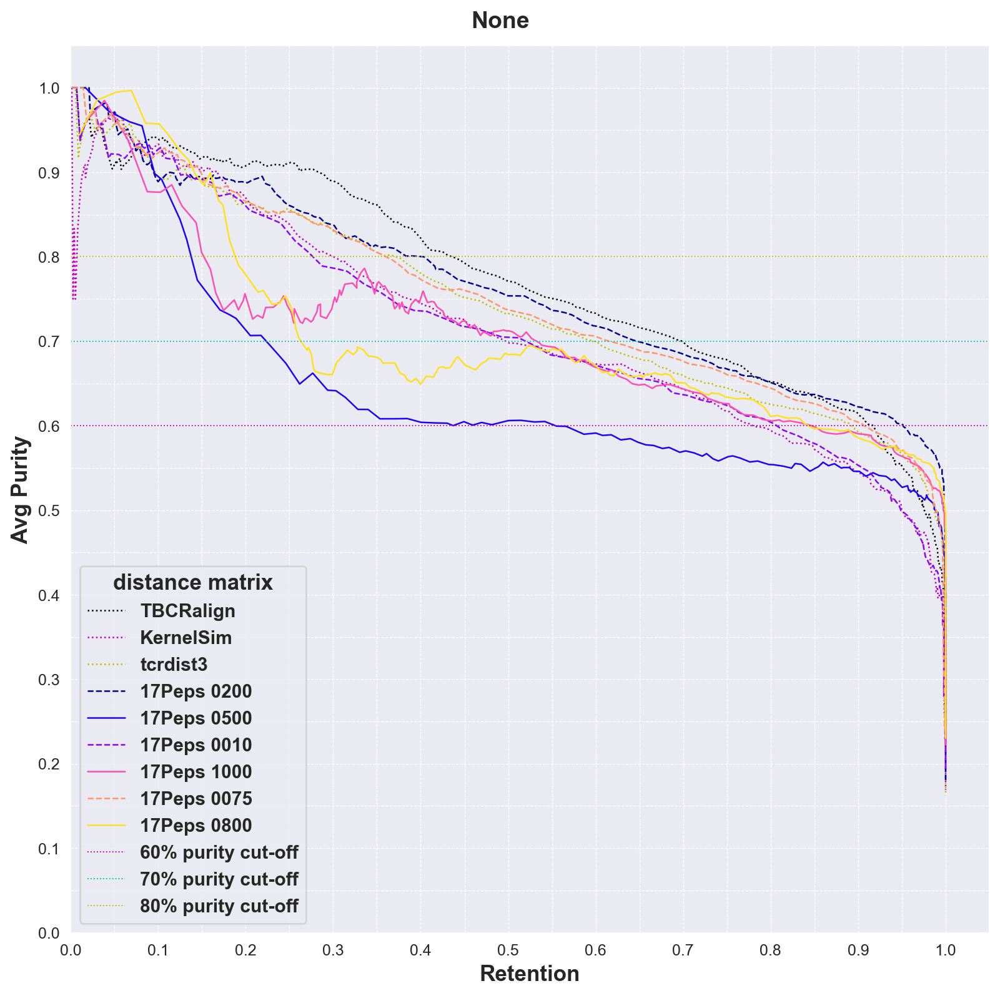

In [338]:
plot_pipeline(results_all_partitions.query('input_type.str.contains("0") and not input_type.str.contains("FullExp")').drop_duplicates(), 
              baselines_valid.drop_duplicates())

In [339]:
# Do a merged similarity thing again
df_filt = new_df_filt.query('partition==0')
model = get_model('../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0200_KFold_0_AllTriplet/')
cos_df = get_latent_df(model, df_filt)
# sort cos_df
cos_df = cos_df.set_index('raw_index').loc[tbcr_dm140_part0['raw_index'].values].reset_index()
cos_dm, cos_array, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(cos_df)

# AGG_RESULTS IS THE ONE FROM 17PEPS TRAINSET
agg_mul = 1- np.multiply((1-cos_array), (1-tbcr_array))
agg_results = cluster_all_thresholds(agg_mul, features, labels, encoded_labels, label_encoder, n_points=500)

Reloading best model:
Best epoch: 19388
total: 0.1286619007587433
reconstruction: 0.09704592823982239
kld: 0.003539084689691663
triplet: 0.028076887130737305
seq_accuracy: 0.9884433746337891
pos_accuracy: 0.9974499940872192
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


In [341]:
# Do a merged similarity thing again
df_filt = new_df_filt.query('partition==0')
model_full = get_model('../output/240428_FixTriplet/240426_1612_FullExp_RedoMargin_0200_KFold_0_AllTriplet/')
cos_df_full = get_latent_df(model_full, df_filt)
# sort cos_df
cos_df_full = cos_df_full.set_index('raw_index').loc[tbcr_dm140_part0['raw_index'].values].reset_index()
cos_dm_full, cos_array_full, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(cos_df_full)
# AGG_RESULTS_FULL IS THE ONE FROM FULL_EXPANDED TRAINSET
agg_mul_full = 1- np.multiply((1-cos_array_full), (1-tbcr_array))
agg_results_full = cluster_all_thresholds(agg_mul_full, features, labels, encoded_labels, label_encoder, n_points=500)


Reloading best model:
Best epoch: 19642
total: 0.08294446766376495
reconstruction: 0.06290315836668015
kld: 0.003458661027252674
triplet: 0.01658264920115471
seq_accuracy: 0.9935669302940369
pos_accuracy: 0.9977483153343201
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


In [346]:
# Get the results from the other notebook
# Do a merged similarity thing again
df_filt = new_df_filt.query('partition==0')
model_old = get_model('../output/240404_TCRONLY_onetwostage_smallLARGE/240404_2342_ExpData_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_SmCosTCRP1/')
cos_df_old = get_latent_df(model_old, df_filt)
# sort cos_df
cos_df_old = cos_df_old.set_index('raw_index').loc[tbcr_dm140_part0['raw_index'].values].reset_index()
cos_dm_old, cos_array_old, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(cos_df_old)
agg_mul_old = 1- np.multiply((1-cos_array_old), (1-tbcr_array))
# HERE OLD IS THE old costrp model with margin 0.1 and the wrong 'self' distance loss
agg_results_old = cluster_all_thresholds(agg_mul_old, features, labels, encoded_labels, label_encoder, n_points=500)

Reloading best model:
Best epoch: 11882
total: 0.10637179474033316
reconstruction: 0.08248233795166016
kld: 0.0027784218546003103
triplet: 0.021111038426532353
seq_accuracy: 0.9905097484588623
pos_accuracy: 0.9976889491081238
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:51<00:00,  9.65it/s]


False
TBCRalign 	 0.7715
KernelSim 	 0.7165
tcrdist3 	 0.742
17Peps_0200 	 0.7625
FullExp_0200 	 0.7557
AggMul Cos17Peps 	 0.7834
AggMul CosFull 	 0.7835
AggMul Old 	 0.7838


,threshold,n_cluster,n_singletons,n_cluster_over_70p,mean_purity,min_purity,max_purity,mean_coherence,min_coherence,max_coherence,mean_cluster_size,min_cluster_size,max_cluster_size,silhouette,ch_index,db_index,ARI,retention,input_type
0,0.02729,0,1471,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,TBCRalign
1,0.02787,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
2,0.02846,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
3,0.02904,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
4,0.02963,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.64246,2,0,0,0.218035,0.158293,0.277778,0.413529,0.384066,0.442991,735.5,18.0,1453.0,NaN,NaN,NaN,NaN,1.00000,AggMul Old
496,0.64365,2,0,0,0.218035,0.158293,0.277778,0.413529,0.384066,0.442991,735.5,18.0,1453.0,NaN,NaN,NaN,NaN,1.00000,AggMul Old
497,0.64485,2,0,0,0.218035,0.158293,0.277778,0.413529,0.384066,0.442991,735.5,18.0,1453.0,NaN,NaN,NaN,NaN,1.00000,AggMul Old
498,0.64604,2,0,0,0.218035,0.158293,0.277778,0.413529,0.384066,0.442991,735.5,18.0,1453.0,NaN,NaN,NaN,NaN,1.00000,AggMul Old


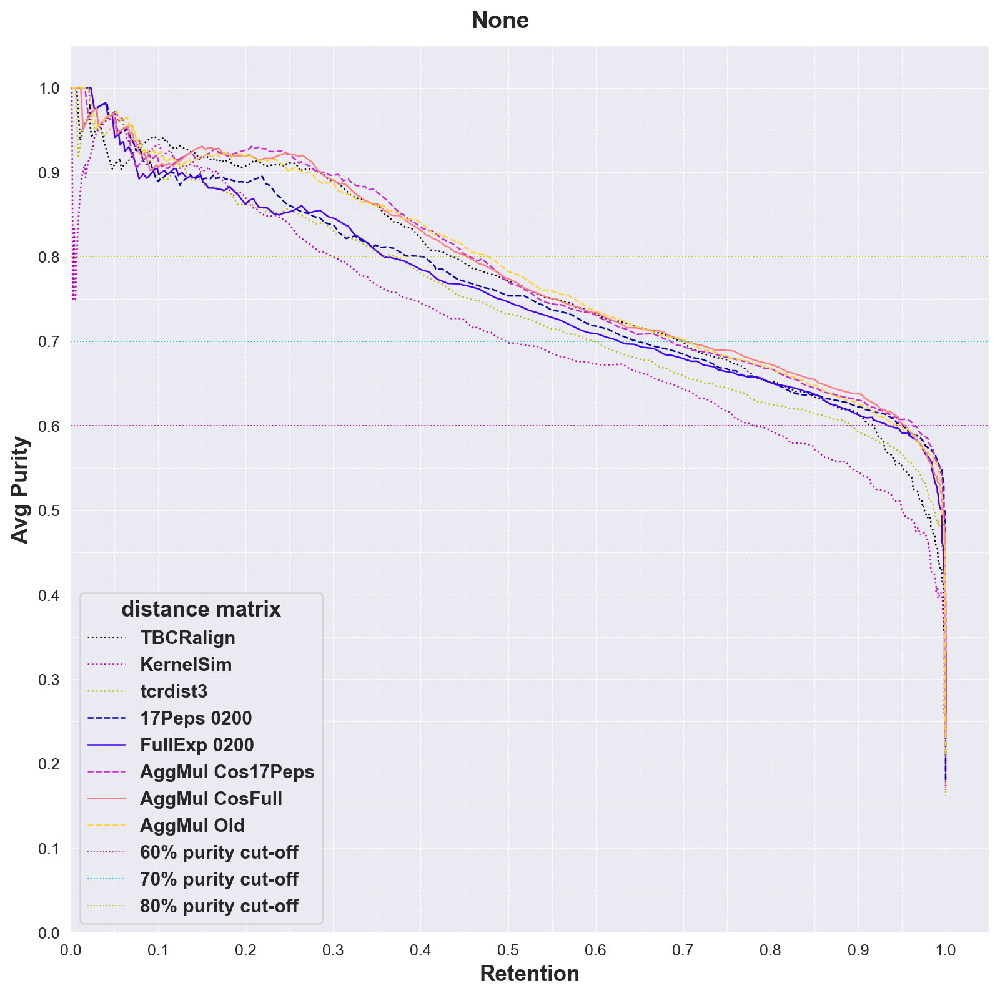

In [347]:
plot_pipeline(pd.concat([results_all_partitions.query('input_type.str.contains("0") and input_type.str.contains("0200")').drop_duplicates(), 
                         agg_results.assign(input_type='AggMul Cos17Peps'), agg_results_full.assign(input_type='AggMul CosFull'), 
                         agg_results_old.assign(input_type='AggMul Old')]), 
              baselines_valid.drop_duplicates())

# Interval runs using fixed triplet loss

In [ ]:
df_filt = new_df.query('partition==0 and peptide in @new_min20binders')

### actual runs

In [469]:
main_folder = '../output/240428_FixTriplet/'
files = glob.glob(f'{main_folder}*/')
names = ['_'.join(x.replace(main_folder,'').replace('RedoMargin_','').split('_')[2:]).split('_KFo')[0].replace('_leave','').replace('_out','') for x in files]
names

['FullExp_0010',
 '17Peps_0200',
 'FullExp_0800',
 'FullExp_0500',
 'FullExp_0200',
 '17Peps_0500',
 '17Peps_0010',
 'FullExp_0075',
 '17Peps_1000',
 'FullExp_1000',
 '17Peps_0075',
 '17Peps_0800']

In [73]:
df_old

,A1,A2,A3,B1,B2,B3,peptide,allele,origin,binder,partition,original_peptide,original_index,len_q
0,YGATPY,YFSGDTLV,AVGAPSTSGTYKYI,MGHRA,YSYEKL,ASSQDPGFGGGSYEQY,RFPLTFGWCF,HLA-A*24:02,IEDB,1,1,RFPLTFGWCF,5498,6
1,TRDTTYY,RNSFDEQN,ALSEAGTGGSYIPT,SGHTA,FQGNSA,ASSGLEGAGDTQY,GILGFVFTL,HLA-A*02:01,VDJdb,1,1,GILGFVFTL,5414,7
2,YGATPY,YFSGDTLV,AGPNNFGNEKLT,MNHEY,SMNVEV,ASSRGTGFNEQY,KLGGALQAK,HLA-A*03:01,10x,1,1,KLGGALQAK,2406,6
3,SIFNT,LYKAGEL,AGQLGGGSQGNLI,LNHDA,SQIVND,ASSFRSSYEQY,GILGFVFTL,HLA-A*02:01,VDJdb,1,2,GILGFVFTL,4816,5
4,TSDQSYG,QGSYDEQN,AMREGMEYGNKLV,LNHDA,SHIVND,ASSIFSTPNQPQH,GILGFVFTL,HLA-A*02:01,VDJdb,1,0,GILGFVFTL,5429,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6348,NIATNDY,GYKTK,LVGDHTGGFKTI,SGHNT,YYREEE,ASSTPGDEQY,DATYQRTRALVR,HLA-A*68:01,VDJdb,1,0,DATYQRTRALVR,4496,7
6349,NSAFQY,TYSSGN,AMSLIVNTPLV,SGHTA,FQGNSA,ASSLIGGGKNQPQH,KLGGALQAK,HLA-A*03:01,10x,1,0,KLGGALQAK,4153,6
6350,NSASQS,VYSSG,VVNAADSWGKLQ,PRHDT,FYEKMQ,ASSFPGGGNTGELF,YLQPRTFLL,HLA-A*02:01,VDJdb,1,3,YLQPRTFLL,648,6
6351,VSGLRG,LYSAGEE,AVPDNYGQNFV,LNHDA,SQIVND,ASSARSSYEQY,GILGFVFTL,HLA-A*02:01,10x,1,2,GILGFVFTL,855,6




 ../output/240428_FixTriplet/240426_1609_FullExp_RedoMargin_0010_KFold_0_AllTriplet/
FullExp_0010 


Reloading best model:
epoch: 2000
total: 0.23793306946754456
reconstruction: 0.22955432534217834
kld: 0.005282153841108084
triplet: 0.0030965942423790693
seq_accuracy: 0.9517216086387634
pos_accuracy: 0.9984748363494873
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.71it/s]


Reloading best model:
epoch: 4000
total: 0.2022118866443634
reconstruction: 0.1949939727783203
kld: 0.004774368368089199
triplet: 0.002443557372316718
seq_accuracy: 0.9684470295906067
pos_accuracy: 0.9979346990585327
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.49it/s]


Reloading best model:
epoch: 6000
total: 0.14108428359031677
reconstruction: 0.1343366503715515
kld: 0.00457340944558382
triplet: 0.0021742212120443583
seq_accuracy: 0.9807924032211304
pos_accuracy: 0.9979357719421387
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.92it/s]


Reloading best model:
epoch: 8000
total: 0.1432012915611267
reconstruction: 0.13670964539051056
kld: 0.004459333140403032
triplet: 0.002032312098890543
seq_accuracy: 0.9843986630439758
pos_accuracy: 0.9978275299072266
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.34it/s]


Reloading best model:
epoch: 10000
total: 0.1200236901640892
reconstruction: 0.11365525424480438
kld: 0.004449996165931225
triplet: 0.0019184398697689176
seq_accuracy: 0.9866412281990051
pos_accuracy: 0.9977878928184509
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.00it/s]


Reloading best model:
epoch: 12000
total: 0.13735757768154144
reconstruction: 0.13107796013355255
kld: 0.004324133042246103
triplet: 0.001955481944605708
seq_accuracy: 0.9825664162635803
pos_accuracy: 0.9976412057876587
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.06it/s]


Reloading best model:
epoch: 14000
total: 0.11221110075712204
reconstruction: 0.10600357502698898
kld: 0.004350443836301565
triplet: 0.0018570763058960438
seq_accuracy: 0.9874861836433411
pos_accuracy: 0.9977564811706543
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.22it/s]


Reloading best model:
epoch: 16000
total: 0.09360535442829132
reconstruction: 0.08741090446710587
kld: 0.004357174504548311
triplet: 0.001837272197008133
seq_accuracy: 0.9907712340354919
pos_accuracy: 0.9977902770042419
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.98it/s]


Reloading best model:
epoch: 18000
total: 0.07577315717935562
reconstruction: 0.06963062286376953
kld: 0.004355245269834995
triplet: 0.0017872931202873588
seq_accuracy: 0.9922505021095276
pos_accuracy: 0.9978042244911194
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.33it/s]


Reloading best model:
epoch: 20000
total: 0.08108218759298325
reconstruction: 0.07497254014015198
kld: 0.0043196529150009155
triplet: 0.0017899968661367893
seq_accuracy: 0.9917793869972229
pos_accuracy: 0.9977890849113464
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.94it/s]


Reloading best model:
Best epoch: 19841
total: 0.0745491310954094
reconstruction: 0.06844112277030945
kld: 0.004332239739596844
triplet: 0.001775770797394216
seq_accuracy: 0.993200421333313
pos_accuracy: 0.9978589415550232
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.10it/s]




 ../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0200_KFold_0_AllTriplet/
17Peps_0200 


Reloading best model:
epoch: 2000
total: 0.34296002984046936
reconstruction: 0.30993446707725525
kld: 0.0043134549632668495
triplet: 0.028712093830108643
seq_accuracy: 0.9253524541854858
pos_accuracy: 0.9991742372512817
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.40it/s]


Reloading best model:
epoch: 4000
total: 0.23733168840408325
reconstruction: 0.20496191084384918
kld: 0.004013786558061838
triplet: 0.028355993330478668
seq_accuracy: 0.962957501411438
pos_accuracy: 0.9978099465370178
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.89it/s]


Reloading best model:
epoch: 6000
total: 0.23586291074752808
reconstruction: 0.2034846693277359
kld: 0.0038797457236796618
triplet: 0.02849850058555603
seq_accuracy: 0.968456506729126
pos_accuracy: 0.9979590177536011
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:50<00:00,  9.94it/s]


Reloading best model:
epoch: 8000
total: 0.18826720118522644
reconstruction: 0.1562609225511551
kld: 0.0037439032457768917
triplet: 0.028262373059988022
seq_accuracy: 0.9769768714904785
pos_accuracy: 0.997510552406311
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:50<00:00,  9.93it/s]


Reloading best model:
epoch: 10000
total: 0.16722583770751953
reconstruction: 0.13542930781841278
kld: 0.003640583949163556
triplet: 0.028155948966741562
seq_accuracy: 0.9818323254585266
pos_accuracy: 0.9975321888923645
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.49it/s]


Reloading best model:
epoch: 12000
total: 0.1562606692314148
reconstruction: 0.12454996258020401
kld: 0.003593184519559145
triplet: 0.028117530047893524
seq_accuracy: 0.9838122129440308
pos_accuracy: 0.9976206421852112
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.40it/s]


Reloading best model:
epoch: 14000
total: 0.16221655905246735
reconstruction: 0.13052110373973846
kld: 0.003588648745790124
triplet: 0.02810681238770485
seq_accuracy: 0.9831010103225708
pos_accuracy: 0.9975570440292358
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.64it/s]


Reloading best model:
epoch: 16000
total: 0.14084076881408691
reconstruction: 0.1092110127210617
kld: 0.0035368972457945347
triplet: 0.02809285931289196
seq_accuracy: 0.9863135814666748
pos_accuracy: 0.9974887371063232
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.57it/s]


Reloading best model:
epoch: 18000
total: 0.13565406203269958
reconstruction: 0.10403923690319061
kld: 0.0035334359854459763
triplet: 0.028081394731998444
seq_accuracy: 0.9879186153411865
pos_accuracy: 0.9974779486656189
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.65it/s]


Reloading best model:
epoch: 20000
total: 0.14433012902736664
reconstruction: 0.11270037293434143
kld: 0.003538824850693345
triplet: 0.028090927749872208
seq_accuracy: 0.9861937761306763
pos_accuracy: 0.9975523948669434
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.51it/s]


Reloading best model:
Best epoch: 19388
total: 0.1286619007587433
reconstruction: 0.09704592823982239
kld: 0.003539084689691663
triplet: 0.028076887130737305
seq_accuracy: 0.9884433746337891
pos_accuracy: 0.9974499940872192
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.57it/s]




 ../output/240428_FixTriplet/240426_1623_FullExp_RedoMargin_0800_KFold_0_AllTriplet/
FullExp_0800 


Reloading best model:
epoch: 2000
total: 0.31018152832984924
reconstruction: 0.24125362932682037
kld: 0.003138048341497779
triplet: 0.0657898485660553
seq_accuracy: 0.9536567330360413
pos_accuracy: 0.9983071088790894
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:51<00:00,  9.79it/s]


Reloading best model:
epoch: 4000
total: 0.23615849018096924
reconstruction: 0.16101574897766113
kld: 0.0034332950599491596
triplet: 0.07170943915843964
seq_accuracy: 0.973666250705719
pos_accuracy: 0.9980382323265076
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:40<00:00, 12.49it/s]


Reloading best model:
epoch: 6000
total: 0.21584486961364746
reconstruction: 0.1350756287574768
kld: 0.003425018163397908
triplet: 0.07734422385692596
seq_accuracy: 0.9808302521705627
pos_accuracy: 0.997982382774353
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.73it/s]


Reloading best model:
epoch: 8000
total: 0.206220805644989
reconstruction: 0.12326809018850327
kld: 0.0032142959535121918
triplet: 0.07973843067884445
seq_accuracy: 0.9834581613540649
pos_accuracy: 0.9978612661361694
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.63it/s]


Reloading best model:
epoch: 10000
total: 0.18561691045761108
reconstruction: 0.09939558804035187
kld: 0.0032829963602125645
triplet: 0.08293832838535309
seq_accuracy: 0.9878429174423218
pos_accuracy: 0.9978903532028198
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.94it/s]


Reloading best model:
epoch: 12000
total: 0.19477194547653198
reconstruction: 0.11252366751432419
kld: 0.0032205325551331043
triplet: 0.07902774214744568
seq_accuracy: 0.9871039390563965
pos_accuracy: 0.9977425932884216
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.80it/s]


Reloading best model:
epoch: 14000
total: 0.16605588793754578
reconstruction: 0.08344359695911407
kld: 0.0032223593443632126
triplet: 0.07938992977142334
seq_accuracy: 0.9900728464126587
pos_accuracy: 0.997847318649292
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.89it/s]


Reloading best model:
epoch: 16000
total: 0.19691278040409088
reconstruction: 0.11261481046676636
kld: 0.003152369987219572
triplet: 0.08114559948444366
seq_accuracy: 0.9875025749206543
pos_accuracy: 0.9978309273719788
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.95it/s]


Reloading best model:
epoch: 18000
total: 0.16354012489318848
reconstruction: 0.0772092416882515
kld: 0.003145636757835746
triplet: 0.08318524062633514
seq_accuracy: 0.9908028841018677
pos_accuracy: 0.9978391528129578
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.00it/s]


Reloading best model:
epoch: 20000
total: 0.1642315685749054
reconstruction: 0.08285608887672424
kld: 0.00315910205245018
triplet: 0.07821636646986008
seq_accuracy: 0.9897721409797668
pos_accuracy: 0.9977821707725525
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.84it/s]


Reloading best model:
Best epoch: 19953
total: 0.1493692696094513
reconstruction: 0.0651860237121582
kld: 0.0031881609465926886
triplet: 0.08099507540464401
seq_accuracy: 0.9924062490463257
pos_accuracy: 0.9978647232055664
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.98it/s]




 ../output/240428_FixTriplet/240426_1617_FullExp_RedoMargin_0500_KFold_0_AllTriplet/
FullExp_0500 


Reloading best model:
epoch: 2000
total: 0.2719758152961731
reconstruction: 0.22729358077049255
kld: 0.003467549104243517
triplet: 0.041214682161808014
seq_accuracy: 0.9544339776039124
pos_accuracy: 0.9983142018318176
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.57it/s]


Reloading best model:
epoch: 4000
total: 0.2167208045721054
reconstruction: 0.1724766194820404
kld: 0.003330525476485491
triplet: 0.0409136526286602
seq_accuracy: 0.9731398820877075
pos_accuracy: 0.9978554248809814
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:50<00:00,  9.85it/s]


Reloading best model:
epoch: 6000
total: 0.16661186516284943
reconstruction: 0.12265033274888992
kld: 0.0032090251334011555
triplet: 0.04075249657034874
seq_accuracy: 0.9840105772018433
pos_accuracy: 0.9978682994842529
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:50<00:00,  9.89it/s]


Reloading best model:
epoch: 8000
total: 0.1668206751346588
reconstruction: 0.11848242580890656
kld: 0.0038019123021513224
triplet: 0.044536344707012177
seq_accuracy: 0.9846919178962708
pos_accuracy: 0.9977681040763855
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.26it/s]


Reloading best model:
epoch: 10000
total: 0.15444821119308472
reconstruction: 0.10357145965099335
kld: 0.0033284821547567844
triplet: 0.04754827171564102
seq_accuracy: 0.9871044158935547
pos_accuracy: 0.9977401494979858
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.67it/s]


Reloading best model:
epoch: 12000
total: 0.14050433039665222
reconstruction: 0.08939441293478012
kld: 0.003282025922089815
triplet: 0.047827888280153275
seq_accuracy: 0.9894613027572632
pos_accuracy: 0.9976645708084106
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.51it/s]


Reloading best model:
epoch: 14000
total: 0.1309010088443756
reconstruction: 0.0791957825422287
kld: 0.003306446596980095
triplet: 0.04839877784252167
seq_accuracy: 0.9895210862159729
pos_accuracy: 0.9977670311927795
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.94it/s]


Reloading best model:
epoch: 16000
total: 0.14867809414863586
reconstruction: 0.0976221039891243
kld: 0.0032604574225842953
triplet: 0.04779554158449173
seq_accuracy: 0.9869515895843506
pos_accuracy: 0.9977378845214844
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.52it/s]


Reloading best model:
epoch: 18000
total: 0.15107344090938568
reconstruction: 0.09553408622741699
kld: 0.003355152904987335
triplet: 0.052184198051691055
seq_accuracy: 0.9896388053894043
pos_accuracy: 0.9975981712341309
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.70it/s]


Reloading best model:
epoch: 20000
total: 0.15245240926742554
reconstruction: 0.10011200606822968
kld: 0.0032740868628025055
triplet: 0.04906632751226425
seq_accuracy: 0.9889611601829529
pos_accuracy: 0.9977506399154663
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.85it/s]


Reloading best model:
Best epoch: 19891
total: 0.12523341178894043
reconstruction: 0.07081423699855804
kld: 0.003310051979497075
triplet: 0.05110912770032883
seq_accuracy: 0.9923712611198425
pos_accuracy: 0.9976295828819275
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.82it/s]




 ../output/240428_FixTriplet/240426_1612_FullExp_RedoMargin_0200_KFold_0_AllTriplet/
FullExp_0200 


Reloading best model:
epoch: 2000
total: 0.25656235218048096
reconstruction: 0.23540563881397247
kld: 0.004116660449653864
triplet: 0.017040051519870758
seq_accuracy: 0.9515870213508606
pos_accuracy: 0.9984760284423828
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:41<00:00, 12.11it/s]


Reloading best model:
epoch: 4000
total: 0.17570263147354126
reconstruction: 0.1551276445388794
kld: 0.003814477240666747
triplet: 0.016760509461164474
seq_accuracy: 0.9761480689048767
pos_accuracy: 0.9978659152984619
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 11.08it/s]


Reloading best model:
epoch: 6000
total: 0.1647951751947403
reconstruction: 0.14447185397148132
kld: 0.003622642019763589
triplet: 0.016700688749551773
seq_accuracy: 0.979182243347168
pos_accuracy: 0.9977971911430359
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.17it/s]


Reloading best model:
epoch: 8000
total: 0.14072851836681366
reconstruction: 0.12049783766269684
kld: 0.003503792453557253
triplet: 0.016726883128285408
seq_accuracy: 0.984906792640686
pos_accuracy: 0.9978449940681458
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 11.02it/s]


Reloading best model:
epoch: 10000
total: 0.12179256230592728
reconstruction: 0.10166969150304794
kld: 0.0035102241672575474
triplet: 0.016612650826573372
seq_accuracy: 0.9884697198867798
pos_accuracy: 0.9978531002998352
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.99it/s]


Reloading best model:
epoch: 12000
total: 0.1208481565117836
reconstruction: 0.1005990281701088
kld: 0.0035340359900146723
triplet: 0.016715094447135925
seq_accuracy: 0.9897812008857727
pos_accuracy: 0.9976458549499512
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.17it/s]


Reloading best model:
epoch: 14000
total: 0.1044369488954544
reconstruction: 0.0842626690864563
kld: 0.0035038371570408344
triplet: 0.01667044684290886
seq_accuracy: 0.9909510016441345
pos_accuracy: 0.9978542923927307
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 11.09it/s]


Reloading best model:
epoch: 16000
total: 0.10956061631441116
reconstruction: 0.08954891562461853
kld: 0.0034245052374899387
triplet: 0.01658719778060913
seq_accuracy: 0.9907898902893066
pos_accuracy: 0.9978240132331848
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.97it/s]


Reloading best model:
epoch: 18000
total: 0.10694117844104767
reconstruction: 0.0869639441370964
kld: 0.003416628111153841
triplet: 0.01656060479581356
seq_accuracy: 0.9921901822090149
pos_accuracy: 0.9977285265922546
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.65it/s]


Reloading best model:
epoch: 20000
total: 0.10689374804496765
reconstruction: 0.08691595494747162
kld: 0.0034296337980777025
triplet: 0.01654815301299095
seq_accuracy: 0.9919723272323608
pos_accuracy: 0.9977972507476807
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.74it/s]


Reloading best model:
Best epoch: 19642
total: 0.08294446766376495
reconstruction: 0.06290315836668015
kld: 0.003458661027252674
triplet: 0.01658264920115471
seq_accuracy: 0.9935669302940369
pos_accuracy: 0.9977483153343201
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.82it/s]




 ../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0500_KFold_0_AllTriplet/
17Peps_0500 


Reloading best model:
epoch: 2000
total: 0.3728070557117462
reconstruction: 0.2987205982208252
kld: 0.0036766710691154003
triplet: 0.07040978223085403
seq_accuracy: 0.9316138029098511
pos_accuracy: 0.9991634488105774
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:42<00:00, 11.76it/s]


Reloading best model:
epoch: 4000
total: 0.30174246430397034
reconstruction: 0.21300841867923737
kld: 0.004158282186836004
triplet: 0.08457576483488083
seq_accuracy: 0.9638585448265076
pos_accuracy: 0.9979481101036072
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.19it/s]


Reloading best model:
epoch: 6000
total: 0.2951699495315552
reconstruction: 0.20402872562408447
kld: 0.003956493455916643
triplet: 0.08718472719192505
seq_accuracy: 0.9665715098381042
pos_accuracy: 0.9978737831115723
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.88it/s]


Reloading best model:
epoch: 8000
total: 0.24794283509254456
reconstruction: 0.15480272471904755
kld: 0.0038094865158200264
triplet: 0.08933062851428986
seq_accuracy: 0.9775113463401794
pos_accuracy: 0.9976145029067993
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.33it/s]


Reloading best model:
epoch: 10000
total: 0.23578917980194092
reconstruction: 0.14135132730007172
kld: 0.003813006216660142
triplet: 0.0906248390674591
seq_accuracy: 0.9804480671882629
pos_accuracy: 0.9975446462631226
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 16.75it/s]


Reloading best model:
epoch: 12000
total: 0.22330203652381897
reconstruction: 0.1279744654893875
kld: 0.0037248407024890184
triplet: 0.09160273522138596
seq_accuracy: 0.9827868342399597
pos_accuracy: 0.9976330995559692
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.33it/s]


Reloading best model:
epoch: 14000
total: 0.2527856230735779
reconstruction: 0.15910188853740692
kld: 0.0036787905264645815
triplet: 0.09000495821237564
seq_accuracy: 0.9787243604660034
pos_accuracy: 0.9974623322486877
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:29<00:00, 17.02it/s]


Reloading best model:
epoch: 16000
total: 0.24203310906887054
reconstruction: 0.1461414396762848
kld: 0.003624385455623269
triplet: 0.09226728975772858
seq_accuracy: 0.9827942252159119
pos_accuracy: 0.9975353479385376
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.11it/s]


Reloading best model:
epoch: 18000
total: 0.22051456570625305
reconstruction: 0.10848060995340347
kld: 0.004756431560963392
triplet: 0.1072775200009346
seq_accuracy: 0.98605877161026
pos_accuracy: 0.9974173307418823
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.08it/s]


Reloading best model:
epoch: 20000
total: 0.21621429920196533
reconstruction: 0.10897515714168549
kld: 0.00394927803426981
triplet: 0.10328985750675201
seq_accuracy: 0.9859540462493896
pos_accuracy: 0.9976750016212463
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:23<00:00, 21.40it/s]


Reloading best model:
Best epoch: 19675
total: 0.2137603461742401
reconstruction: 0.10347872227430344
kld: 0.003930866252630949
triplet: 0.10635074973106384
seq_accuracy: 0.9892340898513794
pos_accuracy: 0.9975804090499878
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:24<00:00, 20.13it/s]




 ../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0010_KFold_0_AllTriplet/
17Peps_0010 


Reloading best model:
epoch: 2000
total: 0.3343130946159363
reconstruction: 0.3242310583591461
kld: 0.006142996251583099
triplet: 0.003939034417271614
seq_accuracy: 0.9269915223121643
pos_accuracy: 0.9991929531097412
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:28<00:00, 17.43it/s]


Reloading best model:
epoch: 4000
total: 0.2351304590702057
reconstruction: 0.22660744190216064
kld: 0.005290289409458637
triplet: 0.0032327345106750727
seq_accuracy: 0.9563674330711365
pos_accuracy: 0.9977449178695679
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:11<00:00,  6.99it/s]


Reloading best model:
epoch: 6000
total: 0.22610139846801758
reconstruction: 0.21827922761440277
kld: 0.005013877525925636
triplet: 0.0028082814533263445
seq_accuracy: 0.9660138487815857
pos_accuracy: 0.9980025887489319
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:41<00:00, 12.15it/s]


Reloading best model:
epoch: 8000
total: 0.17579208314418793
reconstruction: 0.16834372282028198
kld: 0.004801487550139427
triplet: 0.0026468844152987003
seq_accuracy: 0.9750873446464539
pos_accuracy: 0.9976781606674194
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.22it/s]


Reloading best model:
epoch: 10000
total: 0.1413869708776474
reconstruction: 0.13417580723762512
kld: 0.004741552751511335
triplet: 0.0024696113541722298
seq_accuracy: 0.9811191558837891
pos_accuracy: 0.9977060556411743
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.48it/s]


Reloading best model:
epoch: 12000
total: 0.14421366155147552
reconstruction: 0.1371585875749588
kld: 0.0046807932667434216
triplet: 0.002374269999563694
seq_accuracy: 0.9816604852676392
pos_accuracy: 0.9977138042449951
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.37it/s]


Reloading best model:
epoch: 14000
total: 0.15194183588027954
reconstruction: 0.14497414231300354
kld: 0.0046664136461913586
triplet: 0.0023012692108750343
seq_accuracy: 0.9802325963973999
pos_accuracy: 0.9976145029067993
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.96it/s]


Reloading best model:
epoch: 16000
total: 0.1340276598930359
reconstruction: 0.12713244557380676
kld: 0.0046230219304561615
triplet: 0.0022721951827406883
seq_accuracy: 0.9850339889526367
pos_accuracy: 0.9975135922431946
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.50it/s]


Reloading best model:
epoch: 18000
total: 0.12817224860191345
reconstruction: 0.12131089717149734
kld: 0.004616093821823597
triplet: 0.0022452655248343945
seq_accuracy: 0.9852060675621033
pos_accuracy: 0.9975073933601379
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 16.12it/s]


Reloading best model:
epoch: 20000
total: 0.11843661218881607
reconstruction: 0.11160652339458466
kld: 0.004573331214487553
triplet: 0.002256757114082575
seq_accuracy: 0.9873705506324768
pos_accuracy: 0.9975911974906921
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:31<00:00, 15.74it/s]


Reloading best model:
Best epoch: 19269
total: 0.10209546238183975
reconstruction: 0.09525901824235916
kld: 0.004612585064023733
triplet: 0.0022238590754568577
seq_accuracy: 0.9892114996910095
pos_accuracy: 0.9975554943084717
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.16it/s]




 ../output/240428_FixTriplet/240426_1612_FullExp_RedoMargin_0075_KFold_0_AllTriplet/
FullExp_0075 


Reloading best model:
epoch: 2000
total: 0.23899787664413452
reconstruction: 0.22715143859386444
kld: 0.004915192257612944
triplet: 0.006931251380592585
seq_accuracy: 0.9556410908699036
pos_accuracy: 0.9985260963439941
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.88it/s]


Reloading best model:
epoch: 4000
total: 0.1928907036781311
reconstruction: 0.18187294900417328
kld: 0.004349622409790754
triplet: 0.006668135058134794
seq_accuracy: 0.9720625877380371
pos_accuracy: 0.997841477394104
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.92it/s]


Reloading best model:
epoch: 6000
total: 0.13468390703201294
reconstruction: 0.12399229407310486
kld: 0.004109737928956747
triplet: 0.0065818727016448975
seq_accuracy: 0.9833071231842041
pos_accuracy: 0.9978345036506653
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.34it/s]


Reloading best model:
epoch: 8000
total: 0.15102271735668182
reconstruction: 0.14051538705825806
kld: 0.003958821762353182
triplet: 0.00654850248247385
seq_accuracy: 0.9781731963157654
pos_accuracy: 0.9977436661720276
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.94it/s]


Reloading best model:
epoch: 10000
total: 0.11064660549163818
reconstruction: 0.10021405667066574
kld: 0.003897851100191474
triplet: 0.006534697953611612
seq_accuracy: 0.9877371788024902
pos_accuracy: 0.9977506995201111
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.25it/s]


Reloading best model:
epoch: 12000
total: 0.10208401083946228
reconstruction: 0.09168780595064163
kld: 0.0038984050042927265
triplet: 0.0064977980218827724
seq_accuracy: 0.9892489910125732
pos_accuracy: 0.9976865649223328
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.04it/s]


Reloading best model:
epoch: 14000
total: 0.08220314979553223
reconstruction: 0.07186699658632278
kld: 0.003848976455628872
triplet: 0.006487173959612846
seq_accuracy: 0.9908009767532349
pos_accuracy: 0.9978204965591431
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.51it/s]


Reloading best model:
epoch: 16000
total: 0.08942075073719025
reconstruction: 0.07910719513893127
kld: 0.003824598388746381
triplet: 0.0064889537170529366
seq_accuracy: 0.9910939931869507
pos_accuracy: 0.9977565407752991
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.81it/s]


Reloading best model:
epoch: 18000
total: 0.08204767853021622
reconstruction: 0.07175639271736145
kld: 0.0038435577880591154
triplet: 0.0064477259293198586
seq_accuracy: 0.9923967719078064
pos_accuracy: 0.9977262020111084
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.68it/s]


Reloading best model:
epoch: 20000
total: 0.11178132891654968
reconstruction: 0.10145258158445358
kld: 0.003750040428712964
triplet: 0.006578702945262194
seq_accuracy: 0.9899659156799316
pos_accuracy: 0.9977192878723145
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.86it/s]


Reloading best model:
Best epoch: 18934
total: 0.07274257391691208
reconstruction: 0.06246810406446457
kld: 0.003820466808974743
triplet: 0.006454008631408215
seq_accuracy: 0.9933130145072937
pos_accuracy: 0.9977250695228577
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.95it/s]




 ../output/240428_FixTriplet/240426_1609_17Peps_RedoMargin_1000_KFold_0_AllTriplet/
17Peps_1000 


Reloading best model:
epoch: 2000
total: 0.46486696600914
reconstruction: 0.30169597268104553
kld: 0.003452902426943183
triplet: 0.1597180962562561
seq_accuracy: 0.9276973605155945
pos_accuracy: 0.999157190322876
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:50<00:00,  9.93it/s]


Reloading best model:
epoch: 4000
total: 0.3837908208370209
reconstruction: 0.22497676312923431
kld: 0.004024561028927565
triplet: 0.1547894924879074
seq_accuracy: 0.9590796232223511
pos_accuracy: 0.9979263544082642
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.98it/s]


Reloading best model:
epoch: 6000
total: 0.3971557021141052
reconstruction: 0.21829788386821747
kld: 0.0042505329474806786
triplet: 0.1746072769165039
seq_accuracy: 0.9637070298194885
pos_accuracy: 0.9980583190917969
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.34it/s]


Reloading best model:
epoch: 8000
total: 0.36886847019195557
reconstruction: 0.18803495168685913
kld: 0.0035862743388861418
triplet: 0.17724722623825073
seq_accuracy: 0.9707354307174683
pos_accuracy: 0.997786819934845
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 12.96it/s]


Reloading best model:
epoch: 10000
total: 0.32057178020477295
reconstruction: 0.14675940573215485
kld: 0.0035524822305887938
triplet: 0.17025990784168243
seq_accuracy: 0.9786750674247742
pos_accuracy: 0.9976671934127808
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.40it/s]


Reloading best model:
epoch: 12000
total: 0.3182417154312134
reconstruction: 0.14432714879512787
kld: 0.0037326705642044544
triplet: 0.17018190026283264
seq_accuracy: 0.9797748923301697
pos_accuracy: 0.9978457093238831
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.74it/s]


Reloading best model:
epoch: 14000
total: 0.33625054359436035
reconstruction: 0.1657247692346573
kld: 0.0036088840570300817
triplet: 0.1669168770313263
seq_accuracy: 0.9741033315658569
pos_accuracy: 0.9978954195976257
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.64it/s]


Reloading best model:
epoch: 16000
total: 0.3093673288822174
reconstruction: 0.13815456628799438
kld: 0.0036025180015712976
triplet: 0.16761024296283722
seq_accuracy: 0.981475830078125
pos_accuracy: 0.9978052973747253
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.77it/s]


Reloading best model:
epoch: 18000
total: 0.29231980443000793
reconstruction: 0.12417930364608765
kld: 0.003539924742653966
triplet: 0.16460058093070984
seq_accuracy: 0.9838827252388
pos_accuracy: 0.9977633953094482
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.64it/s]


Reloading best model:
epoch: 20000
total: 0.3586481511592865
reconstruction: 0.14987704157829285
kld: 0.004270598292350769
triplet: 0.20450051128864288
seq_accuracy: 0.9797177314758301
pos_accuracy: 0.9978892207145691
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.28it/s]


Reloading best model:
Best epoch: 19554
total: 0.2765364944934845
reconstruction: 0.10963504761457443
kld: 0.0035222498700022697
triplet: 0.16337919235229492
seq_accuracy: 0.9870738387107849
pos_accuracy: 0.9977168440818787
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:52<00:00,  9.45it/s]




 ../output/240428_FixTriplet/240426_1633_FullExp_RedoMargin_1000_KFold_0_AllTriplet/
FullExp_1000 


Reloading best model:
epoch: 2000
total: 0.36281508207321167
reconstruction: 0.25459024310112
kld: 0.003329260041937232
triplet: 0.10489560663700104
seq_accuracy: 0.9468438029289246
pos_accuracy: 0.9984398484230042
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:51<00:00,  9.63it/s]


Reloading best model:
epoch: 4000
total: 0.28315824270248413
reconstruction: 0.1732618659734726
kld: 0.0033280011266469955
triplet: 0.10656838864088058
seq_accuracy: 0.9719268083572388
pos_accuracy: 0.9979672431945801
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [01:05<00:00,  7.64it/s]


Reloading best model:
epoch: 6000
total: 0.24127520620822906
reconstruction: 0.1349649876356125
kld: 0.0032446649856865406
triplet: 0.10306555032730103
seq_accuracy: 0.9808980226516724
pos_accuracy: 0.9979031682014465
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.99it/s]


Reloading best model:
epoch: 8000
total: 0.2575182020664215
reconstruction: 0.1461021453142166
kld: 0.0034146462567150593
triplet: 0.10800141096115112
seq_accuracy: 0.9777525067329407
pos_accuracy: 0.9978868961334229
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.86it/s]


Reloading best model:
epoch: 10000
total: 0.36131900548934937
reconstruction: 0.23518683016300201
kld: 0.0032205814495682716
triplet: 0.12291160225868225
seq_accuracy: 0.9644119739532471
pos_accuracy: 0.9978287220001221
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.50it/s]


Reloading best model:
epoch: 12000
total: 0.24082887172698975
reconstruction: 0.12650130689144135
kld: 0.0034139209892600775
triplet: 0.11091364920139313
seq_accuracy: 0.9826393723487854
pos_accuracy: 0.9978437423706055
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.39it/s]


Reloading best model:
epoch: 14000
total: 0.19431409239768982
reconstruction: 0.09082005172967911
kld: 0.0032300374004989862
triplet: 0.10026401281356812
seq_accuracy: 0.9884021282196045
pos_accuracy: 0.9979485869407654
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.14it/s]


Reloading best model:
epoch: 16000
total: 0.20296597480773926
reconstruction: 0.09677501767873764
kld: 0.0032248098868876696
triplet: 0.10296614468097687
seq_accuracy: 0.9877341985702515
pos_accuracy: 0.9979392290115356
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.18it/s]


Reloading best model:
epoch: 18000
total: 0.22629322111606598
reconstruction: 0.10801257938146591
kld: 0.003422175534069538
triplet: 0.1148584634065628
seq_accuracy: 0.9863381385803223
pos_accuracy: 0.9979032278060913
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:42<00:00, 11.69it/s]


Reloading best model:
epoch: 20000
total: 0.2307543158531189
reconstruction: 0.12190815806388855
kld: 0.003196054371073842
triplet: 0.10565009713172913
seq_accuracy: 0.9864399433135986
pos_accuracy: 0.9978799223899841
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.41it/s]


Reloading best model:
Best epoch: 19956
total: 0.1945163905620575
reconstruction: 0.07891830801963806
kld: 0.003742408938705921
triplet: 0.11185567080974579
seq_accuracy: 0.9916787147521973
pos_accuracy: 0.9978601336479187
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.55it/s]




 ../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0075_KFold_0_AllTriplet/
17Peps_0075 


Reloading best model:
epoch: 2000
total: 0.3176461160182953
reconstruction: 0.301065057516098
kld: 0.005222654435783625
triplet: 0.011358407326042652
seq_accuracy: 0.9314016103744507
pos_accuracy: 0.9992517828941345
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:32<00:00, 15.19it/s]


Reloading best model:
epoch: 4000
total: 0.22268635034561157
reconstruction: 0.20701561868190765
kld: 0.0046441201120615005
triplet: 0.011026613414287567
seq_accuracy: 0.9653031229972839
pos_accuracy: 0.9978364109992981
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.31it/s]


Reloading best model:
epoch: 6000
total: 0.19534549117088318
reconstruction: 0.18005505204200745
kld: 0.004391426220536232
triplet: 0.01089901477098465
seq_accuracy: 0.9714400172233582
pos_accuracy: 0.9978814125061035
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.09it/s]


Reloading best model:
epoch: 8000
total: 0.16369590163230896
reconstruction: 0.1486538201570511
kld: 0.004160027485340834
triplet: 0.010882042348384857
seq_accuracy: 0.9792022109031677
pos_accuracy: 0.9976191520690918
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.15it/s]


Reloading best model:
epoch: 10000
total: 0.14866961538791656
reconstruction: 0.13371911644935608
kld: 0.004075879231095314
triplet: 0.010874615050852299
seq_accuracy: 0.9814144968986511
pos_accuracy: 0.9976703524589539
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.75it/s]


Reloading best model:
epoch: 12000
total: 0.14043596386909485
reconstruction: 0.12555599212646484
kld: 0.0040642255917191505
triplet: 0.010815747082233429
seq_accuracy: 0.9833889603614807
pos_accuracy: 0.997726321220398
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.73it/s]


Reloading best model:
epoch: 14000
total: 0.13383415341377258
reconstruction: 0.11901908367872238
kld: 0.003976405598223209
triplet: 0.01083866786211729
seq_accuracy: 0.9838454127311707
pos_accuracy: 0.9976531863212585
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:40<00:00, 12.36it/s]


Reloading best model:
epoch: 16000
total: 0.1313169002532959
reconstruction: 0.11648889631032944
kld: 0.004029735457152128
triplet: 0.010798262432217598
seq_accuracy: 0.9865162372589111
pos_accuracy: 0.997634768486023
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:40<00:00, 12.49it/s]


Reloading best model:
epoch: 18000
total: 0.14078325033187866
reconstruction: 0.12603378295898438
kld: 0.003970845602452755
triplet: 0.010778621770441532
seq_accuracy: 0.9829818606376648
pos_accuracy: 0.997498095035553
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:39<00:00, 12.59it/s]


Reloading best model:
epoch: 20000
total: 0.11950203031301498
reconstruction: 0.1047796830534935
kld: 0.00392875773832202
triplet: 0.010793589986860752
seq_accuracy: 0.9874923229217529
pos_accuracy: 0.997597336769104
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:41<00:00, 12.16it/s]


Reloading best model:
Best epoch: 19666
total: 0.10894448310136795
reconstruction: 0.0942053347826004
kld: 0.0039469716139137745
triplet: 0.010792173445224762
seq_accuracy: 0.989261269569397
pos_accuracy: 0.997549295425415
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:41<00:00, 12.15it/s]




 ../output/240428_FixTriplet/240426_1609_17Peps_RedoMargin_0800_KFold_0_AllTriplet/
17Peps_0800 


Reloading best model:
epoch: 2000
total: 0.45124268531799316
reconstruction: 0.31851494312286377
kld: 0.003835790092125535
triplet: 0.1288919299840927
seq_accuracy: 0.9245184063911438
pos_accuracy: 0.9990687370300293
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.24it/s]


Reloading best model:
epoch: 4000
total: 0.3766857385635376
reconstruction: 0.23613093793392181
kld: 0.003819192061200738
triplet: 0.13673558831214905
seq_accuracy: 0.9574537873268127
pos_accuracy: 0.9977914690971375
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.61it/s]


Reloading best model:
epoch: 6000
total: 0.34400320053100586
reconstruction: 0.19781945645809174
kld: 0.003722656052559614
triplet: 0.14246110618114471
seq_accuracy: 0.9673860669136047
pos_accuracy: 0.9977540969848633
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:35<00:00, 13.92it/s]


Reloading best model:
epoch: 8000
total: 0.33391377329826355
reconstruction: 0.18877418339252472
kld: 0.0035166479647159576
triplet: 0.14162294566631317
seq_accuracy: 0.9706153273582458
pos_accuracy: 0.9977230429649353
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.64it/s]


Reloading best model:
epoch: 10000
total: 0.28062552213668823
reconstruction: 0.13757851719856262
kld: 0.0036849838215857744
triplet: 0.13936200737953186
seq_accuracy: 0.9801609516143799
pos_accuracy: 0.9977418184280396
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.74it/s]


Reloading best model:
epoch: 12000
total: 0.2766655683517456
reconstruction: 0.13790306448936462
kld: 0.0036207314115017653
triplet: 0.1351417899131775
seq_accuracy: 0.9817385077476501
pos_accuracy: 0.9977697134017944
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.75it/s]


Reloading best model:
epoch: 14000
total: 0.26569727063179016
reconstruction: 0.1374465376138687
kld: 0.0034698040690273046
triplet: 0.12478092312812805
seq_accuracy: 0.9832566380500793
pos_accuracy: 0.9978209137916565
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:40<00:00, 12.31it/s]


Reloading best model:
epoch: 16000
total: 0.25674983859062195
reconstruction: 0.1317291110754013
kld: 0.0035643423907458782
triplet: 0.12145639210939407
seq_accuracy: 0.9832922220230103
pos_accuracy: 0.9977014064788818
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:40<00:00, 12.22it/s]


Reloading best model:
epoch: 18000
total: 0.2335776835680008
reconstruction: 0.10094442218542099
kld: 0.0036914870142936707
triplet: 0.12894177436828613
seq_accuracy: 0.9871065020561218
pos_accuracy: 0.9976409077644348
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.35it/s]


Reloading best model:
epoch: 20000
total: 0.26829272508621216
reconstruction: 0.1260654777288437
kld: 0.0037770350463688374
triplet: 0.13845020532608032
seq_accuracy: 0.9839421510696411
pos_accuracy: 0.997710645198822
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.90it/s]


Reloading best model:
Best epoch: 19536
total: 0.24343809485435486
reconstruction: 0.10447873175144196
kld: 0.0036709995474666357
triplet: 0.13528835773468018
seq_accuracy: 0.987744927406311
pos_accuracy: 0.9977169036865234
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.67it/s]


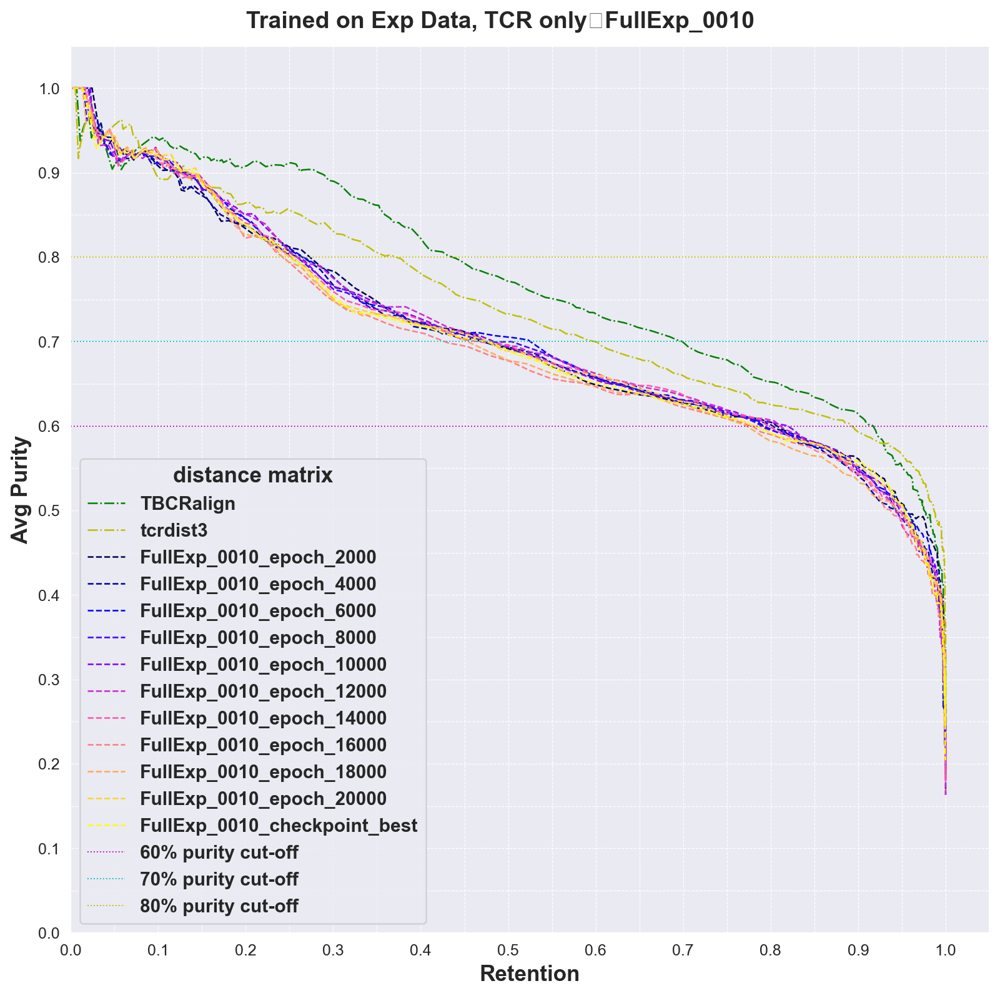

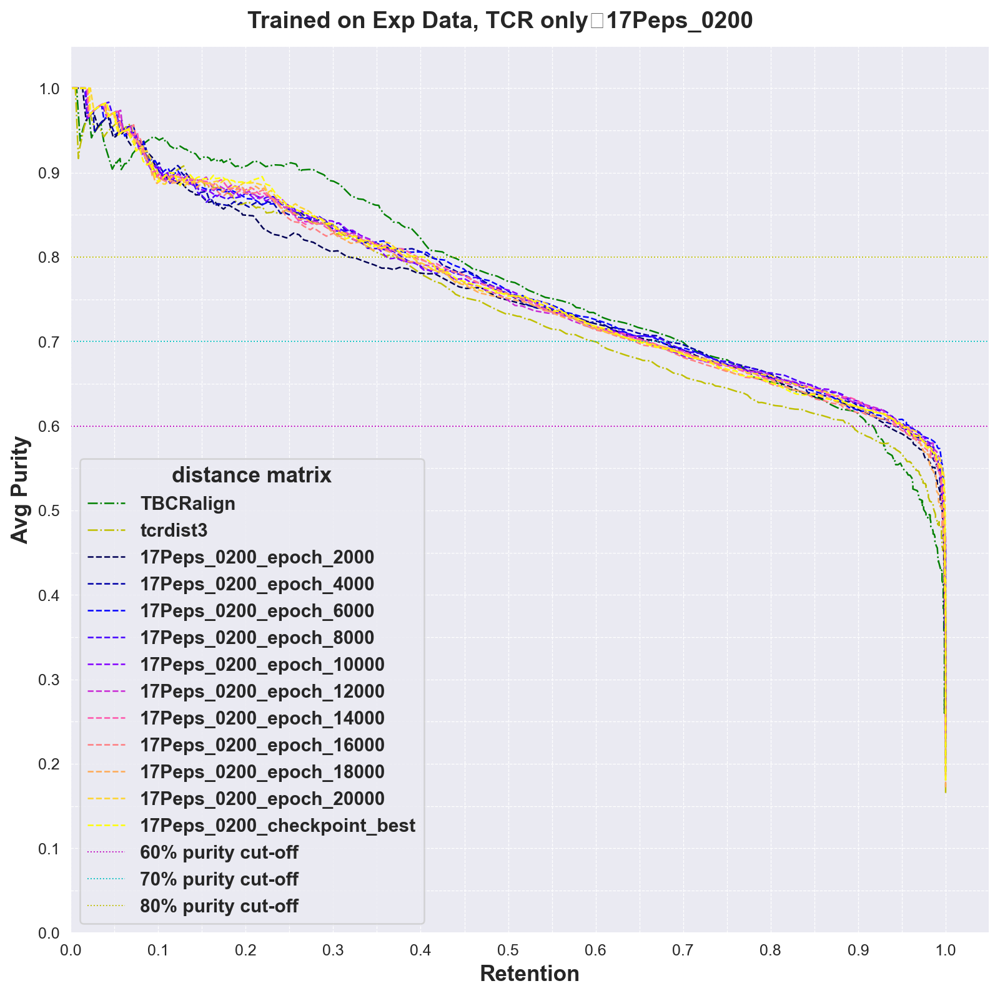

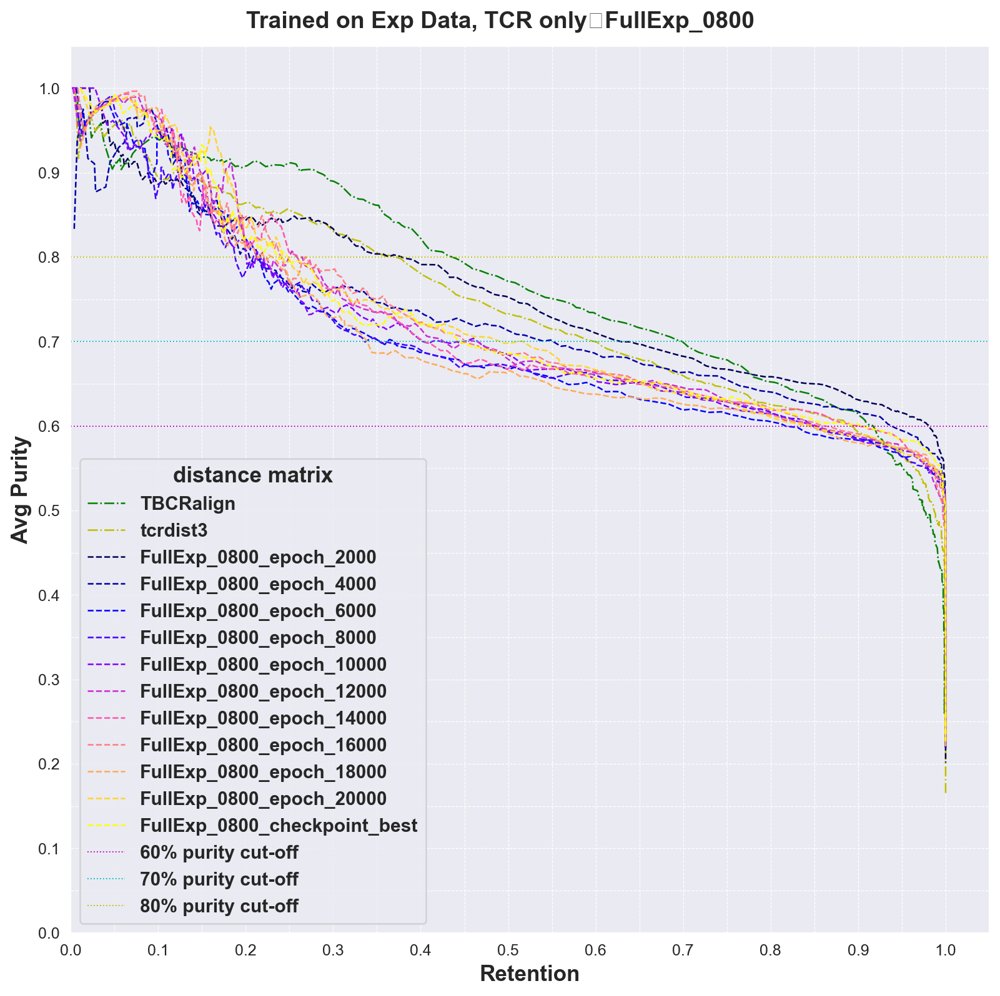

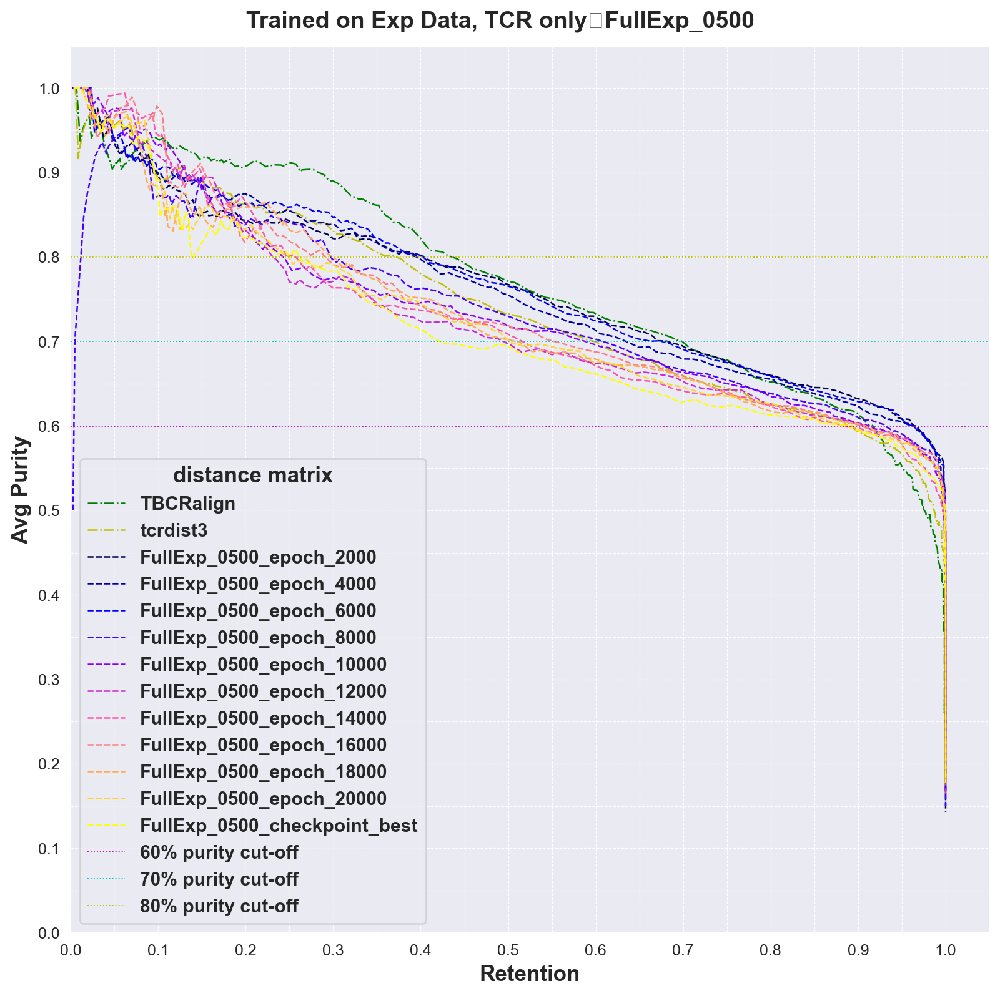

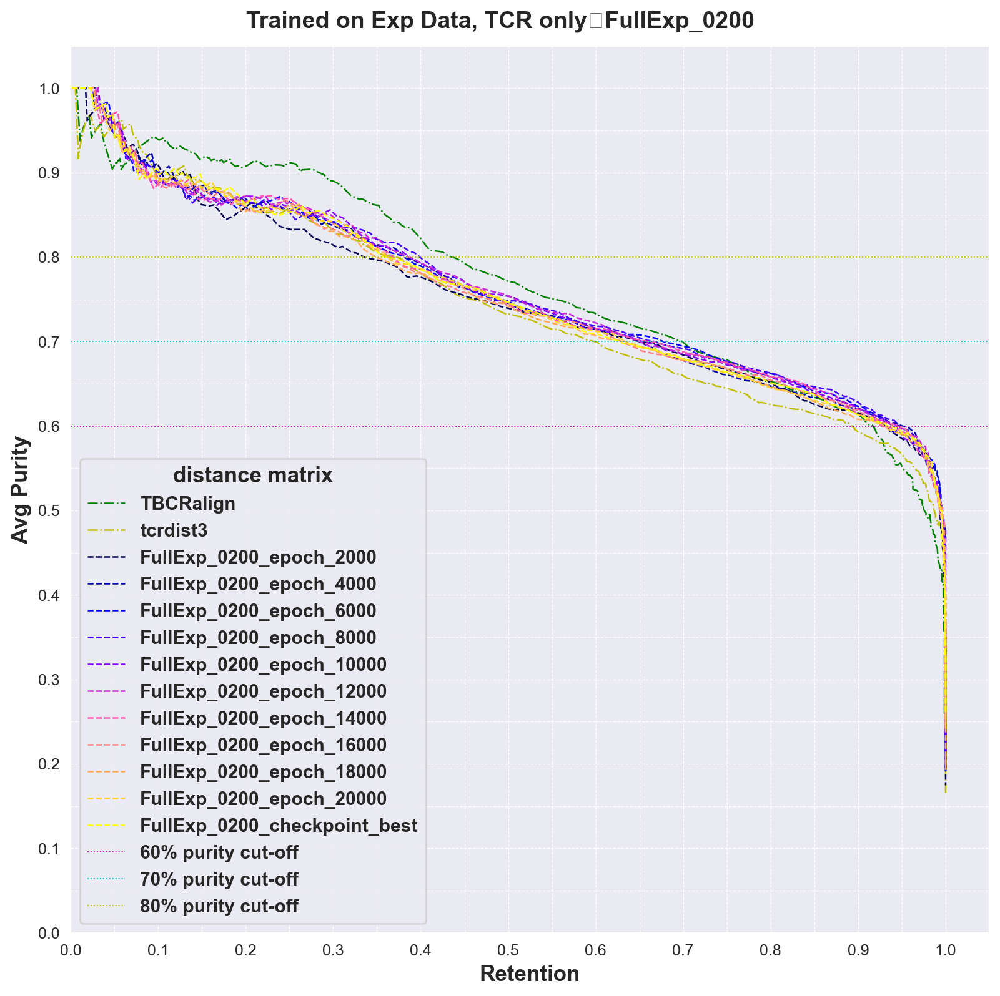

...

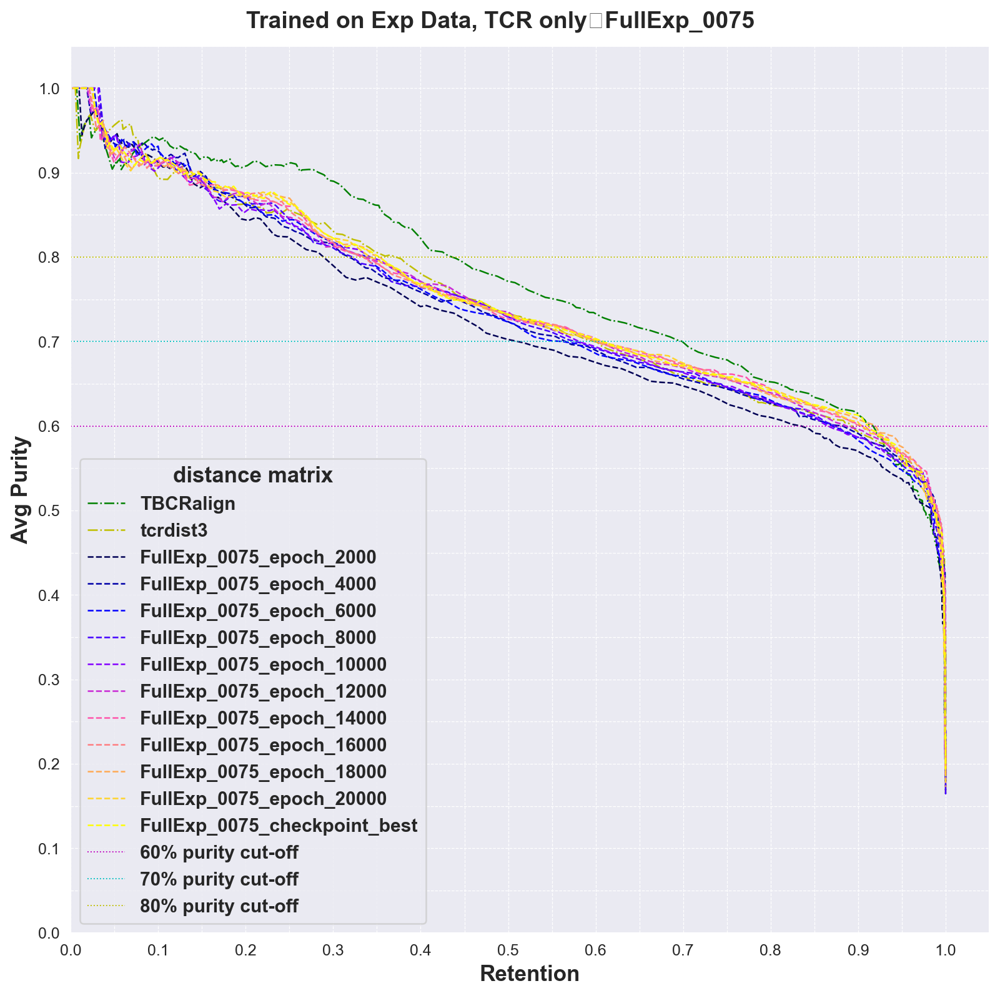

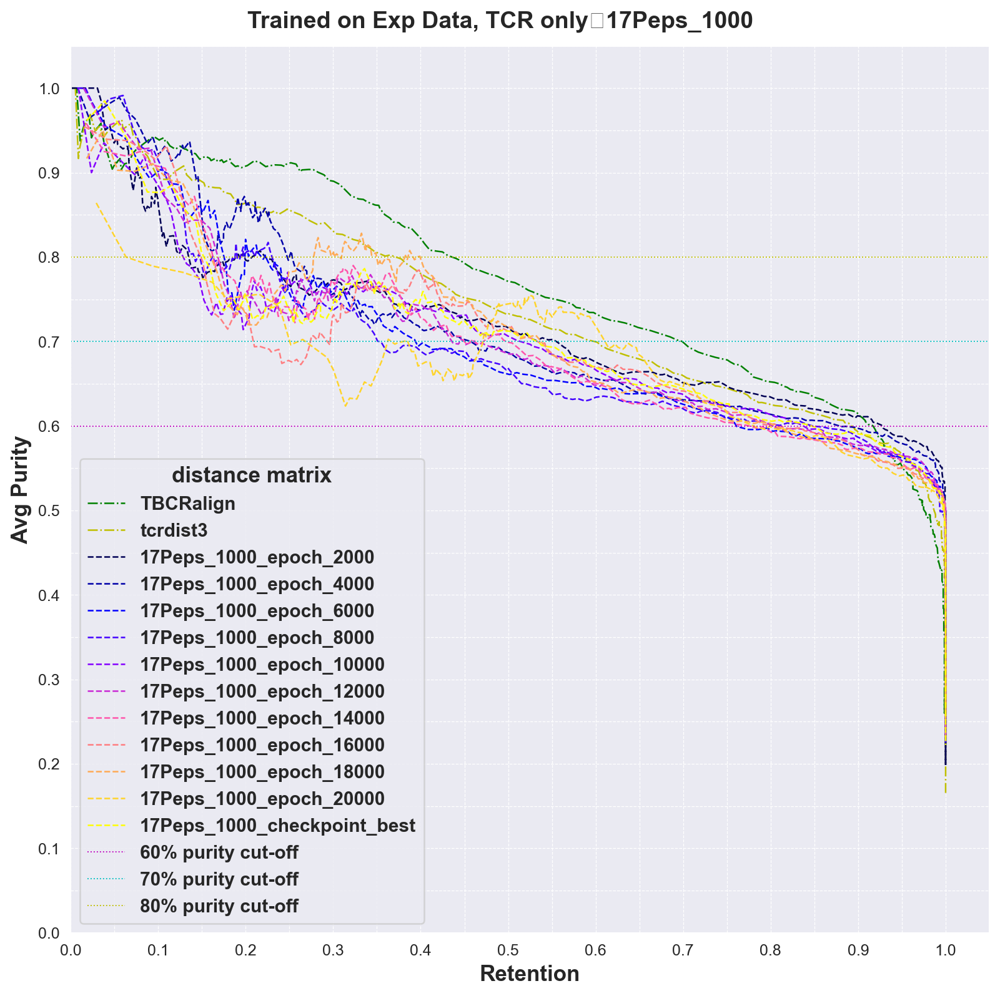

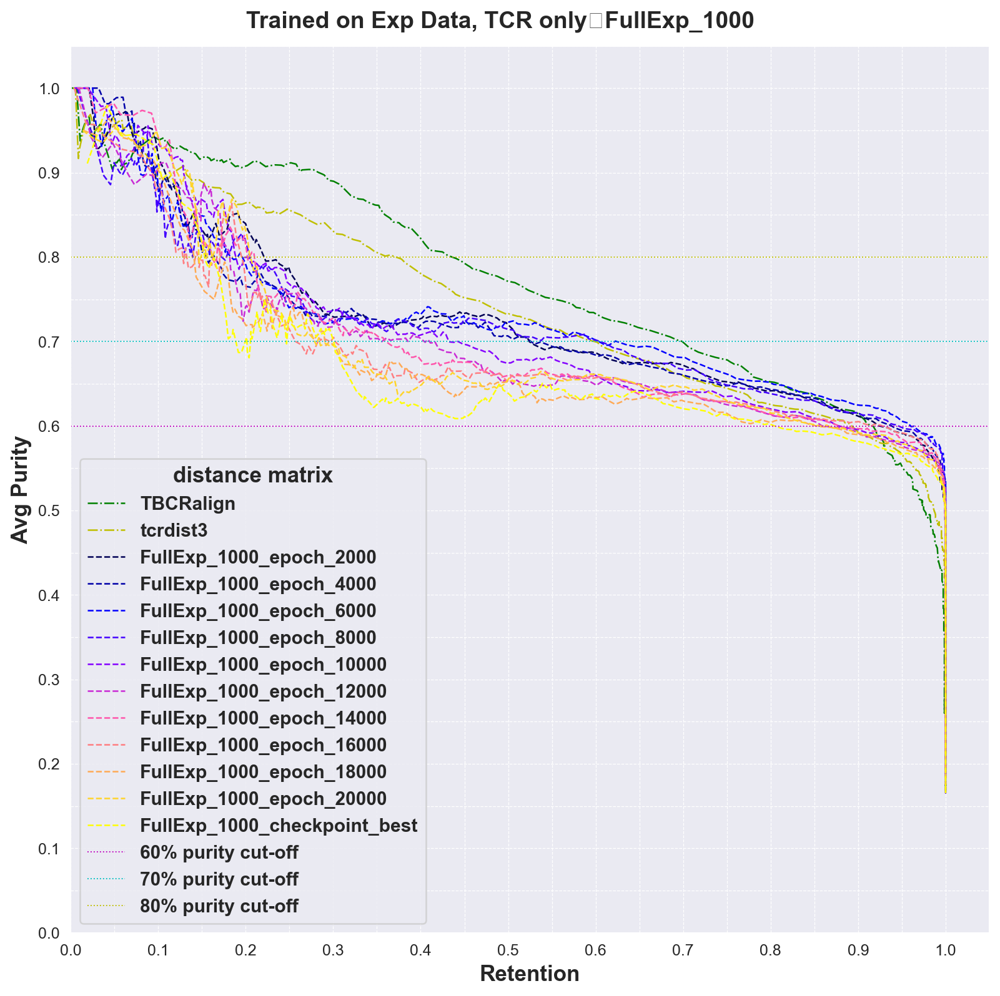

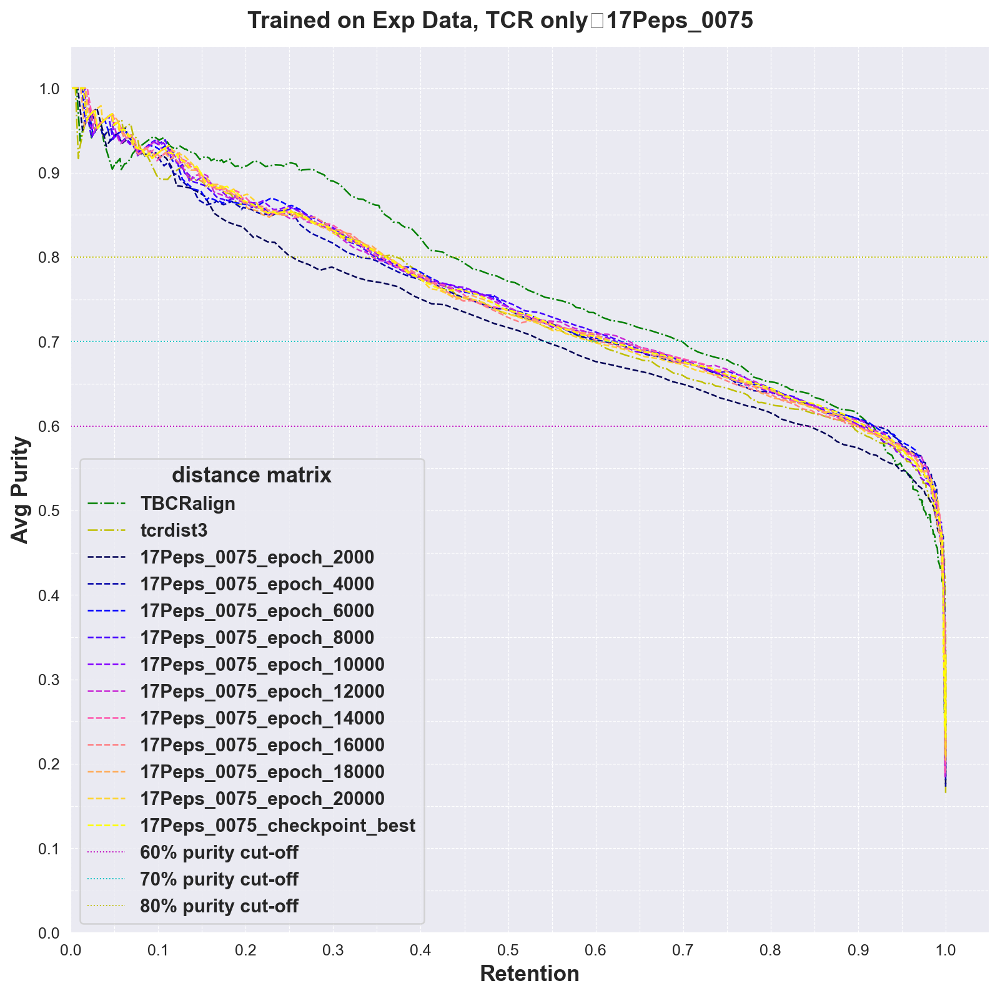

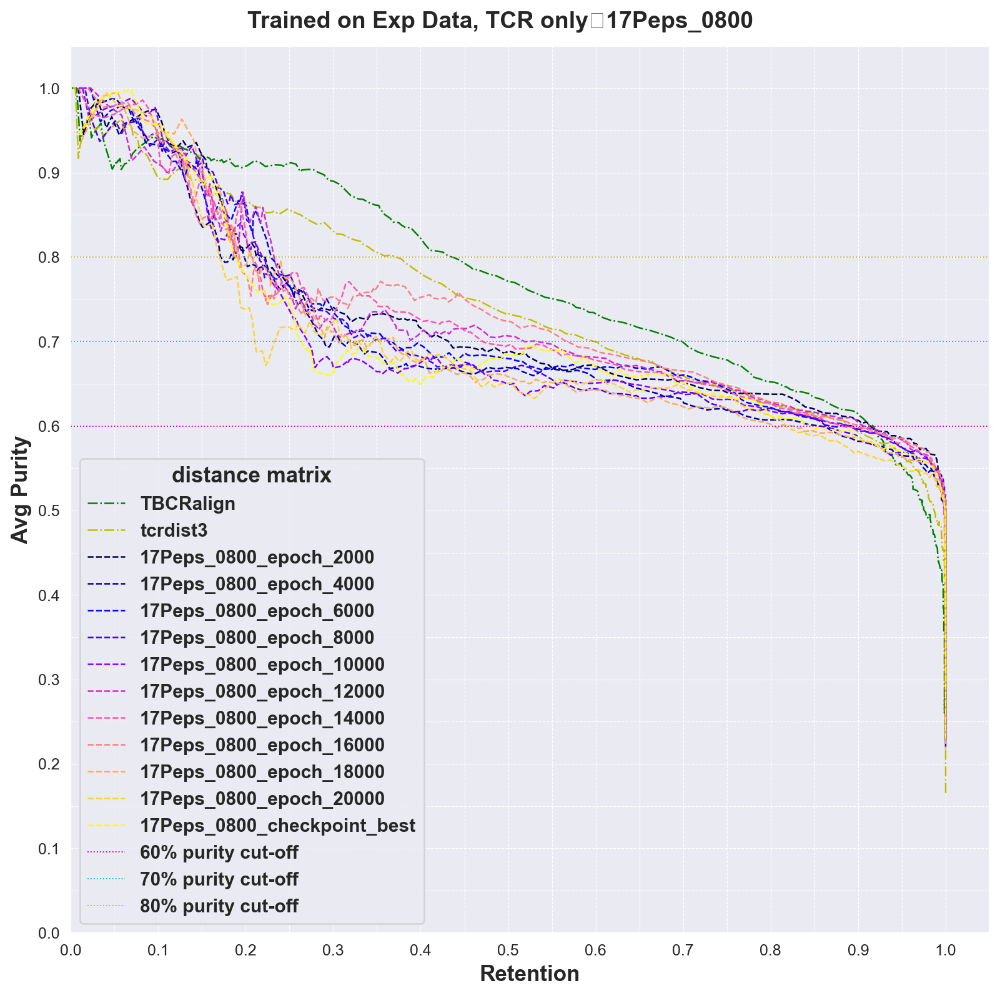

In [335]:
ntr={}
for f, n in zip(files, names):
    print('\n\n', f'{f}\n{n}', '\n\n')
    ntr[n] = run_interval_plot_pipeline(f, df_filt, n, 500, baselines_valid, 'Trained on Exp Data, TCR only', 
                                        fig_fn=f'FixTripletInterval_{n}_TrueValidationSet_Part0_Min20binders')

In [365]:
from pprint import pprint
for k,v in ntr.items():
    print(k)
    interval_aucs = {x: auc(v.query('input_type==@x')['retention'].values[1:-1], v.query('input_type==@x')['mean_purity'].values[1:-1]) for x in v.input_type.unique() if x not in ['tcrdist3', 'KernelSim', 'TBCRalign']}
    dd2 = dict(sorted(interval_aucs.items(), key=lambda key_val: key_val[1], reverse=True))
    for k2,v2 in dd2.items():
        print(k2, f'\t{v2:.4f}')



FullExp_0010
FullExp_0010_epoch_6000 	0.7085
FullExp_0010_epoch_12000 	0.7075
FullExp_0010_epoch_10000 	0.7069
FullExp_0010_epoch_2000 	0.7046
FullExp_0010_epoch_8000 	0.7045
FullExp_0010_epoch_20000 	0.7033
FullExp_0010_epoch_14000 	0.7033
FullExp_0010_epoch_4000 	0.7028
FullExp_0010_checkpoint_best 	0.7016
FullExp_0010_epoch_18000 	0.6987
FullExp_0010_epoch_16000 	0.6970
17Peps_0200
17Peps_0200_epoch_6000 	0.7648
17Peps_0200_epoch_20000 	0.7635
17Peps_0200_epoch_8000 	0.7632
17Peps_0200_epoch_4000 	0.7629
17Peps_0200_epoch_14000 	0.7628
17Peps_0200_checkpoint_best 	0.7625
17Peps_0200_epoch_10000 	0.7624
17Peps_0200_epoch_12000 	0.7621
17Peps_0200_epoch_16000 	0.7591
17Peps_0200_epoch_18000 	0.7589
17Peps_0200_epoch_2000 	0.7513
FullExp_0800
FullExp_0800_epoch_2000 	0.7565
FullExp_0800_epoch_4000 	0.7259
FullExp_0800_epoch_12000 	0.7197
FullExp_0800_epoch_16000 	0.7173
FullExp_0800_epoch_14000 	0.7168
FullExp_0800_epoch_20000 	0.7155
FullExp_0800_checkpoint_best 	0.7128
FullExp_0800_e

# Interval runs but with the KL weights

### actual runs

In [368]:
main_folder = '../output/240429_KLweights/'
files = glob.glob(f'{main_folder}*/')
names = ['_'.join(x.replace(main_folder,'').replace('RedoMargin_','').split('_')[2:]).split('_KFo')[0].replace('_0200','').replace('_out','') for x in files]
names

['17Peps_KL_1e-1',
 '17Peps_KL_1',
 '17Peps_KL_10',
 'FullExp_KL_1e-1',
 'FullExp_KL_10',
 'FullExp_KL_1']



 ../output/240429_KLweights/240429_1155_17Peps_KL_1e-1_0200_KFold_0_AllTriplet/
17Peps_KL_1e-1 


Reloading best model:
epoch: 2000
total: 0.351574182510376
reconstruction: 0.29583102464675903
kld: 0.026719165965914726
triplet: 0.029024001210927963
seq_accuracy: 0.9276520609855652
pos_accuracy: 0.9992038607597351
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:40<00:00, 12.33it/s]


Reloading best model:
epoch: 4000
total: 0.27131402492523193
reconstruction: 0.2166343331336975
kld: 0.026123231276869774
triplet: 0.028556479141116142
seq_accuracy: 0.9580965042114258
pos_accuracy: 0.9978116154670715
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.23it/s]


Reloading best model:
epoch: 6000
total: 0.23878780007362366
reconstruction: 0.18487198650836945
kld: 0.025452343747019768
triplet: 0.02846347540616989
seq_accuracy: 0.9702258706092834
pos_accuracy: 0.9977402687072754
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.60it/s]


Reloading best model:
epoch: 8000
total: 0.19348111748695374
reconstruction: 0.1399749219417572
kld: 0.02521204762160778
triplet: 0.0282941535115242
seq_accuracy: 0.9787730574607849
pos_accuracy: 0.9976114630699158
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.82it/s]


Reloading best model:
epoch: 10000
total: 0.18786673247814178
reconstruction: 0.1346147358417511
kld: 0.025013238191604614
triplet: 0.028238754719495773
seq_accuracy: 0.9806579351425171
pos_accuracy: 0.9976097941398621
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.98it/s]


Reloading best model:
epoch: 12000
total: 0.16860182583332062
reconstruction: 0.1157282367348671
kld: 0.02463678829371929
triplet: 0.02823680266737938
seq_accuracy: 0.9829472303390503
pos_accuracy: 0.9976516366004944
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.90it/s]


Reloading best model:
epoch: 14000
total: 0.19361674785614014
reconstruction: 0.14095079898834229
kld: 0.024372035637497902
triplet: 0.028293902054429054
seq_accuracy: 0.9822991490364075
pos_accuracy: 0.9976997375488281
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.69it/s]


Reloading best model:
epoch: 16000
total: 0.18226346373558044
reconstruction: 0.1297360062599182
kld: 0.024274837225675583
triplet: 0.02825261652469635
seq_accuracy: 0.9804614186286926
pos_accuracy: 0.9976548552513123
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.77it/s]


Reloading best model:
epoch: 18000
total: 0.1556180715560913
reconstruction: 0.103141650557518
kld: 0.024003177881240845
triplet: 0.02847323566675186
seq_accuracy: 0.9872910976409912
pos_accuracy: 0.9975633025169373
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.47it/s]


Reloading best model:
epoch: 20000
total: 0.16228623688220978
reconstruction: 0.110126793384552
kld: 0.02401302009820938
triplet: 0.02814643457531929
seq_accuracy: 0.9861794114112854
pos_accuracy: 0.9975353479385376
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.84it/s]


Reloading best model:
Best epoch: 19956
total: 0.13747850060462952
reconstruction: 0.08526500314474106
kld: 0.024024372920393944
triplet: 0.028189126402139664
seq_accuracy: 0.989902913570404
pos_accuracy: 0.9975818395614624
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.58it/s]




 ../output/240429_KLweights/240429_1231_17Peps_KL_1_0200_KFold_0_AllTriplet/
17Peps_KL_1 


Reloading best model:
epoch: 2000
total: 0.4872589707374573
reconstruction: 0.3051745891571045
kld: 0.13852998614311218
triplet: 0.04355438053607941
seq_accuracy: 0.9245932698249817
pos_accuracy: 0.9991914629936218
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.46it/s]


Reloading best model:
epoch: 4000
total: 0.397782564163208
reconstruction: 0.22248663008213043
kld: 0.13383181393146515
triplet: 0.04146413505077362
seq_accuracy: 0.9522589445114136
pos_accuracy: 0.9980754256248474
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.28it/s]


Reloading best model:
epoch: 6000
total: 0.3657180368900299
reconstruction: 0.19552874565124512
kld: 0.12731535732746124
triplet: 0.04287395626306534
seq_accuracy: 0.9651955962181091
pos_accuracy: 0.99777752161026
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.65it/s]


Reloading best model:
epoch: 8000
total: 0.30766162276268005
reconstruction: 0.14384393393993378
kld: 0.12244344502687454
triplet: 0.041374243795871735
seq_accuracy: 0.9744328856468201
pos_accuracy: 0.9979016780853271
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.50it/s]


Reloading best model:
epoch: 10000
total: 0.2989705502986908
reconstruction: 0.13713142275810242
kld: 0.11662329733371735
triplet: 0.04521581530570984
seq_accuracy: 0.9761011004447937
pos_accuracy: 0.9979575872421265
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.31it/s]


Reloading best model:
epoch: 12000
total: 0.27872514724731445
reconstruction: 0.119194395840168
kld: 0.11171673238277435
triplet: 0.04781400412321091
seq_accuracy: 0.9787703156471252
pos_accuracy: 0.9978736042976379
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.36it/s]


Reloading best model:
epoch: 14000
total: 0.28874409198760986
reconstruction: 0.13364888727664948
kld: 0.10979010909795761
triplet: 0.04530509561300278
seq_accuracy: 0.9703584313392639
pos_accuracy: 0.9979667663574219
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:36<00:00, 13.64it/s]


Reloading best model:
epoch: 16000
total: 0.25685495138168335
reconstruction: 0.10582999140024185
kld: 0.10974060744047165
triplet: 0.04128436744213104
seq_accuracy: 0.9798638820648193
pos_accuracy: 0.997838020324707
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.65it/s]


Reloading best model:
epoch: 18000
total: 0.2468208521604538
reconstruction: 0.09848039597272873
kld: 0.10744252055883408
triplet: 0.04089793562889099
seq_accuracy: 0.9807695150375366
pos_accuracy: 0.9978689551353455
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 15.14it/s]


Reloading best model:
epoch: 20000
total: 0.26047563552856445
reconstruction: 0.11598605662584305
kld: 0.10172392427921295
triplet: 0.04276565834879875
seq_accuracy: 0.9795804619789124
pos_accuracy: 0.9980102777481079
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.60it/s]


Reloading best model:
Best epoch: 19114
total: 0.2390674501657486
reconstruction: 0.0929882600903511
kld: 0.1053992211818695
triplet: 0.04067997634410858
seq_accuracy: 0.9837514758110046
pos_accuracy: 0.9980009198188782
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.84it/s]




 ../output/240429_KLweights/240429_1141_17Peps_KL_10_0200_KFold_0_AllTriplet/
17Peps_KL_10 


Reloading best model:
epoch: 2000
total: 0.8550553917884827
reconstruction: 0.47507596015930176
kld: 0.3092782497406006
triplet: 0.07070117443799973
seq_accuracy: 0.8098058104515076
pos_accuracy: 0.9995390176773071
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.81it/s]


Reloading best model:
epoch: 4000
total: 0.7622544169425964
reconstruction: 0.4068021774291992
kld: 0.28354310989379883
triplet: 0.07190913707017899
seq_accuracy: 0.844590961933136
pos_accuracy: 0.9988545775413513
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.68it/s]


Reloading best model:
epoch: 6000
total: 0.7290060520172119
reconstruction: 0.3758355677127838
kld: 0.2807869017124176
triplet: 0.07238355278968811
seq_accuracy: 0.8597315549850464
pos_accuracy: 0.9989041686058044
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.26it/s]


Reloading best model:
epoch: 8000
total: 0.718656063079834
reconstruction: 0.37470948696136475
kld: 0.27186617255210876
triplet: 0.07208038121461868
seq_accuracy: 0.8613401651382446
pos_accuracy: 0.9987940788269043
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.74it/s]


Reloading best model:
epoch: 10000
total: 0.71136474609375
reconstruction: 0.37011003494262695
kld: 0.2693466544151306
triplet: 0.07190807908773422
seq_accuracy: 0.8650863170623779
pos_accuracy: 0.9988808631896973
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.93it/s]


Reloading best model:
epoch: 12000
total: 0.7025044560432434
reconstruction: 0.3646625280380249
kld: 0.2656424939632416
triplet: 0.07219941914081573
seq_accuracy: 0.8693820834159851
pos_accuracy: 0.9988189339637756
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.37it/s]


Reloading best model:
epoch: 14000
total: 0.6990213394165039
reconstruction: 0.35814300179481506
kld: 0.268464058637619
triplet: 0.07241430133581161
seq_accuracy: 0.8710939288139343
pos_accuracy: 0.9988126754760742
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.59it/s]


Reloading best model:
epoch: 16000
total: 0.6958634853363037
reconstruction: 0.36118045449256897
kld: 0.26274967193603516
triplet: 0.07193341106176376
seq_accuracy: 0.8717028498649597
pos_accuracy: 0.9988499283790588
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.92it/s]


Reloading best model:
epoch: 18000
total: 0.7023892998695374
reconstruction: 0.36717280745506287
kld: 0.26325878500938416
triplet: 0.07195772230625153
seq_accuracy: 0.8701950907707214
pos_accuracy: 0.9987816214561462
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.94it/s]


Reloading best model:
epoch: 20000
total: 0.7011328935623169
reconstruction: 0.3673807382583618
kld: 0.26187634468078613
triplet: 0.07187581062316895
seq_accuracy: 0.8706603050231934
pos_accuracy: 0.9988251328468323
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.74it/s]


Reloading best model:
Best epoch: 18671
total: 0.6940386891365051
reconstruction: 0.35817065834999084
kld: 0.26327648758888245
triplet: 0.07259152829647064
seq_accuracy: 0.875262975692749
pos_accuracy: 0.9987351298332214
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.74it/s]




 ../output/240429_KLweights/240429_1325_FullExp_KL_1e-1_0200_KFold_0_AllTriplet/
FullExp_KL_1e-1 


Reloading best model:
epoch: 2000
total: 0.26830077171325684
reconstruction: 0.22471898794174194
kld: 0.02620573341846466
triplet: 0.01737607643008232
seq_accuracy: 0.9545249938964844
pos_accuracy: 0.9984736442565918
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:38<00:00, 13.03it/s]


Reloading best model:
epoch: 4000
total: 0.22447389364242554
reconstruction: 0.1820985972881317
kld: 0.025246530771255493
triplet: 0.01712876185774803
seq_accuracy: 0.9637195467948914
pos_accuracy: 0.9979637861251831
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:41<00:00, 12.13it/s]


Reloading best model:
epoch: 6000
total: 0.17388656735420227
reconstruction: 0.13218526542186737
kld: 0.024665286764502525
triplet: 0.017036015167832375
seq_accuracy: 0.9813315272331238
pos_accuracy: 0.9979055523872375
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:41<00:00, 11.91it/s]


Reloading best model:
epoch: 8000
total: 0.1554485559463501
reconstruction: 0.11404981464147568
kld: 0.024520879611372948
triplet: 0.016877857968211174
seq_accuracy: 0.9861462712287903
pos_accuracy: 0.9978786706924438
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:41<00:00, 12.00it/s]


Reloading best model:
epoch: 10000
total: 0.133039653301239
reconstruction: 0.0919111892580986
kld: 0.024339670315384865
triplet: 0.016788793727755547
seq_accuracy: 0.9892194867134094
pos_accuracy: 0.9978100657463074
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:42<00:00, 11.70it/s]


Reloading best model:
epoch: 12000
total: 0.14021778106689453
reconstruction: 0.09929502010345459
kld: 0.024184847250580788
triplet: 0.016737915575504303
seq_accuracy: 0.9891285300254822
pos_accuracy: 0.9977321028709412
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.55it/s]


Reloading best model:
epoch: 14000
total: 0.11678996682167053
reconstruction: 0.07610117644071579
kld: 0.023819584399461746
triplet: 0.0168691985309124
seq_accuracy: 0.9914658069610596
pos_accuracy: 0.9977774620056152
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 11.10it/s]


Reloading best model:
epoch: 16000
total: 0.12451689690351486
reconstruction: 0.08387349545955658
kld: 0.023696372285485268
triplet: 0.016947029158473015
seq_accuracy: 0.9892026782035828
pos_accuracy: 0.9976796507835388
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.90it/s]


Reloading best model:
epoch: 18000
total: 0.10747957229614258
reconstruction: 0.06698643416166306
kld: 0.023725420236587524
triplet: 0.01676771603524685
seq_accuracy: 0.9923236966133118
pos_accuracy: 0.9976902008056641
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.44it/s]


Reloading best model:
epoch: 20000
total: 0.11620624363422394
reconstruction: 0.07589370757341385
kld: 0.023570392280817032
triplet: 0.01674213819205761
seq_accuracy: 0.9922769069671631
pos_accuracy: 0.9976121187210083
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 11.00it/s]


Reloading best model:
Best epoch: 19802
total: 0.10106079280376434
reconstruction: 0.060584235936403275
kld: 0.02383415959775448
triplet: 0.01664239913225174
seq_accuracy: 0.9934699535369873
pos_accuracy: 0.9976761937141418
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.12it/s]




 ../output/240429_KLweights/240429_1234_FullExp_KL_10_0200_KFold_0_AllTriplet/
FullExp_KL_10 


Reloading best model:
epoch: 2000
total: 0.7347290515899658
reconstruction: 0.3896632492542267
kld: 0.30345073342323303
triplet: 0.041615091264247894
seq_accuracy: 0.8394200801849365
pos_accuracy: 0.999133825302124
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.63it/s]


Reloading best model:
epoch: 4000
total: 0.6536630392074585
reconstruction: 0.31510061025619507
kld: 0.29725217819213867
triplet: 0.04131027311086655
seq_accuracy: 0.8784217238426208
pos_accuracy: 0.9986424446105957
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.53it/s]


Reloading best model:
epoch: 6000
total: 0.6139990091323853
reconstruction: 0.2845743000507355
kld: 0.287600040435791
triplet: 0.04182468354701996
seq_accuracy: 0.8918930888175964
pos_accuracy: 0.9986459612846375
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:51<00:00,  9.69it/s]


Reloading best model:
epoch: 8000
total: 0.5955798029899597
reconstruction: 0.2693033516407013
kld: 0.28444159030914307
triplet: 0.04183486849069595
seq_accuracy: 0.8960399627685547
pos_accuracy: 0.9985889196395874
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:49<00:00, 10.02it/s]


Reloading best model:
epoch: 10000
total: 0.5914244055747986
reconstruction: 0.2646055817604065
kld: 0.2850678265094757
triplet: 0.04175099357962608
seq_accuracy: 0.8986403346061707
pos_accuracy: 0.9986809492111206
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:49<00:00, 10.03it/s]


Reloading best model:
epoch: 12000
total: 0.5826040506362915
reconstruction: 0.25858771800994873
kld: 0.28203919529914856
triplet: 0.041977182030677795
seq_accuracy: 0.9035788774490356
pos_accuracy: 0.9986937046051025
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.65it/s]


Reloading best model:
epoch: 14000
total: 0.5815680623054504
reconstruction: 0.2563955783843994
kld: 0.28337562084198
triplet: 0.04179684817790985
seq_accuracy: 0.9034868478775024
pos_accuracy: 0.9987065196037292
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.46it/s]


Reloading best model:
epoch: 16000
total: 0.615247905254364
reconstruction: 0.29537805914878845
kld: 0.278805673122406
triplet: 0.041064225137233734
seq_accuracy: 0.8893827199935913
pos_accuracy: 0.9987367391586304
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.92it/s]


Reloading best model:
epoch: 18000
total: 0.5751015543937683
reconstruction: 0.2555457353591919
kld: 0.2778451442718506
triplet: 0.041710689663887024
seq_accuracy: 0.9020242094993591
pos_accuracy: 0.9987251162528992
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.67it/s]


Reloading best model:
epoch: 20000
total: 0.5728330612182617
reconstruction: 0.25279587507247925
kld: 0.27810725569725037
triplet: 0.041929975152015686
seq_accuracy: 0.9031826257705688
pos_accuracy: 0.9987403154373169
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.47it/s]


Reloading best model:
Best epoch: 17515
total: 0.571363091468811
reconstruction: 0.2501901686191559
kld: 0.279072105884552
triplet: 0.04210076108574867
seq_accuracy: 0.9066895842552185
pos_accuracy: 0.9987542629241943
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:49<00:00, 10.17it/s]




 ../output/240429_KLweights/240429_1327_FullExp_KL_1_0200_KFold_0_AllTriplet/
FullExp_KL_1 


Reloading best model:
epoch: 2000
total: 0.3779990077018738
reconstruction: 0.22387927770614624
kld: 0.1209292933344841
triplet: 0.03319043293595314
seq_accuracy: 0.9468144178390503
pos_accuracy: 0.9986390471458435
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:49<00:00, 10.15it/s]


Reloading best model:
epoch: 4000
total: 0.29828551411628723
reconstruction: 0.15191276371479034
kld: 0.11475510895252228
triplet: 0.031617648899555206
seq_accuracy: 0.9713996648788452
pos_accuracy: 0.9981988668441772
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.26it/s]


Reloading best model:
epoch: 6000
total: 0.26296013593673706
reconstruction: 0.12150368094444275
kld: 0.10931754857301712
triplet: 0.03213892877101898
seq_accuracy: 0.9798317551612854
pos_accuracy: 0.9980546236038208
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.23it/s]


Reloading best model:
epoch: 8000
total: 0.24100863933563232
reconstruction: 0.10624855011701584
kld: 0.10500718653202057
triplet: 0.029752906411886215
seq_accuracy: 0.980911374092102
pos_accuracy: 0.998073160648346
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.85it/s]


Reloading best model:
epoch: 10000
total: 0.22362583875656128
reconstruction: 0.09195323288440704
kld: 0.09826364368200302
triplet: 0.03340897336602211
seq_accuracy: 0.9838516116142273
pos_accuracy: 0.9979847073554993
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.26it/s]


Reloading best model:
epoch: 12000
total: 0.21449804306030273
reconstruction: 0.08589502424001694
kld: 0.09260513633489609
triplet: 0.035997889935970306
seq_accuracy: 0.9851555824279785
pos_accuracy: 0.9980359673500061
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:50<00:00,  9.81it/s]


Reloading best model:
epoch: 14000
total: 0.2079230546951294
reconstruction: 0.08183211833238602
kld: 0.09409697353839874
triplet: 0.031993962824344635
seq_accuracy: 0.9850603342056274
pos_accuracy: 0.9980801343917847
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.38it/s]


Reloading best model:
epoch: 16000
total: 0.21260114014148712
reconstruction: 0.08692929893732071
kld: 0.09675043076276779
triplet: 0.02892141044139862
seq_accuracy: 0.9852308034896851
pos_accuracy: 0.9980406165122986
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.70it/s]


Reloading best model:
epoch: 18000
total: 0.19378507137298584
reconstruction: 0.06962799280881882
kld: 0.09296832978725433
triplet: 0.03118874877691269
seq_accuracy: 0.9872980117797852
pos_accuracy: 0.9980987906455994
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.40it/s]


Reloading best model:
epoch: 20000
total: 0.48589834570884705
reconstruction: 0.3520311415195465
kld: 0.09910155087709427
triplet: 0.034765660762786865
seq_accuracy: 0.9016643762588501
pos_accuracy: 0.997702956199646
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:40<00:00, 12.47it/s]


Reloading best model:
Best epoch: 17973
total: 0.19004808366298676
reconstruction: 0.06596877425909042
kld: 0.09468722343444824
triplet: 0.029392074793577194
seq_accuracy: 0.9887768030166626
pos_accuracy: 0.9981663227081299
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.83it/s]


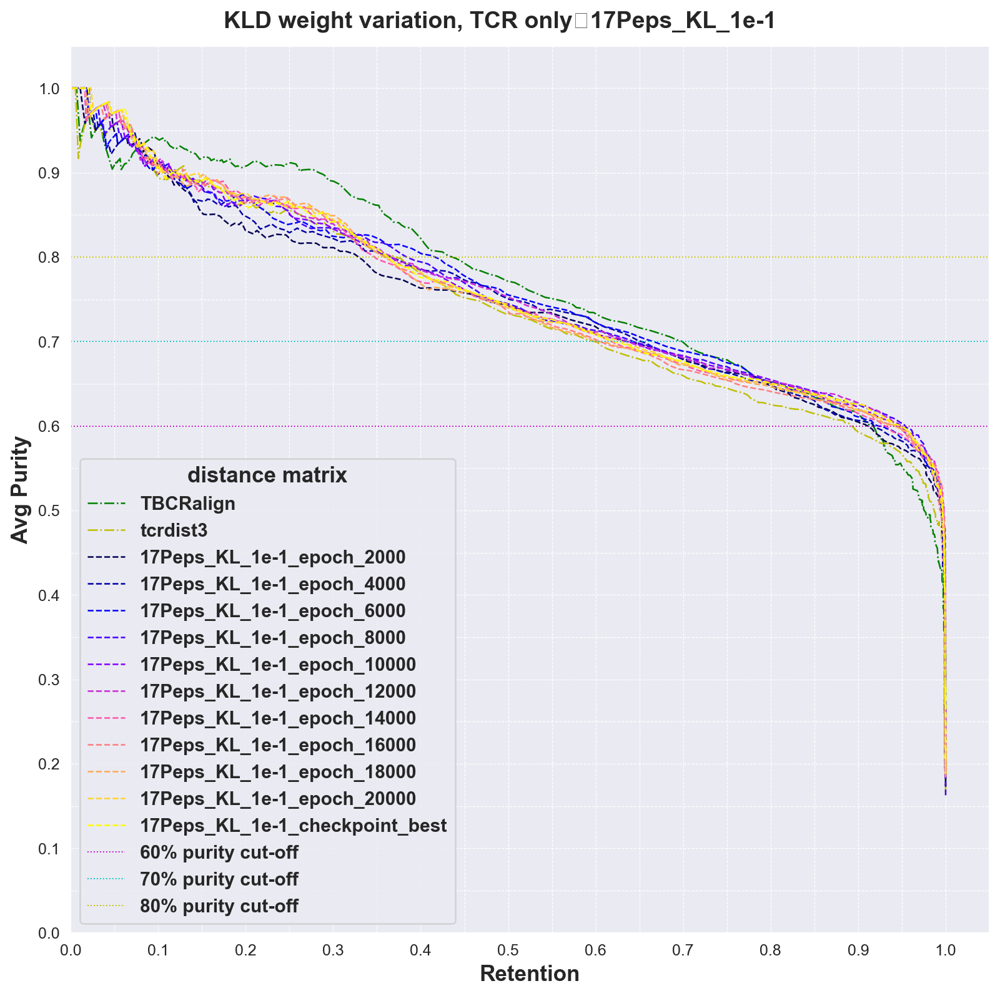

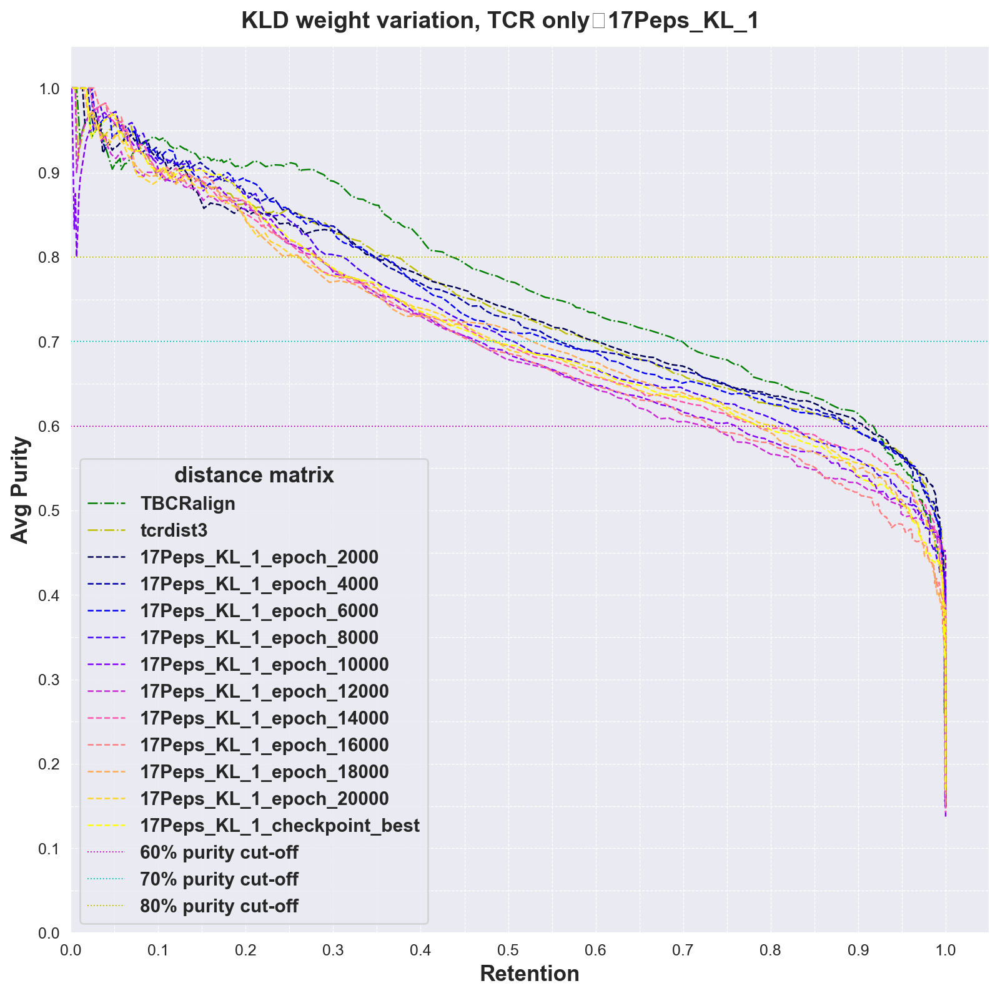

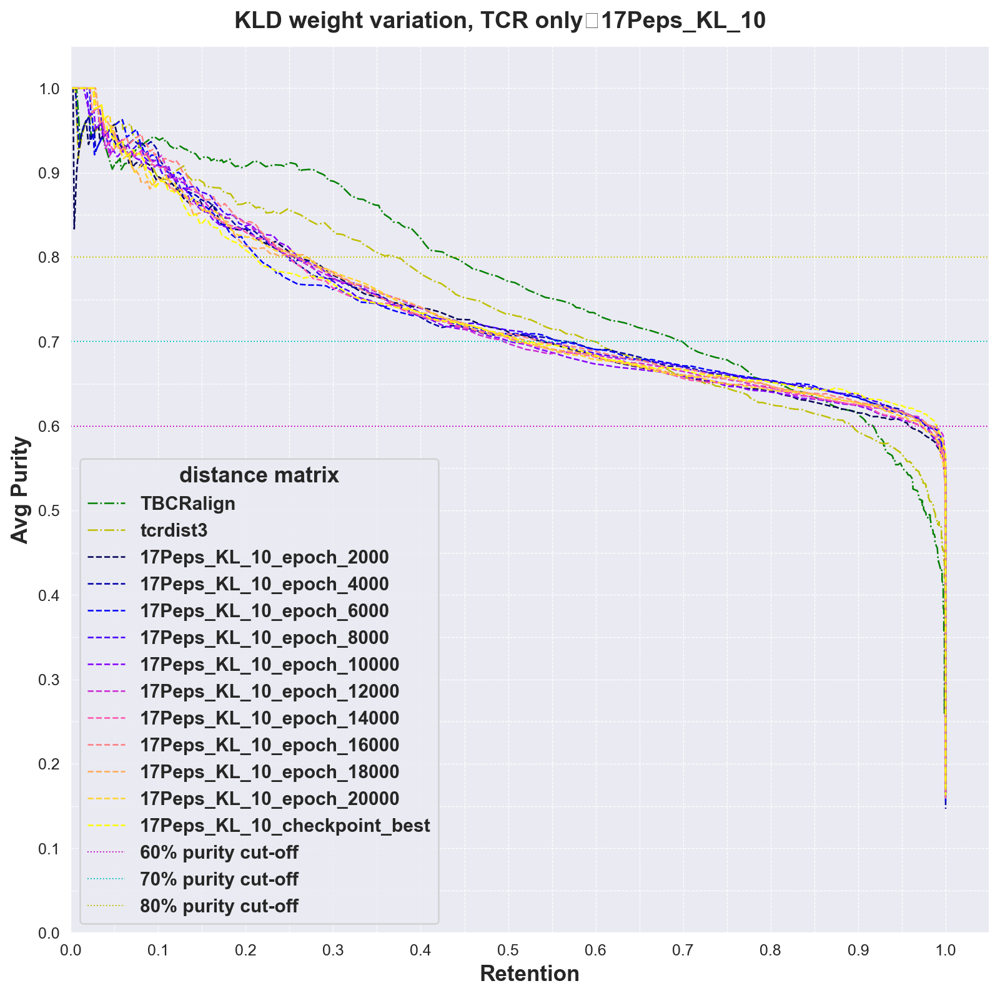

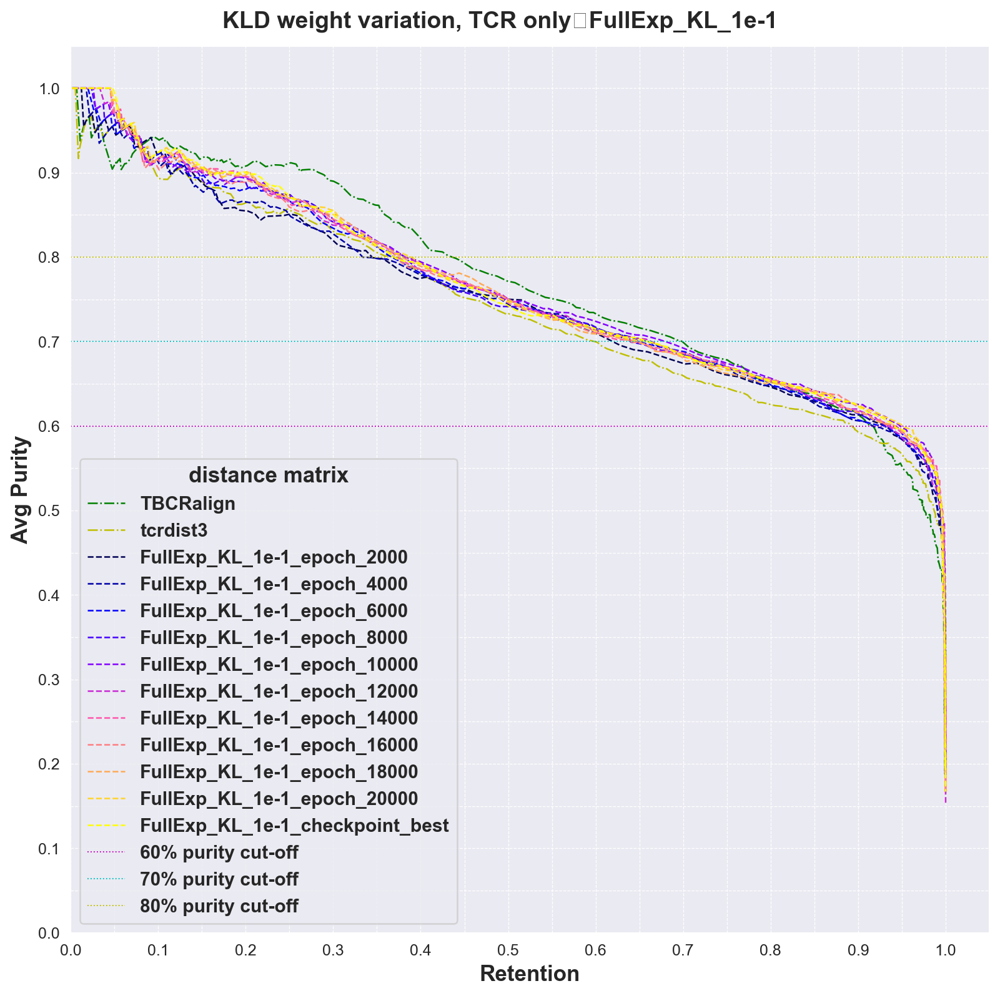

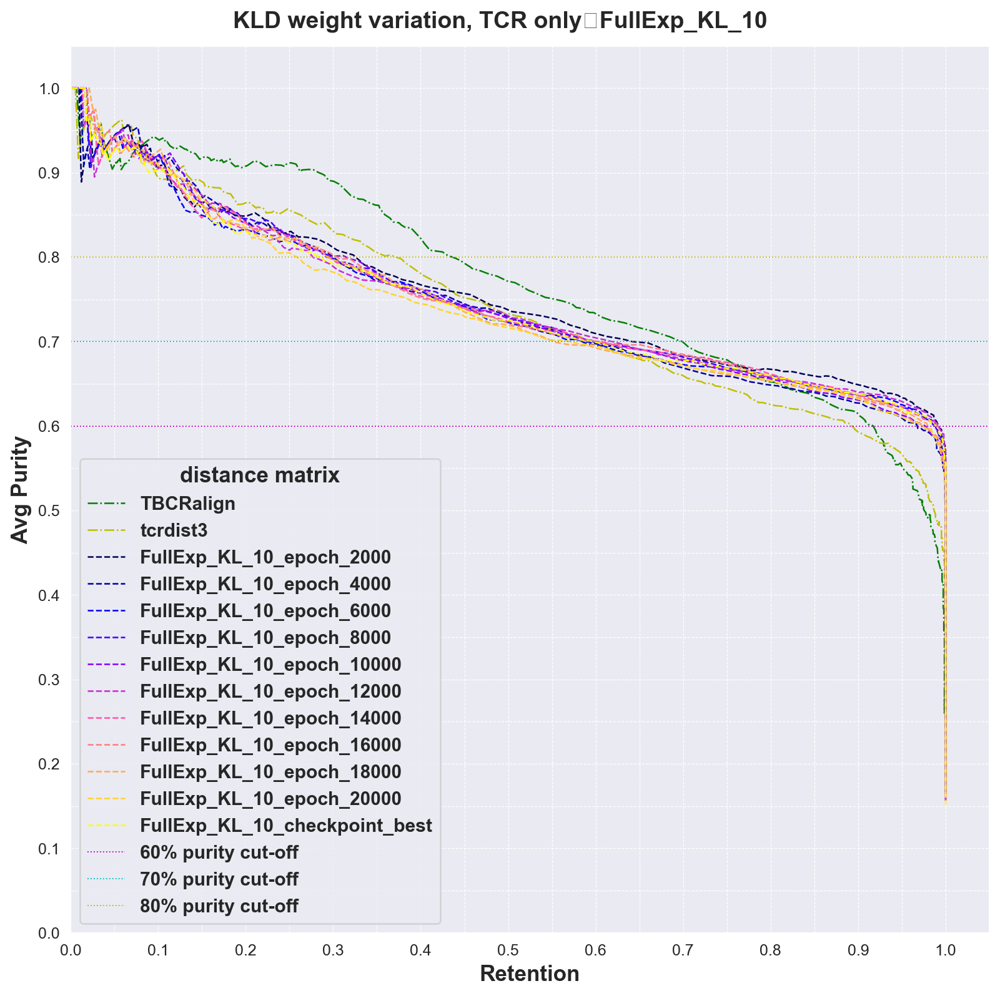

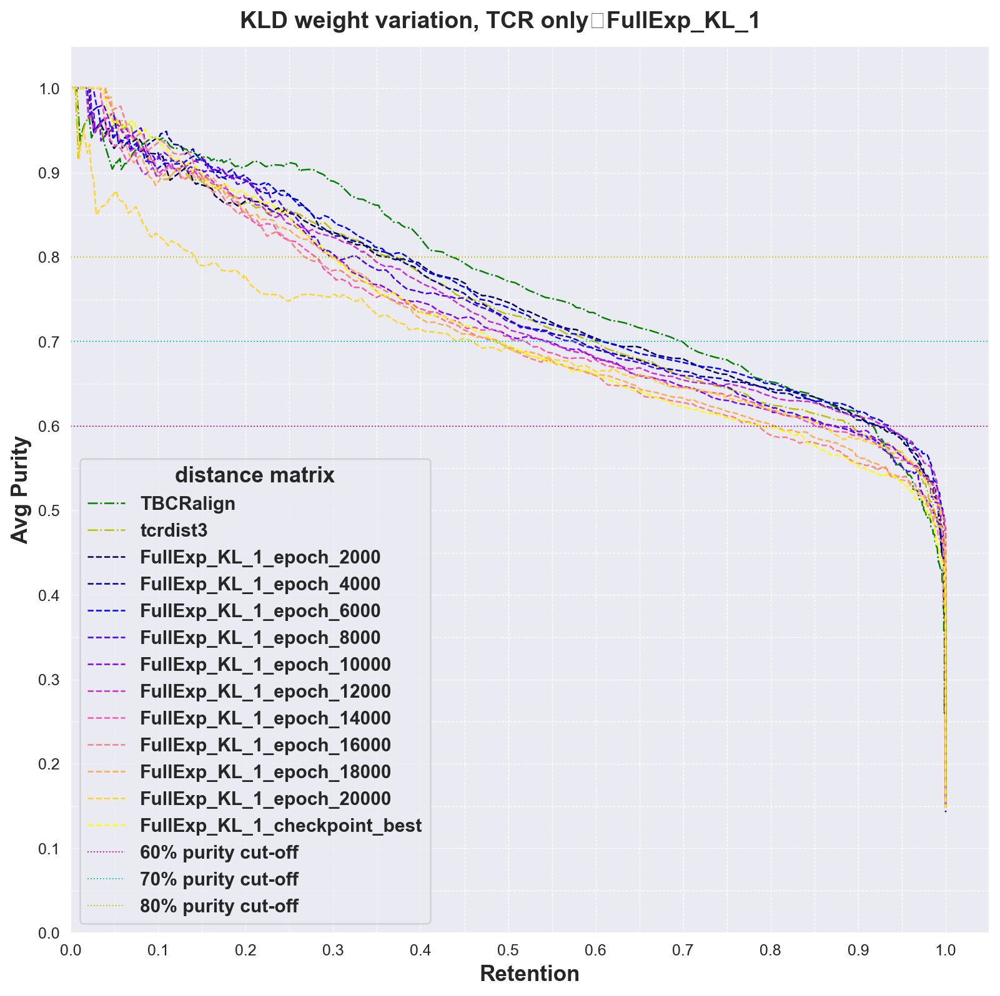

In [370]:
kld={}
for f, n in zip(files, names):
    print('\n\n', f'{f}\n{n}', '\n\n')
    kld[n] = run_interval_plot_pipeline(f, df_filt, n, 500, baselines_valid, 'KLD weight variation, TCR only', 
                                        fig_fn=f'KLDweights_{n}_TrueValidationSet_Part0_Min20binders')

In [371]:
from pprint import pprint
for k,v in kld.items():
    print(k)
    interval_aucs = {x: auc(v.query('input_type==@x')['retention'].values[1:-1], v.query('input_type==@x')['mean_purity'].values[1:-1]) for x in v.input_type.unique() if x not in ['tcrdist3', 'KernelSim', 'TBCRalign']}
    dd2 = dict(sorted(interval_aucs.items(), key=lambda key_val: key_val[1], reverse=True))
    for k2,v2 in dd2.items():
        print(k2, f'\t{v2:.4f}')



17Peps_KL_1e-1
17Peps_KL_1e-1_epoch_6000 	0.7591
17Peps_KL_1e-1_epoch_12000 	0.7589
17Peps_KL_1e-1_epoch_8000 	0.7578
17Peps_KL_1e-1_epoch_20000 	0.7567
17Peps_KL_1e-1_checkpoint_best 	0.7565
17Peps_KL_1e-1_epoch_10000 	0.7559
17Peps_KL_1e-1_epoch_18000 	0.7544
17Peps_KL_1e-1_epoch_14000 	0.7543
17Peps_KL_1e-1_epoch_16000 	0.7529
17Peps_KL_1e-1_epoch_4000 	0.7503
17Peps_KL_1e-1_epoch_2000 	0.7445
17Peps_KL_1
17Peps_KL_1_epoch_2000 	0.7449
17Peps_KL_1_epoch_4000 	0.7440
17Peps_KL_1_epoch_6000 	0.7405
17Peps_KL_1_epoch_8000 	0.7244
17Peps_KL_1_epoch_14000 	0.7160
17Peps_KL_1_checkpoint_best 	0.7135
17Peps_KL_1_epoch_20000 	0.7131
17Peps_KL_1_epoch_18000 	0.7100
17Peps_KL_1_epoch_10000 	0.7065
17Peps_KL_1_epoch_16000 	0.7032
17Peps_KL_1_epoch_12000 	0.6995
17Peps_KL_10
17Peps_KL_10_epoch_16000 	0.7387
17Peps_KL_10_epoch_4000 	0.7364
17Peps_KL_10_epoch_8000 	0.7350
17Peps_KL_10_epoch_12000 	0.7350
17Peps_KL_10_epoch_6000 	0.7335
17Peps_KL_10_epoch_20000 	0.7331
17Peps_KL_10_checkpoint_best

# some filtering using various AUCs at various thresholds

In [17]:
def get_retpur_auc(retentions, purities, min_retention=0.0, max_retention=1.0, min_purity=0.0, max_purity=1.0):
    ridx = np.where((min_retention<=retentions) & (retentions<=max_retention))
    pidx = np.where((min_purity<=purities) & (purities<=max_purity))
    idx = np.intersect1d(ridx, pidx)
    if len(idx)<=1:
        return -1
    retentions = retentions[idx]
    purities = purities[idx]
    return auc(retentions, purities)

def get_all_rpauc(retentions, purities, input_type=None, name=None):
    total_auc = get_retpur_auc(retentions, purities)
    p60_auc = get_retpur_auc(retentions, purities, min_purity=0.6)
    p70_auc = get_retpur_auc(retentions, purities, min_purity=0.7)
    
    p60_r40_auc = get_retpur_auc(retentions, purities, min_retention=0.4, min_purity=0.6)
    p70_r35_auc = get_retpur_auc(retentions, purities, min_retention=0.35, min_purity=0.70)
    p70_r50_auc = get_retpur_auc(retentions, purities, min_retention=0.5, min_purity=0.70)
    out={'input_type':input_type, 
         'name':name,
         'total_auc':total_auc, 
         'p70_auc':p70_auc,
         'p60_auc':p60_auc, 
         'p60_r40_auc':p60_r40_auc,
         'p70_r35_auc':p70_r35_auc,
         'p70_r50_auc':p70_r50_auc}
   
    return out

In [587]:
df_comparison = [get_all_rpauc(baselines_valid.query('input_type=="TBCRalign"')['retention'].values[1:-1], baselines_valid.query('input_type=="TBCRalign"')['mean_purity'].values[1:-1], 'baseline', 'TBCRalign'),
                 get_all_rpauc(baselines_valid.query('input_type=="tcrdist3"')['retention'].values[1:-1], baselines_valid.query('input_type=="tcrdist3"')['mean_purity'].values[1:-1], 'baseline', 'tcrdist3'),]

for k,v in ntr.items():
    df_comparison.extend([get_all_rpauc(v.query('input_type==@x')['retention'].values[1:-1], 
                                        v.query('input_type==@x')['mean_purity'].values[1:-1], 
                                        input_type=k, name=x) for x in v.input_type.unique() if x !="tcrdist3" and x!="TBCRalign"])

for k,v in kld.items():
    df_comparison.extend([get_all_rpauc(v.query('input_type==@x')['retention'].values[1:-1],
                                        v.query('input_type==@x')['mean_purity'].values[1:-1], 
                                        input_type=k, name=x) for x in v.input_type.unique() if x !="tcrdist3" and x!="TBCRalign"])

df_comparison = pd.DataFrame(df_comparison)

In [455]:
pd.concat([v for v in ntr.values()]).drop_duplicates().to_csv('../output/240411_CLusteringTests/240425_FixTriplet_RedoMargins_Intervals.csv')
pd.concat([v for v in kld.values()]).drop_duplicates().to_csv('../output/240411_CLusteringTests/240425_KLDW_margin0200_Intervals.csv')

In [456]:
df_comparison.query('input_type=="baseline"')

,input_type,name,total_auc,p60_auc,p60_r40_auc,p70_r35_auc
0,baseline,TBCRalign,0.771539,0.726871,0.362365,0.265450
1,baseline,tcrdist3,0.742002,0.680401,0.331679,0.171689


In [481]:
df_comparison['aggregate'] = 0.3 * df_comparison['total_auc'] + 0.7 * df_comparison['p70_r35_auc']
compdict = {k:v.split('_')[2:] for k,v in df_comparison.loc[df_comparison.groupby('input_type')['aggregate'].idxmax()][['input_type','name']].values if k != 'baseline'}
compdict

{'17Peps_0010': ['epoch', '14000'],
 '17Peps_0075': ['epoch', '12000'],
 '17Peps_0200': ['epoch', '6000'],
 '17Peps_0500': ['epoch', '2000'],
 '17Peps_0800': ['epoch', '16000'],
 '17Peps_1000': ['epoch', '20000'],
 '17Peps_KL_1': ['1', 'epoch', '2000'],
 '17Peps_KL_10': ['10', 'epoch', '4000'],
 '17Peps_KL_1e-1': ['1e-1', 'epoch', '6000'],
 'FullExp_0010': ['epoch', '6000'],
 'FullExp_0075': ['checkpoint', 'best'],
 'FullExp_0200': ['epoch', '6000'],
 'FullExp_0500': ['epoch', '2000'],
 'FullExp_0800': ['epoch', '2000'],
 'FullExp_1000': ['epoch', '6000'],
 'FullExp_KL_1': ['1', 'epoch', '6000'],
 'FullExp_KL_10': ['10', 'epoch', '2000'],
 'FullExp_KL_1e-1': ['1e-1', 'epoch', '10000']}

In [485]:
glob.glob(f'{files1[0]}*{["epoch", "14000"][-1]}*')

['../output/240428_FixTriplet/240426_1609_FullExp_RedoMargin_0010_KFold_0_AllTriplet/epoch_14000_interval_checkpoint__fold00_kcv_240326_nettcr_paired_NOswaps_f00_240426_1609_RedoMargin_0010_KFold_0_AllTriplet.pt']

## With those best results, do the tbcralign aggregation runs

In [500]:
main_folder1 = '../output/240428_FixTriplet/'
files1 = glob.glob(f'{main_folder1}*/')
names1 = ['_'.join(x.replace(main_folder1,'').replace('RedoMargin_','').split('_')[2:]).split('_KFo')[0].replace('_leave','').replace('_out','') for x in files1]
main_folder2 = '../output/240429_KLweights/'
files2 = glob.glob(f'{main_folder2}*/')
names2 = ['_'.join(x.replace(main_folder2,'').replace('RedoMargin_','').split('_')[2:]).split('_KFo')[0].replace('_0200','').replace('_out','') for x in files2]

files_dict = {k:v for k,v in zip(names1+names2, files1+files2)}


In [564]:
pkl_dump(files_dict, '../output/240411_ClusteringTests/files_dict.pkl')
pkl_dump(compdict, '../output/240411_ClusteringTests/comp_dict.pkl')

/Users/riwa/Documents/code/tclustr/output/240411_ClusteringTests/files_dict.pkl saved.
/Users/riwa/Documents/code/tclustr/output/240411_ClusteringTests/comp_dict.pkl saved.


In [515]:
from src.torch_utils import load_model_full
def do_agg_clustering(model, input_df, other_dm_labelled, n_points=500):
    # provide either a model path or an actual loaded model
    if type(model)==str:
        model = get_model(model_folder)
    # Assuming both input_df and other_dm_labelled have the raw_index...
    latent_df = get_latent_df(model, input_df)
    # Sort it accordingly
    latent_df = latent_df.set_index('raw_index').loc[other_dm_labelled['raw_index'].values].reset_index()
    dist_matrix, dist_array, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(latent_df)
    other_array = other_dm_labelled.iloc[:len(other_dm_labelled), :len(other_dm_labelled)].values
    agg_array = 1 - np.multiply(1-dist_array, 1-other_array)
    results = cluster_all_thresholds(agg_array, features, labels, encoded_labels, label_encoder, n_points=n_points)
    return results

In [519]:
all_agg_results = []
for name, folder in files_dict.items():
    js = glob.glob(f'{folder}*kwargs*.json')[0]
    stupid_join = '_'.join([compdict[name][-2], compdict[name][-1]])+'_'
    print(stupid_join)
    pt = glob.glob(f'{folder}*{stupid_join}*.pt')[0]
    model = load_model_full(pt, js, map_location='cpu')
    all_agg_results.append(do_agg_clustering(model, df_filt, tbcr_dm140_part0).assign(input_type=name))
all_agg_results = pd.concat(all_agg_results)

epoch_6000_
Reloading best model:
epoch: 6000
total: 0.14108428359031677
reconstruction: 0.1343366503715515
kld: 0.00457340944558382
triplet: 0.0021742212120443583
seq_accuracy: 0.9807924032211304
pos_accuracy: 0.9979357719421387
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.51it/s]


epoch_6000_
Reloading best model:
epoch: 6000
total: 0.23586291074752808
reconstruction: 0.2034846693277359
kld: 0.0038797457236796618
triplet: 0.02849850058555603
seq_accuracy: 0.968456506729126
pos_accuracy: 0.9979590177536011
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.21it/s]


epoch_2000_
Reloading best model:
epoch: 2000
total: 0.31018152832984924
reconstruction: 0.24125362932682037
kld: 0.003138048341497779
triplet: 0.0657898485660553
seq_accuracy: 0.9536567330360413
pos_accuracy: 0.9983071088790894
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:51<00:00,  9.77it/s]


epoch_2000_
Reloading best model:
epoch: 2000
total: 0.2719758152961731
reconstruction: 0.22729358077049255
kld: 0.003467549104243517
triplet: 0.041214682161808014
seq_accuracy: 0.9544339776039124
pos_accuracy: 0.9983142018318176
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.26it/s]


epoch_6000_
Reloading best model:
epoch: 6000
total: 0.1647951751947403
reconstruction: 0.14447185397148132
kld: 0.003622642019763589
triplet: 0.016700688749551773
seq_accuracy: 0.979182243347168
pos_accuracy: 0.9977971911430359
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:49<00:00, 10.07it/s]


epoch_2000_
Reloading best model:
epoch: 2000
total: 0.3728070557117462
reconstruction: 0.2987205982208252
kld: 0.0036766710691154003
triplet: 0.07040978223085403
seq_accuracy: 0.9316138029098511
pos_accuracy: 0.9991634488105774
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:44<00:00, 11.25it/s]


epoch_14000_
Reloading best model:
epoch: 14000
total: 0.15194183588027954
reconstruction: 0.14497414231300354
kld: 0.0046664136461913586
triplet: 0.0023012692108750343
seq_accuracy: 0.9802325963973999
pos_accuracy: 0.9976145029067993
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:43<00:00, 11.38it/s]


checkpoint_best_
Reloading best model:
Best epoch: 18934
total: 0.07274257391691208
reconstruction: 0.06246810406446457
kld: 0.003820466808974743
triplet: 0.006454008631408215
seq_accuracy: 0.9933130145072937
pos_accuracy: 0.9977250695228577
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.78it/s]


epoch_20000_
Reloading best model:
epoch: 20000
total: 0.3586481511592865
reconstruction: 0.14987704157829285
kld: 0.004270598292350769
triplet: 0.20450051128864288
seq_accuracy: 0.9797177314758301
pos_accuracy: 0.9978892207145691
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:34<00:00, 14.58it/s]


epoch_6000_
Reloading best model:
epoch: 6000
total: 0.24127520620822906
reconstruction: 0.1349649876356125
kld: 0.0032446649856865406
triplet: 0.10306555032730103
seq_accuracy: 0.9808980226516724
pos_accuracy: 0.9979031682014465
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 11.03it/s]


epoch_12000_
Reloading best model:
epoch: 12000
total: 0.14043596386909485
reconstruction: 0.12555599212646484
kld: 0.0040642255917191505
triplet: 0.010815747082233429
seq_accuracy: 0.9833889603614807
pos_accuracy: 0.997726321220398
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:47<00:00, 10.64it/s]


epoch_16000_
Reloading best model:
epoch: 16000
total: 0.25674983859062195
reconstruction: 0.1317291110754013
kld: 0.0035643423907458782
triplet: 0.12145639210939407
seq_accuracy: 0.9832922220230103
pos_accuracy: 0.9977014064788818
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:37<00:00, 13.32it/s]


epoch_6000_
Reloading best model:
epoch: 6000
total: 0.23878780007362366
reconstruction: 0.18487198650836945
kld: 0.025452343747019768
triplet: 0.02846347540616989
seq_accuracy: 0.9702258706092834
pos_accuracy: 0.9977402687072754
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:48<00:00, 10.23it/s]


epoch_2000_
Reloading best model:
epoch: 2000
total: 0.4872589707374573
reconstruction: 0.3051745891571045
kld: 0.13852998614311218
triplet: 0.04355438053607941
seq_accuracy: 0.9245932698249817
pos_accuracy: 0.9991914629936218
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 11.02it/s]


epoch_4000_
Reloading best model:
epoch: 4000
total: 0.7622544169425964
reconstruction: 0.4068021774291992
kld: 0.28354310989379883
triplet: 0.07190913707017899
seq_accuracy: 0.844590961933136
pos_accuracy: 0.9988545775413513
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:45<00:00, 10.88it/s]


epoch_10000_
Reloading best model:
epoch: 10000
total: 0.133039653301239
reconstruction: 0.0919111892580986
kld: 0.024339670315384865
triplet: 0.016788793727755547
seq_accuracy: 0.9892194867134094
pos_accuracy: 0.9978100657463074
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.83it/s]


epoch_2000_
Reloading best model:
epoch: 2000
total: 0.7347290515899658
reconstruction: 0.3896632492542267
kld: 0.30345073342323303
triplet: 0.041615091264247894
seq_accuracy: 0.8394200801849365
pos_accuracy: 0.999133825302124
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.81it/s]


epoch_6000_
Reloading best model:
epoch: 6000
total: 0.26296013593673706
reconstruction: 0.12150368094444275
kld: 0.10931754857301712
triplet: 0.03213892877101898
seq_accuracy: 0.9798317551612854
pos_accuracy: 0.9980546236038208
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:49<00:00, 10.02it/s]


False
TBCRalign 	 0.7715
KernelSim 	 0.7165
tcrdist3 	 0.742
FullExp_0200_KL_1e-2 	 0.7782
FullExp_0200_KL_1e-1 	 0.7876
FullExp_0075_KL_1e-2 	 0.783
17Peps_0200_KL_1e-2 	 0.79
17Peps_0200_KL_1e-1 	 0.7843
17Peps_0075_KL_1e-2 	 0.7819


,threshold,n_cluster,n_singletons,n_cluster_over_70p,mean_purity,min_purity,max_purity,mean_coherence,min_coherence,max_coherence,mean_cluster_size,min_cluster_size,max_cluster_size,silhouette,ch_index,db_index,ARI,retention,input_type
0,0.02729,0,1471,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,TBCRalign
1,0.02787,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
2,0.02846,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
3,0.02904,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
4,0.02963,1,1469,1,1.000000,1.000000,1.000000,0.027292,0.027292,0.027292,2.0,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,TBCRalign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.66155,2,0,0,0.196739,0.158184,0.235294,0.417966,0.396166,0.439765,735.5,17.0,1454.0,NaN,NaN,NaN,NaN,1.00000,FullExp_0200_KL_1e-1
496,0.66279,2,0,0,0.196739,0.158184,0.235294,0.417966,0.396166,0.439765,735.5,17.0,1454.0,NaN,NaN,NaN,NaN,1.00000,FullExp_0200_KL_1e-1
497,0.66402,2,0,0,0.196739,0.158184,0.235294,0.417966,0.396166,0.439765,735.5,17.0,1454.0,NaN,NaN,NaN,NaN,1.00000,FullExp_0200_KL_1e-1
498,0.66525,2,0,0,0.196739,0.158184,0.235294,0.417966,0.396166,0.439765,735.5,17.0,1454.0,NaN,NaN,NaN,NaN,1.00000,FullExp_0200_KL_1e-1


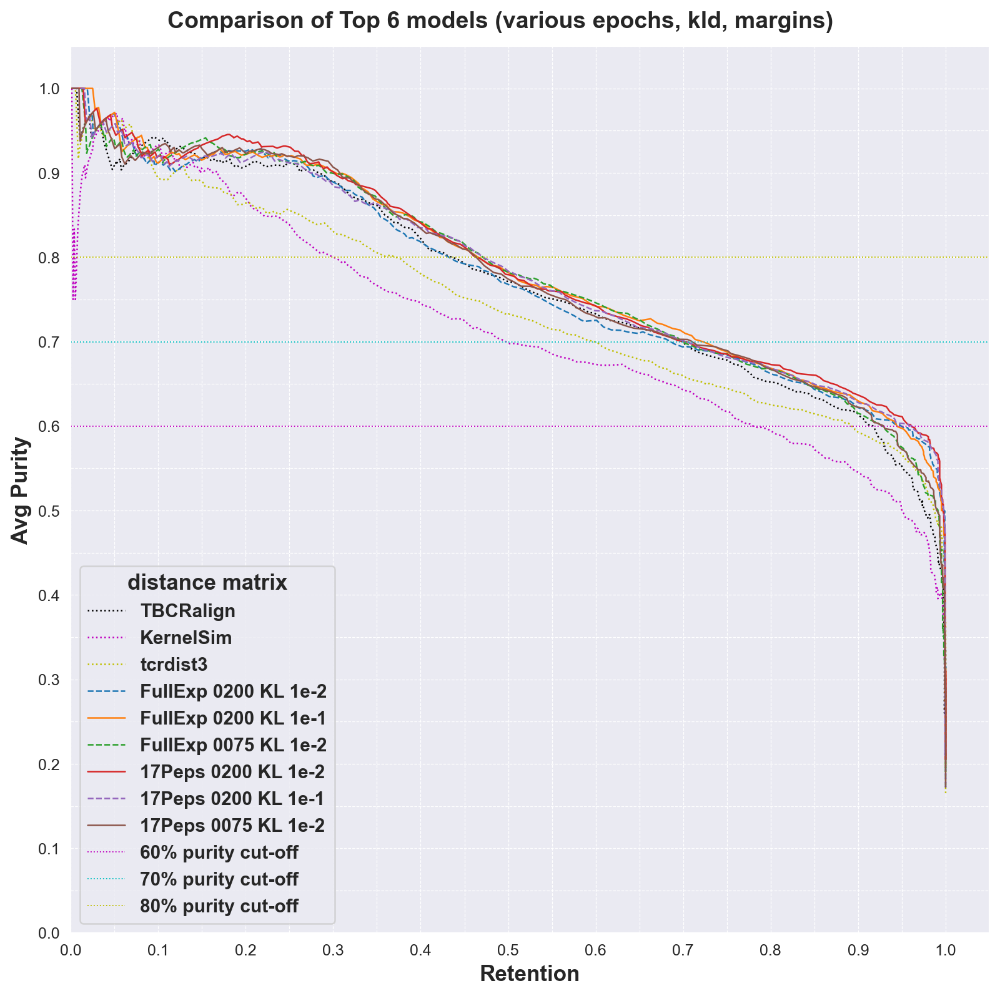

In [535]:
query_filter = ['TBCRalign', 'KernelSim', 'tcrdist3', 'FullExp_0200_KL_1e-2', 'FullExp_0200_KL_1e-1', 'FullExp_0075_KL_1e-2', '17Peps_0200_KL_1e-2', '17Peps_0200_KL_1e-1', '17Peps_0075_KL_1e-2']
plot_pipeline(all_agg_results.query('input_type in ["17Peps_0200", "17Peps_0075", "17Peps_KL_1e-1", "FullExp_KL_1e-1", "FullExp_0200", "FullExp_0075"]').replace({'FullExp_0200':'FullExp_0200_KL_1e-2', 'FullExp_0075':'FullExp_0075_KL_1e-2', '17Peps_0200':'17Peps_0200_KL_1e-2',  '17Peps_0075':'17Peps_0075_KL_1e-2', '17Peps_KL_1e-1':'17Peps_0200_KL_1e-1', 'FullExp_KL_1e-1':'FullExp_0200_KL_1e-1'}),
              baselines_valid, filter=query_filter,
              plot_title='Comparison of Top 6 models (various epochs, kld, margins)', fig_fn='Top6Models_Comparisons_validsetonly', palette='tab10' )

False
TBCRalign 	 0.7715
KernelSim 	 0.7165
tcrdist3 	 0.742
Agg_FullExp_0200_KL_1e-2 	 0.7782
Agg_17Peps_0200_KL_1e-2 	 0.79
Agg_FullExp_0200_KL_1e-1 	 0.7876
Agg_17Peps_0200_KL_1e-1 	 0.7843
Agg_FullExp_0075_KL_1e-2 	 0.783
Agg_17Peps_0075_KL_1e-2 	 0.7819


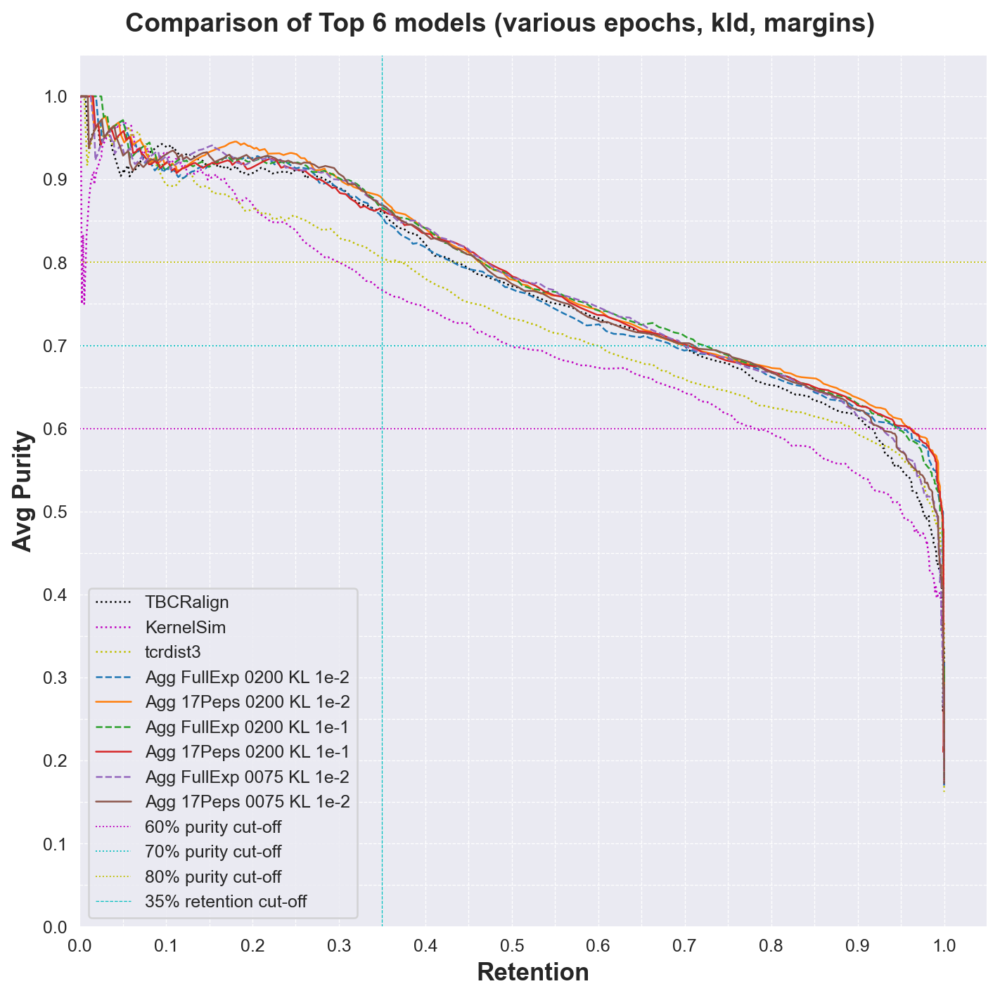

In [561]:
query_filter = ['TBCRalign', 'KernelSim', 'tcrdist3', 
                'Agg_FullExp_0200_KL_1e-2',  'Agg_17Peps_0200_KL_1e-2',
                'Agg_FullExp_0200_KL_1e-1',  'Agg_17Peps_0200_KL_1e-1',
                'Agg_FullExp_0075_KL_1e-2',  'Agg_17Peps_0075_KL_1e-2']

f,a = plt.subplots(1,1, figsize=(8,8))
plot_pipeline(all_agg_results.query('input_type in ["17Peps_0200", "17Peps_0075", "17Peps_KL_1e-1", "FullExp_KL_1e-1", "FullExp_0200", "FullExp_0075"]')\
              .replace({'FullExp_0200':'Agg_FullExp_0200_KL_1e-2', 
                        'FullExp_0075':'Agg_FullExp_0075_KL_1e-2', 
                        '17Peps_0200':'Agg_17Peps_0200_KL_1e-2', 
                        '17Peps_0075':'Agg_17Peps_0075_KL_1e-2', 
                        '17Peps_KL_1e-1':'Agg_17Peps_0200_KL_1e-1', 
                        'FullExp_KL_1e-1':'Agg_FullExp_0200_KL_1e-1'}),
              baselines_valid, filter=query_filter, f=f, ax=a,
              plot_title='Comparison of Top 6 models (various epochs, kld, margins)', fig_fn='Top4Models_Comparisons_validsetonly', palette='tab10' )
a.axvline(0.35, label='35% retention cut-off', c='c', ls='--', lw=.5)
a.legend()

In [588]:
query_filter = ['TBCRalign', 'KernelSim', 'tcrdist3', 'FullExp_0200_KL_1e-2', 'FullExp_0200_KL_1e-1', 'FullExp_0075_KL_1e-2', '17Peps_0200_KL_1e-2', '17Peps_0200_KL_1e-1', '17Peps_0075_KL_1e-2']
query = pd.concat([all_agg_results.query('input_type in ["17Peps_0200", "17Peps_0075", "17Peps_KL_1e-1", "FullExp_KL_1e-1", "FullExp_0200", "FullExp_0075"]').replace({'FullExp_0200':'FullExp_0200_KL_1e-2', 'FullExp_0075':'FullExp_0075_KL_1e-2', '17Peps_0200':'17Peps_0200_KL_1e-2',  '17Peps_0075':'17Peps_0075_KL_1e-2', '17Peps_KL_1e-1':'17Peps_0200_KL_1e-1', 'FullExp_KL_1e-1':'FullExp_0200_KL_1e-1'}),
                   baselines_valid])
xd=[]
for k in query_filter:
    tmp = query.query('input_type==@k')
    xd.append(get_all_rpauc(tmp['retention'].values[1:-1], tmp['mean_purity'].values[1:-1], k, k))
xd = pd.DataFrame(xd)

In [606]:
all_agg_results

,threshold,n_cluster,n_singletons,n_cluster_over_70p,mean_purity,min_purity,max_purity,mean_coherence,min_coherence,max_coherence,mean_cluster_size,min_cluster_size,max_cluster_size,silhouette,ch_index,db_index,ARI,retention,input_type
0,0.03079,0,1471,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,FullExp_0010
1,0.03158,1,1469,1,1.000000,1.000000,1.000000,0.030792,0.030792,0.030792,2.000000,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,FullExp_0010
2,0.03238,1,1469,1,1.000000,1.000000,1.000000,0.030792,0.030792,0.030792,2.000000,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,FullExp_0010
3,0.03317,1,1469,1,1.000000,1.000000,1.000000,0.030792,0.030792,0.030792,2.000000,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,FullExp_0010
4,0.03397,1,1469,1,1.000000,1.000000,1.000000,0.030792,0.030792,0.030792,2.000000,2.0,2.0,NaN,NaN,NaN,NaN,0.00136,FullExp_0010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,1.19689,3,0,0,0.158970,0.133159,0.187500,0.765088,0.750102,0.791931,490.333333,32.0,1056.0,NaN,NaN,NaN,NaN,1.00000,FullExp_KL_1
496,1.19913,3,0,0,0.158970,0.133159,0.187500,0.765088,0.750102,0.791931,490.333333,32.0,1056.0,NaN,NaN,NaN,NaN,1.00000,FullExp_KL_1
497,1.20136,2,0,0,0.158042,0.156250,0.159833,0.758480,0.750102,0.766859,735.500000,32.0,1439.0,NaN,NaN,NaN,NaN,1.00000,FullExp_KL_1
498,1.20360,2,0,0,0.158042,0.156250,0.159833,0.758480,0.750102,0.766859,735.500000,32.0,1439.0,NaN,NaN,NaN,NaN,1.00000,FullExp_KL_1


In [611]:
all_agg_results.query('input_type=="FullExp_KL_1e-1" and mean_purity>=0.7 and retention>=0.4')

,threshold,n_cluster,n_singletons,n_cluster_over_70p,mean_purity,min_purity,max_purity,mean_coherence,min_coherence,max_coherence,mean_cluster_size,min_cluster_size,max_cluster_size,silhouette,ch_index,db_index,ARI,retention,input_type
149,0.23551,225,879,151,0.840106,0.333333,1.0,0.190243,0.074332,0.235059,2.631111,2.0,11.0,NaN,NaN,NaN,NaN,0.402447,FullExp_KL_1e-1
150,0.23674,229,869,151,0.834165,0.333333,1.0,0.191366,0.074332,0.236591,2.628821,2.0,11.0,NaN,NaN,NaN,NaN,0.409245,FullExp_KL_1e-1
151,0.23797,232,859,151,0.829126,0.333333,1.0,0.192388,0.074332,0.237948,2.637931,2.0,11.0,NaN,NaN,NaN,NaN,0.416044,FullExp_KL_1e-1
152,0.23920,234,850,150,0.823464,0.333333,1.0,0.193691,0.074332,0.238767,2.653846,2.0,13.0,NaN,NaN,NaN,NaN,0.422162,FullExp_KL_1e-1
153,0.24044,236,844,151,0.822841,0.333333,1.0,0.194227,0.074332,0.239840,2.656780,2.0,13.0,NaN,NaN,NaN,NaN,0.426241,FullExp_KL_1e-1
154,0.24167,238,838,150,0.818727,0.333333,1.0,0.194972,0.074332,0.241101,2.659664,2.0,13.0,NaN,NaN,NaN,NaN,0.430320,FullExp_KL_1e-1
155,0.24290,245,821,152,0.812682,0.333333,1.0,0.196773,0.074332,0.242822,2.653061,2.0,13.0,NaN,NaN,NaN,NaN,0.441876,FullExp_KL_1e-1
156,0.24413,247,811,152,0.810150,0.333333,1.0,0.198276,0.074332,0.243818,2.672065,2.0,13.0,NaN,NaN,NaN,NaN,0.448674,FullExp_KL_1e-1
157,0.24536,250,804,153,0.808429,0.333333,1.0,0.198885,0.074332,0.245252,2.668000,2.0,13.0,NaN,NaN,NaN,NaN,0.453433,FullExp_KL_1e-1
158,0.24659,252,796,153,0.804859,0.333333,1.0,0.199957,0.074332,0.246589,2.678571,2.0,17.0,NaN,NaN,NaN,NaN,0.458872,FullExp_KL_1e-1


## small detour to code self-tcrbase

In [614]:
train_df = new_df_filt.query('partition!=0')
valid_df = new_df_filt.query('partition==0')

### implementation

In [618]:
preds = get_latent_df(get_model('../output/240429_KLweights/240429_1325_FullExp_KL_1e-1_0200_KFold_0_AllTriplet/'), train_df)

Reloading best model:
Best epoch: 19802
total: 0.10106079280376434
reconstruction: 0.060584235936403275
kld: 0.02383415959775448
triplet: 0.01664239913225174
seq_accuracy: 0.9934699535369873
pos_accuracy: 0.9976761937141418
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


In [619]:
peptide = "GILGFVFTL"
db = preds.query('peptide==@peptide and binder==1').assign(set='db')
query = preds.copy().assign(set='query')

In [694]:
def make_self_db_distmatrix(preds, peptide, label_col='peptide', cols=('peptide','original_peptide')):
    # Set self as db using the positives and query as the whole set
    db = preds.query('peptide==@peptide and binder==1').assign(set='db')
    query = preds.copy().assign(set='query')
    # Use the set columns to remove dupes and rearrange matrix
    dist_matrix = make_dist_matrix(pd.concat([db, query]), label_col, seq_cols=('A1','A2','A3','B1','B2','B3','set'), cols=cols)
    no_query = [x for x in dist_matrix.columns if 'query' not in x]
    only_query = [x for x in dist_matrix.index if 'query' in x]
    db_tcrs = [x.replace('db','') for x in dist_matrix.columns if 'db' in x]
    q_tcrs = [x.replace('query','') for x in dist_matrix.index if 'query' in x]
    dist_matrix = dist_matrix.loc[only_query][no_query]
    dist_matrix.drop_duplicates(inplace=True)
    dist_matrix.columns = dist_matrix.columns.str.replace('db','')
    dist_matrix.index = dist_matrix.index.str.replace('query','')
    # Puts nan to ignore during sorting
    dist_matrix.replace(0., np.nan, inplace=True)
    dist_matrix['label'] = (dist_matrix[label_col]==peptide).astype(int)
    return dist_matrix, db, query

In [ ]:
from sklearn.metrics import roc_auc_score
dist_matrix, db, query = make_self_db_distmatrix(preds, 'ELAGIGILTV')
# Do the TCRBase part and get the scores / query-db hits
pos = dist_matrix.query('label==1').drop(columns=['peptide', 'original_peptide', 'label'])
neg = dist_matrix.query('label==0').drop(columns=['peptide', 'original_peptide', 'label'])
pos_out = pos.apply(lambda x: [np.min(x), x.index[int(np.argmin(x))]], axis=1, result_type='expand').rename(columns = {0:'min_dist', 1:'hit'}).assign(label=1)
neg_out = neg.apply(lambda x: [np.min(x), x.index[int(np.argmin(x))]], axis=1, result_type='expand').rename(columns = {0:'min_dist', 1:'hit'}).assign(label=0)
cat_out = pd.concat([pos_out, neg_out])
auc = roc_auc_score(cat_out['label'], 1-cat_out['min_dist'])
cat_out = pd.merge(cat_out, dist_matrix[['original_peptide']], left_index=True, right_index=True).sort_values('label').drop_duplicates()
# Do the plotting part and get the distributions
pos = pos.values
neg = neg.values

In [734]:
np.nanmin??

Signature:
np.nanmin(
    a,
    axis=None,
    out=None,
    keepdims=<no value>,
    initial=<no value>,
    where=<no value>,
)
Source:   
@array_function_dispatch(_nanmin_dispatcher)
def nanmin(a, axis=None, out=None, keepdims=np._NoValue, initial=np._NoValue,
           where=np._NoValue):
    """
    Return minimum of an array or minimum along an axis, ignoring any NaNs.
    When all-NaN slices are encountered a ``RuntimeWarning`` is raised and
    Nan is returned for that slice.

    Parameters
    ----------
    a : array_like
        Array containing numbers whose minimum is desired. If `a` is not an
        array, a conversion is attempted.
    axis : {int, tuple of int, None}, optional
        Axis or axes along which the minimum is computed. The default is to compute
        the minimum of the flattened array.
    out : ndarray, optional
        Alternate output array in which to place the result.  The default
        is ``None``; if provided, it must have the same shape as

<Axes: xlabel='distance', ylabel='Percent'>

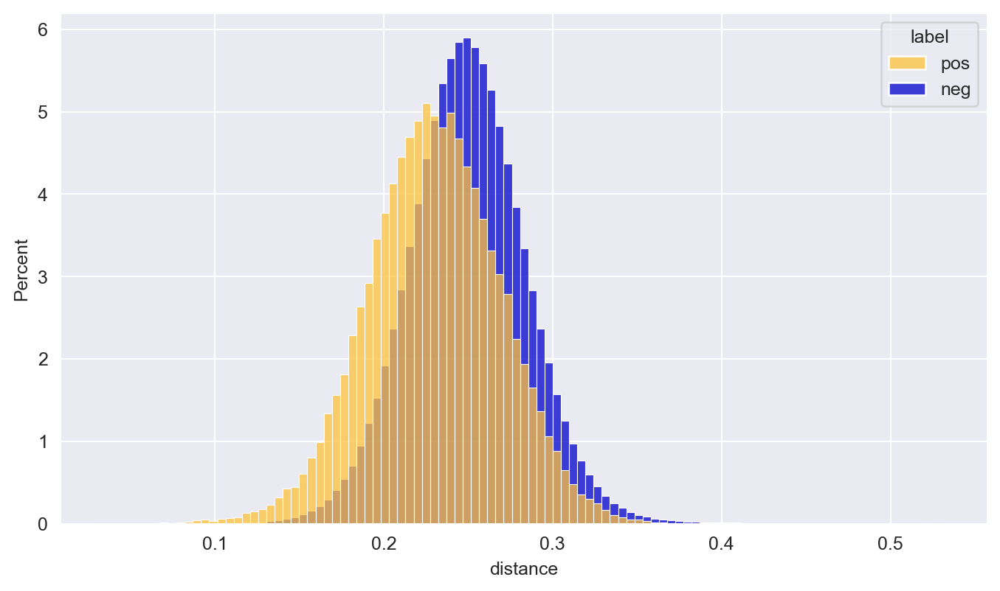

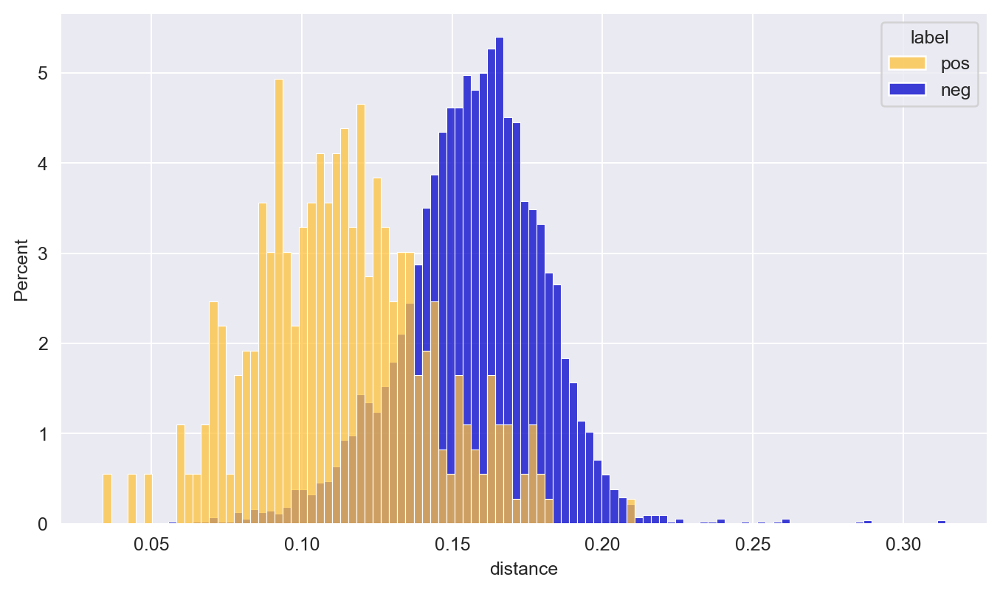

In [735]:
# Plotting All vs All

# if ax is None:
f, ax = plt.subplots(1, 1, figsize=(9, 5))
sns.histplot(data=df_plot_allvsall, x='distance', hue='label', ax=ax, kde=False,
             stat='percent', common_norm=False, bins=bins, alpha=0.75)

# Plotting "Best" score
pos_best = np.nanmin(pos, axis=1)
neg_best = np.nanmin(neg, axis=1)
cat_best = np.concatenate([pos_best, neg_best])
labels_best = np.concatenate([np.array(['pos'] * len(pos_best) + ['neg'] * len(neg_best))])
df_plot_best = pd.DataFrame(data=np.stack([cat_best, labels_best]).T, columns=['distance', 'label'])
df_plot_best['distance'] = df_plot_best['distance'].astype(float)
f2, ax2 = plt.subplots(1, 1, figsize=(9, 5))
bins = max(int(len(query.query('original_peptide==@peptide')) / 9), 25)

sns.histplot(data=df_plot_best, x='distance', hue='label', ax=ax2, kde=False,
             stat='percent', common_norm=False, bins=bins, alpha=0.75)

### results

In [774]:
from src.metrics import get_metrics
def read_tcrvae_results(peptide, original_df, dir):
    csv_file = glob.glob(f'{dir}*{peptide}*.csv')[0]
    df = pd.read_csv(csv_file)
    df['binder']=df['label']
    df['score'] = 1- df['min_dist']

    metrics = {'peptide':peptide, 'method':'_'.join(os.path.basename(csv_file).split('_')[5:]).split('_KFold')[0],  
               'n_pos':len(original_df.query('original_peptide==@peptide and binder==1'))}
    metrics.update(get_metrics(df['label'], df['score']))
    return metrics, df

In [775]:
tcrbase_swap = []
for d in glob.glob('../output/240428_FixTriplet/TCRBASE_ValidSwap/*/'):
    tcrbase_swap.extend([read_tcrvae_results(pep, new_df_filt, d)[0] for pep in new_df_filt.peptide.unique()])

tcrbase_self = []
for d in glob.glob('../output/240428_FixTriplet/TCRBASE_SelfDB/*/'):
    tcrbase_self.extend([read_tcrvae_results(pep, new_df_filt, d)[0] for pep in new_df_filt.peptide.unique()])

tcrbase_comp = pd.concat([pd.DataFrame(tcrbase_swap).assign(kind='TCRBase_swap'), pd.DataFrame(tcrbase_self).assign(kind='TCRBase_self')])

In [809]:
tcrbase_comp.reset_index(drop=True, inplace=True)
len(tcrbase_comp)

272

mean_auc
method                  kind                  
17Peps_RedoMargin_0075  TCRBase_self  0.724665
                        TCRBase_swap  0.725788
17Peps_RedoMargin_0200  TCRBase_self  0.731465
                        TCRBase_swap  0.743782
17Peps_RedoMargin_0500  TCRBase_self  0.542424
                        TCRBase_swap  0.666194
17Peps_RedoMargin_0800  TCRBase_self  0.577535
                        TCRBase_swap  0.761882
FullExp_RedoMargin_0075 TCRBase_self  0.713671
                        TCRBase_swap  0.719200
FullExp_RedoMargin_0200 TCRBase_self  0.727024
                        TCRBase_swap  0.738706
FullExp_RedoMargin_0500 TCRBase_self  0.661694
                        TCRBase_swap  0.728541
FullExp_RedoMargin_0800 TCRBase_self  0.614418
                        TCRBase_swap  0.724565

In [821]:
ffs = tcrbase_comp.query('method.str.contains("0200") or method.str.contains("0075")')
pd.merge(ffs.loc[ffs.groupby(['method', 'peptide']).auc.idxmax()].groupby(['method', 'kind']).agg(Wins_Over_17_peptides=('auc','count')),
         ffs.groupby(['method','kind']).agg(mean_auc=('auc','mean')), left_index=True, right_index=True)


Wins_Over_17_peptides  mean_auc
method                  kind                                         
17Peps_RedoMargin_0075  TCRBase_self                      9  0.724665
                        TCRBase_swap                      8  0.725788
17Peps_RedoMargin_0200  TCRBase_self                     10  0.731465
                        TCRBase_swap                      7  0.743782
FullExp_RedoMargin_0075 TCRBase_self                      9  0.713671
                        TCRBase_swap                      8  0.719200
FullExp_RedoMargin_0200 TCRBase_self                      7  0.727024
                        TCRBase_swap                     10  0.738706

In [780]:
tcrbase_comp.groupby(['method', 'peptide']).auc.idxmax()

method                   peptide   
17Peps_RedoMargin_0075   ATDALMTGF     97
                         AVFDRKSDAK    92
                         CINGVCWTV     93
                         ELAGIGILTV    86
                         GILGFVFTL     90
                                       ..
FullExp_RedoMargin_0800  QYIKWPWYI     67
                         RAKFKQLL       4
                         SPRWYFYYL     62
                         TTDPSFLGRY    51
                         YLQPRTFLL     57
Name: auc, Length: 136, dtype: int64

In [777]:
tcrbase_comp.melt(id_vars = ['peptide','method','kind'], value_vars=['auc', 'auc_01'])

,peptide,method,kind,variable,value
0,TTDPSFLGRY,17Peps_RedoMargin_0500,TCRBase_swap,auc,0.6262
1,ELAGIGILTV,17Peps_RedoMargin_0500,TCRBase_swap,auc,0.7088
2,KLGGALQAK,17Peps_RedoMargin_0500,TCRBase_swap,auc,0.5924
3,IVTDFSVIK,17Peps_RedoMargin_0500,TCRBase_swap,auc,0.6604
4,RAKFKQLL,17Peps_RedoMargin_0500,TCRBase_swap,auc,0.8526
...,...,...,...,...,...
539,ATDALMTGF,FullExp_RedoMargin_0075,TCRBase_self,auc_01,0.7554
540,GLCTLVAML,FullExp_RedoMargin_0075,TCRBase_self,auc_01,0.7423
541,LTDEMIAQY,FullExp_RedoMargin_0075,TCRBase_self,auc_01,0.6101
542,KTFPPTEPK,FullExp_RedoMargin_0075,TCRBase_self,auc_01,0.5252


In [776]:
tcrbase_comp

,peptide,method,n_pos,auc,auc_01,auc_01_real,precision,recall,accuracy,AP,kind
0,TTDPSFLGRY,17Peps_RedoMargin_0500,387,0.6262,0.5401,0.1263,0.1677,1.0000,0.1677,0.2988,TCRBase_swap
1,ELAGIGILTV,17Peps_RedoMargin_0500,457,0.7088,0.6716,0.3760,0.2252,0.6413,0.5701,0.5225,TCRBase_swap
2,KLGGALQAK,17Peps_RedoMargin_0500,901,0.5924,0.5343,0.1151,0.1891,0.7072,0.4436,0.2344,TCRBase_swap
3,IVTDFSVIK,17Peps_RedoMargin_0500,316,0.6604,0.5444,0.1343,0.1667,1.0000,0.1689,0.3047,TCRBase_swap
4,RAKFKQLL,17Peps_RedoMargin_0500,830,0.8526,0.7804,0.5827,0.3121,0.8253,0.6677,0.7278,TCRBase_swap
...,...,...,...,...,...,...,...,...,...,...,...
131,ATDALMTGF,FullExp_RedoMargin_0075,103,0.8575,0.7554,0.5353,0.0140,1.0000,0.0140,0.4740,TCRBase_self
132,GLCTLVAML,FullExp_RedoMargin_0075,271,0.8371,0.7423,0.5104,0.0369,1.0000,0.0369,0.4382,TCRBase_self
133,LTDEMIAQY,FullExp_RedoMargin_0075,129,0.5941,0.6101,0.2593,0.0176,1.0000,0.0176,0.2121,TCRBase_self
134,KTFPPTEPK,FullExp_RedoMargin_0075,119,0.5009,0.5252,0.0978,0.0162,1.0000,0.0162,0.0578,TCRBase_self


# Trainset cluster + valid set joining

## re-run baseline tbcralign for training set

In [19]:
tbcr_dm_filt_train = tbcr_dm140_labeled.query('peptide in @new_min20binders and partition!=0')
tbcr_array_train = tbcr_dm_filt_train[[str(x) for x in tbcr_dm_filt_train.index.to_list()]].values
tbcr_label_encoder = LabelEncoder()
tbcr_labels = tbcr_dm_filt_train.peptide.values
tbcr_encoded_labels = tbcr_label_encoder.fit_transform(tbcr_labels)

tbcr_trainset = cluster_all_thresholds(tbcr_array_train, torch.rand([len(tbcr_array_train), 3]), 
                                      tbcr_labels, tbcr_encoded_labels, tbcr_label_encoder, n_points=500)
tbcr_trainset['input_type'] = 'TBCRalign'



NameError: name 'tbcr_dm140_labeled' is not defined

In [1128]:
tcrdist_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/240422_new_df_tcrdist3_labelled.csv', index_col=0)
tcrdist_filt_train = tcrdist_labeled.query('partition!=0 and peptide in @new_min20binders')

In [1129]:
tcrdist_array_train = tcrdist_filt_train[[str(x) for x in tcrdist_filt_train.index.to_list()]].values

tcrdist_label_encoder = LabelEncoder()
tcrdist_labels = tcrdist_filt_train.peptide.values
tcrdist_encoded_labels = tcrdist_label_encoder.fit_transform(tcrdist_labels)

tcrdist_trainset = cluster_all_thresholds(tcrdist_array_train, torch.rand([len(tcrdist_filt_train),1]),
                                         tcrdist_labels, tcrdist_encoded_labels, tcrdist_label_encoder, n_points=500)
tcrdist_trainset['input_type'] = 'tcrdist3'

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [14:03<00:00,  1.69s/it]


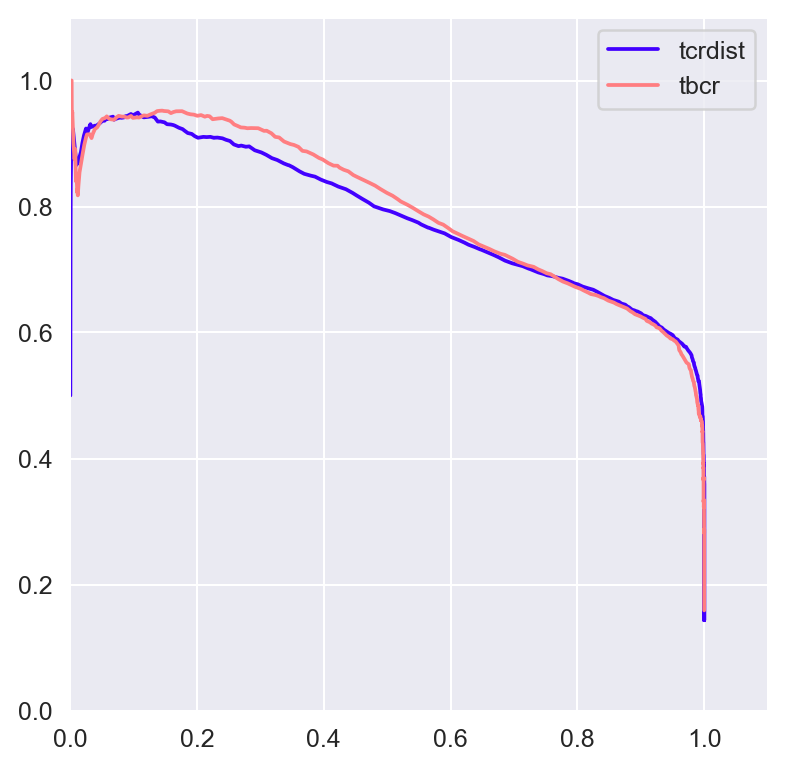

In [1130]:
sns.set_palette('gnuplot2',2)
f,a = plt.subplots(1,1, figsize=(5,5))
a.plot(tcrdist_trainset['retention'], tcrdist_trainset['mean_purity'], label='tcrdist')
a.plot(tbcr_trainset['retention'], tbcr_trainset['mean_purity'], label='tbcr')
a.set_ylim([0,1.1])
a.set_xlim([0,1.1])
a.legend()

In [1161]:
train_df = new_df_filt.query('partition!=0').reset_index(drop=True).drop_duplicates(subset=['A1','A2','A3','B1','B2','B3'])
valid_df = new_df_filt.query('partition==0').reset_index(drop=True).drop_duplicates(subset=['A1','A2','A3','B1','B2','B3'])

In [1018]:
# wtf ??
df = pd.read_csv('../data/filtered/231205_nettcr_old_26pep_with_swaps.csv').query('binder==1')
top15peps = df.groupby('peptide').agg(count=('B3','count')).sort_values('count',ascending=False).index[:15]
df_top15 = df.query('peptide in @top15peps')

In [1036]:
from sklearn.cluster import DBSCAN, HDBSCAN, KMeans
from sklearn.neighbors import KNeighborsClassifier

### checking with other models

In [1160]:
model = get_model('../output/240415_BL62LO_models/240415_1647_BL62LO_RefiltExpDataWITH10x_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_W10XrefMIN20/')
train_df = new_df_filt.query('partition!=0').sort_values('peptide').drop_duplicates(subset=['A1','A2','A3','B1','B2','B3'])
lat_df = get_latent_df(model, train_df, dataset_params = {'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7,
                                                          'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 
                                                          'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 
                                                          'pep_col': 'peptide', 'add_positional_encoding': True})
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(lat_df)
t = da[da>0].min()
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='complete', distance_threshold=t)
# c = KNeighborsClassifier(n_neighbors=2, metric='precomputed')
c.fit(da, encoded_labels)
wtf = get_all_metrics(t, feats, c, da, labels, encoded_labels, label_encoder)
print(wtf)

Reloading best model:
Best epoch: 28506
total: 0.08011127647062231
reconstruction: 0.05330948159098625
kld: 0.0026160262059420347
triplet: 0.024185769372185955
seq_accuracy: 0.9924525618553162
pos_accuracy: 0.997512936592102
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868
{'threshold': 0.0012446046, 'n_cluster': 0, 'n_singletons': 5868, 'n_cluster_over_70p': 0, 'mean_purity': nan, 'min_purity': nan, 'max_purity': nan, 'mean_coherence': nan, 'min_coherence': nan, 'max_coherence': nan, 'mean_cluster_size': nan, 'min_cluster_size': nan, 'max_cluster_size': nan, 'silhouette': nan, 'ch_index': nan, 'db_index': nan, 'ARI': 0.0}


In [1054]:
model = get_model('../output/240410_RetrainSmallerData/240411_0006_OLDDATA_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_OLDCosTCRP1/')
train_df = new_df_filt.query('partition!=0').sort_values('peptide').reset_index(drop=True)
lat_df = get_latent_df(model, train_df, dataset_params = {'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7,
                                                          'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 
                                                          'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 
                                                          'pep_col': 'peptide', 'add_positional_encoding': True})
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(lat_df)
t = da[da>0].min()
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='complete', distance_threshold=t)
# c = KNeighborsClassifier(n_neighbors=2, metric='precomputed')
c.fit(da, encoded_labels)
wtf = get_all_metrics(t, feats, c, da, labels, encoded_labels, label_encoder)
print(wtf)

Reloading best model:
Best epoch: 11791
total: 0.11228521011899112
reconstruction: 0.07581794768998108
kld: 0.002668110261791006
triplet: 0.03379915109368813
seq_accuracy: 0.9916457533836365
pos_accuracy: 0.9977738261222839
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5869
{'threshold': 0.0018823743, 'n_cluster': 1250, 'n_singletons': 3368, 'n_cluster_over_70p': 224, 'mean_purity': 0.5897333333333334, 'min_purity': 0.5, 'max_purity': 1.0, 'mean_coherence': 0.0, 'min_coherence': 0.0, 'max_coherence': 0.0, 'mean_cluster_size': 2.0008, 'min_cluster_size': 2, 'max_cluster_size': 3, 'silhouette': nan, 'ch_index': 1.0213631741352547, 'db_index': 1.2593305621147453, 'ARI': 0.00015784997730776068}


In [1054]:

model = get_model('../output/240410_RetrainSmallerData/240411_0006_OLDDATA_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_OLDCosTCRP1/')
train_df = new_df_filt.query('partition!=0').sort_values('peptide').reset_index(drop=True)
lat_df = get_latent_df(model, train_df, dataset_params = {'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7,
                                                          'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 
                                                          'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 
                                                          'pep_col': 'peptide', 'add_positional_encoding': True})
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(lat_df)
t = da[da>0].min()
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='complete', distance_threshold=t)
# c = KNeighborsClassifier(n_neighbors=2, metric='precomputed')
c.fit(da, encoded_labels)
wtf = get_all_metrics(t, feats, c, da, labels, encoded_labels, label_encoder)
print(wtf)

Reloading best model:
Best epoch: 11791
total: 0.11228521011899112
reconstruction: 0.07581794768998108
kld: 0.002668110261791006
triplet: 0.03379915109368813
seq_accuracy: 0.9916457533836365
pos_accuracy: 0.9977738261222839
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5869
{'threshold': 0.0018823743, 'n_cluster': 1250, 'n_singletons': 3368, 'n_cluster_over_70p': 224, 'mean_purity': 0.5897333333333334, 'min_purity': 0.5, 'max_purity': 1.0, 'mean_coherence': 0.0, 'min_coherence': 0.0, 'max_coherence': 0.0, 'mean_cluster_size': 2.0008, 'min_cluster_size': 2, 'max_cluster_size': 3, 'silhouette': nan, 'ch_index': 1.0213631741352547, 'db_index': 1.2593305621147453, 'ARI': 0.00015784997730776068}


In [1053]:
model = get_model('../output/240415_BL62LO_models/240415_1209_BL62LO_ExpData_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_LC62/')
train_df = new_df_filt.query('partition!=0').sort_values('peptide').reset_index(drop=True)
lat_df = get_latent_df(model, train_df, dataset_params = {'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7,
                                                          'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 
                                                          'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 
                                                          'pep_col': 'peptide', 'add_positional_encoding': True})
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(lat_df)
t = da[da>0].min()
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='complete', distance_threshold=t)
# c = KNeighborsClassifier(n_neighbors=2, metric='precomputed')
c.fit(da, encoded_labels)
wtf = get_all_metrics(t, feats, c, da, labels, encoded_labels, label_encoder)
print(wtf)

Reloading best model:
Best epoch: 29453
total: 0.0663668853099001
reconstruction: 0.041584160178899765
kld: 0.002584905596449971
triplet: 0.022197820698703588
seq_accuracy: 0.993326723575592
pos_accuracy: 0.9976133108139038
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5869
{'threshold': 0.0020460486, 'n_cluster': 1261, 'n_singletons': 3346, 'n_cluster_over_70p': 217, 'mean_purity': 0.5861749933914882, 'min_purity': 0.5, 'max_purity': 1.0, 'mean_coherence': 0.0, 'min_coherence': 0.0, 'max_coherence': 0.0, 'mean_cluster_size': 2.000793021411578, 'min_cluster_size': 2, 'max_cluster_size': 3, 'silhouette': nan, 'ch_index': 1.551426594839139, 'db_index': 1.198967602697508, 'ARI': 0.0001471405949736286}


### full runs

In [1162]:
def get_optimal_model(key, files_dict, compdict):
    folder = files_dict[key]
    stupid_join = '_'.join([compdict[key][-2], compdict[key][-1]])+'_'
    pt = glob.glob(f'{folder}*{stupid_join}*.pt')[0]
    js = glob.glob(f'{folder}*kwargs*.json')[0]
    model = load_model_full(pt, js, map_location='cpu')
    return model


In [1163]:
opt_keys = ['17Peps_0075', '17Peps_0200', '17Peps_KL_1e-1', 'FullExp_0075', 'FullExp_0200', 'FullExp_KL_1e-1']
results_train_agg = []
for k in opt_keys:
    model = get_optimal_model(k, files_dict, compdict)
    # model = get_model(files_dict[k])
    results_train_agg.append(pipeline_best_model_clustering(model, train_df, k))

Reloading best model:
Best epoch: 19666
total: 0.10894448310136795
reconstruction: 0.0942053347826004
kld: 0.0039469716139137745
triplet: 0.010792173445224762
seq_accuracy: 0.989261269569397
pos_accuracy: 0.997549295425415
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868
5868


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [11:29<00:00,  1.38s/it]


Reloading best model:
Best epoch: 19388
total: 0.1286619007587433
reconstruction: 0.09704592823982239
kld: 0.003539084689691663
triplet: 0.028076887130737305
seq_accuracy: 0.9884433746337891
pos_accuracy: 0.9974499940872192
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868
5868


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [12:02<00:00,  1.44s/it]


Reloading best model:
Best epoch: 19956
total: 0.13747850060462952
reconstruction: 0.08526500314474106
kld: 0.024024372920393944
triplet: 0.028189126402139664
seq_accuracy: 0.989902913570404
pos_accuracy: 0.9975818395614624
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868
5868


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [12:21<00:00,  1.48s/it]


Reloading best model:
Best epoch: 18934
total: 0.07274257391691208
reconstruction: 0.06246810406446457
kld: 0.003820466808974743
triplet: 0.006454008631408215
seq_accuracy: 0.9933130145072937
pos_accuracy: 0.9977250695228577
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868
5868


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [11:34<00:00,  1.39s/it]


Reloading best model:
Best epoch: 19642
total: 0.08294446766376495
reconstruction: 0.06290315836668015
kld: 0.003458661027252674
triplet: 0.01658264920115471
seq_accuracy: 0.9935669302940369
pos_accuracy: 0.9977483153343201
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868
5868


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [12:22<00:00,  1.49s/it]


Reloading best model:
Best epoch: 19802
total: 0.10106079280376434
reconstruction: 0.060584235936403275
kld: 0.02383415959775448
triplet: 0.01664239913225174
seq_accuracy: 0.9934699535369873
pos_accuracy: 0.9976761937141418
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868
5868


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [12:18<00:00,  1.48s/it]


In [1164]:
results_train_agg = pd.concat(results_train_agg)
results_train_agg.to_csv('../output/240411_ClusteringTests/240502_TrainCluster_results.csv')

False
TBCRalign
KernelSim 	 -1
tcrdist3
17Peps_0075
17Peps_0200
17Peps_KL_1e-1
FullExp_0075
FullExp_0200
FullExp_KL_1e-1


,threshold,n_cluster,n_singletons,n_cluster_over_70p,mean_purity,min_purity,max_purity,mean_coherence,min_coherence,max_coherence,mean_cluster_size,min_cluster_size,max_cluster_size,silhouette,ch_index,db_index,ARI,retention,input_type
0,0.00327,1,5867,1,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.0,2.0,2.0,0.000341,0.563182,1.079495,0.000001,0.000341,TBCRalign
1,0.00395,2,5865,2,1.000000,1.000000,1.000000,0.001637,0.000000,0.003275,2.0,2.0,2.0,0.000665,1.087784,1.081732,0.000002,0.000682,TBCRalign
2,0.00462,2,5865,2,1.000000,1.000000,1.000000,0.001637,0.000000,0.003275,2.0,2.0,2.0,0.000665,1.087784,1.081732,0.000002,0.000682,TBCRalign
3,0.00530,2,5865,2,1.000000,1.000000,1.000000,0.001637,0.000000,0.003275,2.0,2.0,2.0,0.000665,1.087784,1.081732,0.000002,0.000682,TBCRalign
4,0.00597,7,5855,7,1.000000,1.000000,1.000000,0.004369,0.000000,0.005576,2.0,2.0,2.0,0.002167,1.128824,1.470855,0.000009,0.002385,TBCRalign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.52817,2,0,0,0.169018,0.158549,0.179487,0.265333,0.243510,0.287156,2934.0,78.0,5790.0,0.169759,60.174963,2.848398,-0.000355,1.000000,FullExp_KL_1e-1
496,0.52924,2,0,0,0.169018,0.158549,0.179487,0.265333,0.243510,0.287156,2934.0,78.0,5790.0,0.169759,60.174963,2.848398,-0.000355,1.000000,FullExp_KL_1e-1
497,0.53030,2,0,0,0.169018,0.158549,0.179487,0.265333,0.243510,0.287156,2934.0,78.0,5790.0,0.169759,60.174963,2.848398,-0.000355,1.000000,FullExp_KL_1e-1
498,0.53137,2,0,0,0.169018,0.158549,0.179487,0.265333,0.243510,0.287156,2934.0,78.0,5790.0,0.169759,60.174963,2.848398,-0.000355,1.000000,FullExp_KL_1e-1


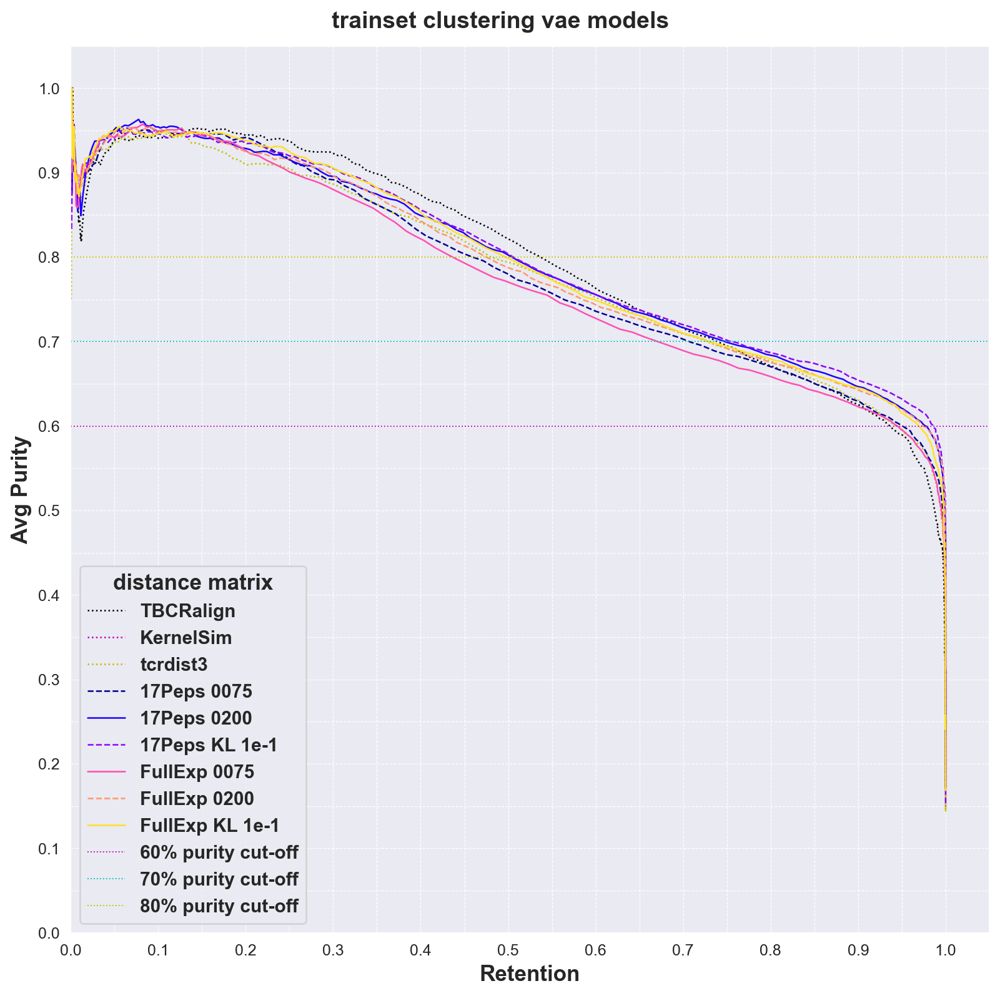

In [1238]:
plot_pipeline(results_train_agg, pd.concat([tbcr_trainset, tcrdist_trainset]), 
              plot_title = 'trainset clustering vae models',
              fig_fn = '240506_trainset_clustering_vaemodels')

In [1217]:
new_df_filt.loc[new_df_filt.duplicated(subset=['A1','A2','A3','B1','B2','B3'], keep=False)]

,Unnamed: 0,peptide,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,db,len_q
5651,7513,GILGFVFTL,SIFNT,LYKAGEL,AGPMKTSYDKVI,SGHDY,FNNNVP,ASSSANYGYT,HLA-A*02:01,3,1,VDJdb,GILGFVFTL,VDJdb_65884,28636592,InfluenzaA,paired,nettcr,5
6433,8592,NLVPMVATV,SIFNT,LYKAGEL,AGPMKTSYDKVI,SGHDY,FNNNVP,ASSSANYGYT,HLA-A*02:01,2,1,VDJdb,NLVPMVATV,VDJdb_4837,19864595,CMV,paired,nettcr,5


In [1225]:
train_df = new_df_filt.query('partition!=0 and raw_index!="VDJdb_4837"')#.drop_duplicates(subset=['A1','A2','A3','B1','B2','B3'])
tbcr_dm_filt_train = tbcr_dm_filt_train.query('q_index!=8592')
tbcr_dm_filt_train = tbcr_dm_filt_train[[str(x) for x in tbcr_dm_filt_train.index.to_list() + ['peptide','partition','raw_index','original_peptide','binder']]]
print(len(train_df), tbcr_dm_filt_train.shape)

5868 (5868, 5873)


In [1227]:
# do 2 agg runs with the best models then get the best clustering as a filter for tcrbase

opt_keys = ['17Peps_0200', '17Peps_KL_1e-1']
results_more_agg = []
for k in opt_keys:
    model = get_optimal_model(k, files_dict, compdict)
    # model = get_model(files_dict[k])
    results_more_agg.append(do_agg_clustering(model, train_df, tbcr_dm_filt_train).assign(input_type=f'agg_{k}'))

Reloading best model:
epoch: 6000
total: 0.23586291074752808
reconstruction: 0.2034846693277359
kld: 0.0038797457236796618
triplet: 0.02849850058555603
seq_accuracy: 0.968456506729126
pos_accuracy: 0.9979590177536011
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
(5868, 122)
(5868, 122)
5868
(5868, 5872) (5868, 5868)
(5868, 5868)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [14:17<00:00,  1.72s/it]


Reloading best model:
epoch: 6000
total: 0.23878780007362366
reconstruction: 0.18487198650836945
kld: 0.025452343747019768
triplet: 0.02846347540616989
seq_accuracy: 0.9702258706092834
pos_accuracy: 0.9977402687072754
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
(5868, 122)
(5868, 122)
5868
(5868, 5872) (5868, 5868)
(5868, 5868)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [13:30<00:00,  1.62s/it]


In [ ]:
results_more_agg = pd.concat(results_more_agg)
results_more_agg.to_csv('../output/240411_ClusteringTests/240502_TrainClusterAgg_results.csv')
pd.concat([tbcr_trainset, tcrdist_trainset]).to_csv('../output/240411_ClusteringTests/240502_TrainsetBaselineTBCRtcrdist3.csv')

False
TBCRalign
KernelSim 	 -1
tcrdist3
agg_17Peps_0200
agg_17Peps_KL_1e-1


,threshold,n_cluster,n_singletons,n_cluster_over_70p,mean_purity,min_purity,max_purity,mean_coherence,min_coherence,max_coherence,mean_cluster_size,min_cluster_size,max_cluster_size,silhouette,ch_index,db_index,ARI,retention,input_type
0,0.00327,1,5867,1,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.0,2.0,2.0,0.000341,0.563182,1.079495,0.000001,0.000341,TBCRalign
1,0.00395,2,5865,2,1.000000,1.000000,1.000000,0.001637,0.000000,0.003275,2.0,2.0,2.0,0.000665,1.087784,1.081732,0.000002,0.000682,TBCRalign
2,0.00462,2,5865,2,1.000000,1.000000,1.000000,0.001637,0.000000,0.003275,2.0,2.0,2.0,0.000665,1.087784,1.081732,0.000002,0.000682,TBCRalign
3,0.00530,2,5865,2,1.000000,1.000000,1.000000,0.001637,0.000000,0.003275,2.0,2.0,2.0,0.000665,1.087784,1.081732,0.000002,0.000682,TBCRalign
4,0.00597,7,5855,7,1.000000,1.000000,1.000000,0.004369,0.000000,0.005576,2.0,2.0,2.0,0.002167,1.128824,1.470855,0.000009,0.002385,TBCRalign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.65540,2,0,0,0.171747,0.159821,0.183673,0.405865,0.385593,0.426137,2934.0,49.0,5819.0,0.156343,85.775156,1.908878,0.000318,1.000000,agg_17Peps_KL_1e-1
496,0.65671,2,0,0,0.171747,0.159821,0.183673,0.405865,0.385593,0.426137,2934.0,49.0,5819.0,0.156343,85.775156,1.908878,0.000318,1.000000,agg_17Peps_KL_1e-1
497,0.65802,2,0,0,0.171747,0.159821,0.183673,0.405865,0.385593,0.426137,2934.0,49.0,5819.0,0.156343,85.775156,1.908878,0.000318,1.000000,agg_17Peps_KL_1e-1
498,0.65934,2,0,0,0.171747,0.159821,0.183673,0.405865,0.385593,0.426137,2934.0,49.0,5819.0,0.156343,85.775156,1.908878,0.000318,1.000000,agg_17Peps_KL_1e-1


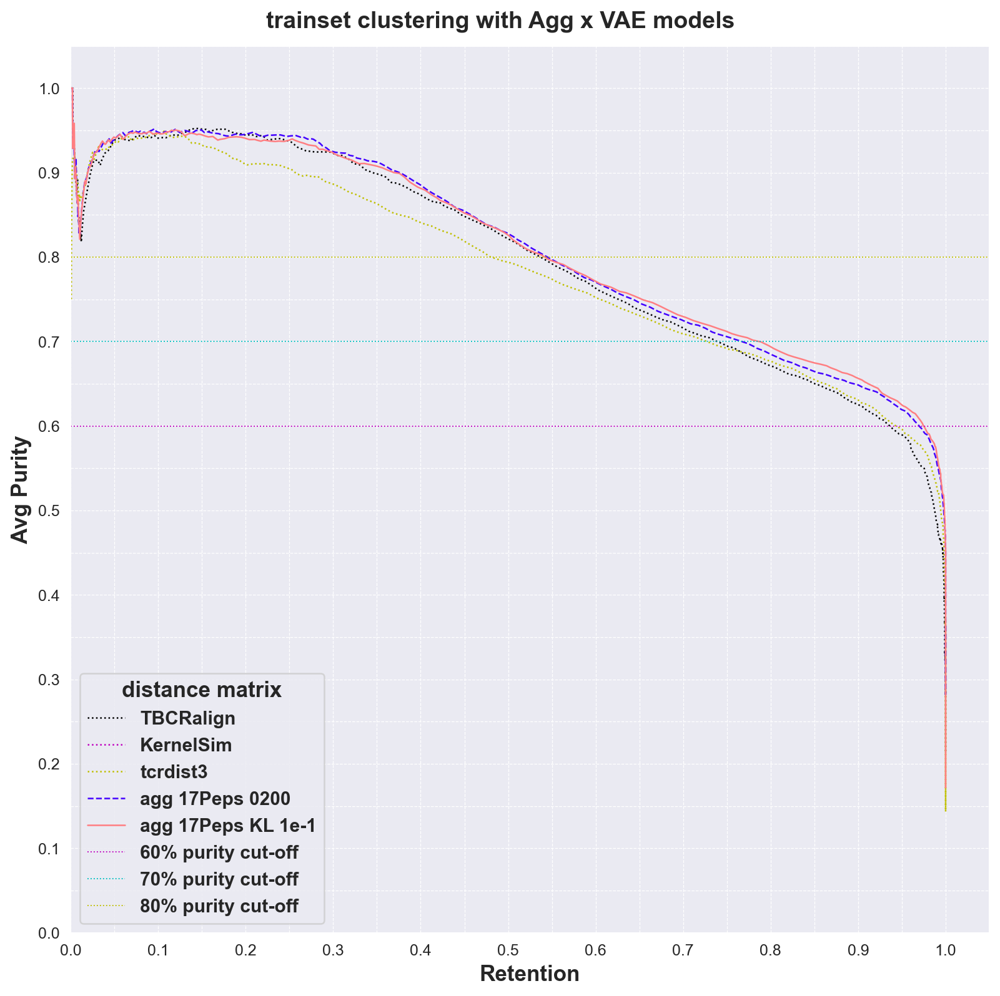

In [1240]:
plot_pipeline(results_more_agg, pd.concat([tbcr_trainset, tcrdist_trainset]),
             plot_title = 'trainset clustering with Agg x VAE models',
              fig_fn = '240506_trainset_clustering_Agg_models')

## From the best model, use to "filter" train set and re-run tcrbase


In [1293]:
results_more_agg.query('input_type.str.contains("1e-1") and mean_purity>=0.85 and retention>=0.35').sort_values('n_cluster_over_70p').tail(n=3)

,threshold,n_cluster,n_singletons,n_cluster_over_70p,mean_purity,min_purity,max_purity,mean_coherence,min_coherence,max_coherence,mean_cluster_size,min_cluster_size,max_cluster_size,silhouette,ch_index,db_index,ARI,retention,input_type
145,0.19559,913,3352,668,0.864419,0.25,1.0,0.153474,0.036384,0.195393,2.755750,2.0,26.0,0.089793,4.682809,0.679389,0.003882,0.428766,agg_17Peps_KL_1e-1
147,0.19822,931,3277,668,0.857055,0.25,1.0,0.155619,0.036384,0.198201,2.783029,2.0,29.0,0.091661,4.634407,0.688639,0.004139,0.441547,agg_17Peps_KL_1e-1
148,0.19953,949,3228,672,0.852058,0.25,1.0,0.156946,0.036384,0.199495,2.781876,2.0,29.0,0.092587,4.623354,0.693189,0.004186,0.449898,agg_17Peps_KL_1e-1


In [1568]:
model = get_optimal_model('17Peps_KL_1e-1', files_dict, compdict)
latent_df = get_latent_df(model, train_df)
latent_df = latent_df.set_index('raw_index').loc[tbcr_dm_filt_train['raw_index'].values].reset_index()
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(latent_df)
other_array = tbcr_dm_filt_train.iloc[:len(tbcr_dm_filt_train), :len(tbcr_dm_filt_train)].values
agg_array = 1 - np.multiply(1-da, 1-other_array)

threshold = 0.19953
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold=threshold, linkage='complete')
c.fit(agg_array)
metric, stats_df = get_all_metrics(threshold, feats, c, agg_array, labels, encoded_labels, label_encoder, return_df=True)
display(stats_df.query('cluster_size==2').groupby('purity').count())

latent_df['pred_label'] = c.labels_
singleton_flag = np.bincount(c.labels_)==1
latent_df['is_singleton'] = latent_df['pred_label'].apply(lambda x: singleton_flag[x])

Reloading best model:
epoch: 6000
total: 0.23878780007362366
reconstruction: 0.18487198650836945
kld: 0.025452343747019768
triplet: 0.02846347540616989
seq_accuracy: 0.9702258706092834
pos_accuracy: 0.9977402687072754
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868


,coherence,cluster_size,pred_label
purity,,,
0.5,227,227,227
1.0,406,406,406


In [1627]:
metric

{'threshold': 0.19953,
 'n_cluster': 949,
 'n_singletons': 3228,
 'n_cluster_over_70p': 672,
 'mean_purity': 0.8520576231897746,
 'min_purity': 0.25,
 'max_purity': 1.0,
 'mean_coherence': 0.1569457824068909,
 'min_coherence': 0.03638434331546214,
 'max_coherence': 0.1994947633641163,
 'mean_cluster_size': 2.7818756585879876,
 'min_cluster_size': 2,
 'max_cluster_size': 29,
 'silhouette': 0.09258659497088569,
 'ch_index': 4.6233538068824105,
 'db_index': 0.6931892054433024,
 'ARI': 0.004186368617029061}

In [1608]:
stats_df.query('cluster_size>2').groupby(['cluster_size'])['purity'].describe()

,count,mean,std,min,25%,50%,75%,max
cluster_size,,,,,,,,
3,168.0,0.910714,0.176735,0.333333,1.000000,1.000000,1.000000,1.000000
4,66.0,0.893939,0.175744,0.250000,0.750000,1.000000,1.000000,1.000000
5,28.0,0.907143,0.167616,0.400000,0.800000,1.000000,1.000000,1.000000
6,15.0,0.977778,0.058644,0.833333,1.000000,1.000000,1.000000,1.000000
7,11.0,0.974026,0.086146,0.714286,1.000000,1.000000,1.000000,1.000000
8,11.0,0.965909,0.080834,0.750000,1.000000,1.000000,1.000000,1.000000
9,5.0,0.911111,0.144871,0.666667,0.888889,1.000000,1.000000,1.000000
10,6.0,0.866667,0.280476,0.300000,0.925000,1.000000,1.000000,1.000000
11,1.0,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000


In [1569]:
filtered_df = latent_df.query('not is_singleton')[['partition', 'raw_index','original_peptide','peptide', 'binder', 'origin', 'A1','A2','A3','B1','B2','B3', 'seq', 'pred_label', 'is_singleton']]
filtered_df.to_csv('../output/240411_ClusteringTests/240506_KL1e-1_tbcr_agg_pred_threshold_019953_nosingletons.csv')

In [1570]:
not_filtered_df = latent_df[['partition', 'raw_index','original_peptide','peptide', 'binder', 'origin', 'A1','A2','A3','B1','B2','B3', 'seq', 'pred_label', 'is_singleton']].copy()

# filtered TCRBase

## Saving

In [1358]:
filtered_df.query('original_peptide=="GILGFVFTL"')

,partition,raw_index,original_peptide,peptide,binder,origin,A1,A2,A3,B1,B2,B3,seq,pred_label,is_singleton
6,2,VDJdb_65870,GILGFVFTL,GILGFVFTL,1,VDJdb,SIFNT,LYKAGEL,AGNYGGSQGNLI,LNHDA,SQIVND,ASSIRGSGEQY,SIFNTLYKAGELAGNYGGSQGNLILNHDASQIVNDASSIRGSGEQY,43,False
12,1,ITRAP_4946,GILGFVFTL,GILGFVFTL,1,10x,DSSSTY,IFSNMDM,AERQNFV,LNHDA,SQIVND,ASSISSTGELF,DSSSTYIFSNMDMAERQNFVLNHDASQIVNDASSISSTGELF,306,False
16,1,ITRAP_624,GILGFVFTL,GILGFVFTL,1,10x,NSAFQY,TYSSGN,AMSGDGGSQGNLI,LNHDA,SQIVND,ASSIRAGETQY,NSAFQYTYSSGNAMSGDGGSQGNLILNHDASQIVNDASSIRAGETQY,190,False
17,1,ITRAP_1356,GILGFVFTL,GILGFVFTL,1,10x,TTLSN,LVKSGEV,AGNYGGSQGNLI,LNHDA,SQIVND,ASSTRSHEPQH,TTLSNLVKSGEVAGNYGGSQGNLILNHDASQIVNDASSTRSHEPQH,43,False
89,3,VDJdb_64968,GILGFVFTL,GILGFVFTL,1,VDJdb,SIFNT,LYKAGEL,AGGGDGGSQGNLI,LNHDA,SQIVND,ASSPRSGSTEAF,SIFNTLYKAGELAGGGDGGSQGNLILNHDASQIVNDASSPRSGSTEAF,157,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5817,1,ITRAP_652,GILGFVFTL,GILGFVFTL,1,10x,TSENNYY,QEAYKQQN,AFMKDAGGTSYGKLT,LNHDA,SQIVND,ASSIGVYGYT,TSENNYYQEAYKQQNAFMKDAGGTSYGKLTLNHDASQIVNDASSIG...,38,False
5840,1,ITRAP_5571,GILGFVFTL,GILGFVFTL,1,10x,TISGTDY,GLTSN,ILRDLNAGGTSYGKLT,LNHDA,SQIVND,ASSTGQPQH,TISGTDYGLTSNILRDLNAGGTSYGKLTLNHDASQIVNDASSTGQPQH,77,False
5843,1,ITRAP_1242,GILGFVFTL,GILGFVFTL,1,10x,DRGSQS,IYSNGD,AALGGGADGLT,DFQATT,SNEGSKA,SAPPGDHTEAF,DRGSQSIYSNGDAALGGGADGLTDFQATTSNEGSKASAPPGDHTEAF,482,False
5855,4,ITRAP_5092,GILGFVFTL,GILGFVFTL,1,10x,SIFNT,LYKAGEL,AGAGDGGSQGNLI,MNHEY,SVGEGT,ASSYSSGGADTQY,SIFNTLYKAGELAGAGDGGSQGNLIMNHEYSVGEGTASSYSSGGADTQY,769,False


In [1348]:
# Do both types : VAE tcrbase and tbcr tcrbase
new_df_filt_with_swaps = pd.read_csv('../data/filtered/240418_nettcr_expanded_20binders_17pep_withswaps.csv')
# for VAE TCRbase, just concat the validation and the filtered DF and save as a new df
concat = pd.concat([new_df_filt_with_swaps.query('partition==0'), filtered_df])
concat.to_csv('../data/filtered/240506_reconcat_aggcluster_filtered_df_17peps_with_p0swaps.csv')
os.makedirs('../data/TCRBASE/tcrbase_expanded_denoised_p0_20binders_swapped/', exist_ok=True)
# for the old TCRbase, save each file 
for p in concat.peptide.unique():
    concat.query('partition==0 and peptide==@p')[['A1','A2','A3','B1','B2','B3']].to_csv(f'../data/TCRBASE/tcrbase_expanded_denoised_p0_20binders_swapped/{p}_query_p0.tsv',
                                                                                sep = '\t', header=False)
    concat.query('partition!=0 and original_peptide==@p and binder==1')[['A1','A2','A3','B1','B2','B3']].to_csv(f'../data/TCRBASE/tcrbase_expanded_denoised_p0_20binders_swapped/{p}_db_p0.tsv',
                                                                                sep = '\t', header=False)

## results

In [1379]:
def read_tcrbase_results(peptide, original_df, dir='../output/tcrbase_expanded_p0_swapped/'):
    cols = ['xx', 'xy', 'id_query'] + [f'q_{x}' for x in ['A1','A2','A3','B1','B2','B3']] + ['bs1', 'hit', 'id_db'] + [f'db_{x}' for x in ['A1','A2','A3','B1','B2','B3']] + ['score', 'bs2']
    df = pd.read_csv(f'{dir}{peptide}.txt', comment='#', sep='\s', header=None, names=cols)
    results = pd.merge(df.set_index('id_query')[['score', 'id_db']+[f'db_{x}' for x in ['A1','A2','A3','B1','B2','B3']]],
                       original_df[['binder', 'peptide', 'A1','A2','A3','B1','B2','B3']],
                       left_index=True, right_index=True)
    print(peptide, round(roc_auc_score(results['binder'], results['score']),4))
    tcrbase_metrics = {'peptide':peptide, 
                       'method':'tcrbase',
                       'n_pos':len(original_df.query('original_peptide==@peptide and partition==0'))}
    tcrbase_metrics.update(get_metrics(results['binder'], results['score'], round_digit=5))
    print(tcrbase_metrics)
    return tcrbase_metrics, results

original_df = concat.query('partition==0').copy()
original_df['q_index'] = original_df['Unnamed: 0'].astype(int)
original_df.set_index('q_index', inplace=True)
original_df.drop(columns=['Unnamed: 0'], inplace=True)
tcrbase_results=pd.concat([pd.DataFrame([read_tcrbase_results(p, original_df, '../output/TCRBASE/tcrbase_expanded_denoised_p0_20binders_swapped/')[0] for p in concat.peptide.unique()]).assign(db_type='denoised'),
                           pd.DataFrame([read_tcrbase_results(p, original_df, '../output/TCRBASE/tcrbase_expanded_p0_20binders_swapped/')[0] for p in concat.peptide.unique()]).assign(db_type='normal')])
tcrbase_results.sort_values('peptide')

KLGGALQAK 0.5873
{'peptide': 'KLGGALQAK', 'method': 'tcrbase', 'n_pos': 812, 'auc': 0.58729, 'auc_01': 0.53994, 'auc_01_real': 0.12588, 'precision': 0.16728, 'recall': 1.0, 'accuracy': 0.16728, 'AP': 0.2666}
GILGFVFTL 0.7972
{'peptide': 'GILGFVFTL', 'method': 'tcrbase', 'n_pos': 929, 'auc': 0.79724, 'auc_01': 0.71878, 'auc_01_real': 0.46567, 'precision': 0.16667, 'recall': 1.0, 'accuracy': 0.16667, 'AP': 0.57974}
TTDPSFLGRY 0.6613
{'peptide': 'TTDPSFLGRY', 'method': 'tcrbase', 'n_pos': 412, 'auc': 0.66127, 'auc_01': 0.60327, 'auc_01_real': 0.24621, 'precision': 0.16774, 'recall': 1.0, 'accuracy': 0.16774, 'AP': 0.40452}
AVFDRKSDAK 0.488
{'peptide': 'AVFDRKSDAK', 'method': 'tcrbase', 'n_pos': 630, 'auc': 0.48802, 'auc_01': 0.50995, 'auc_01_real': 0.06891, 'precision': 0.16628, 'recall': 1.0, 'accuracy': 0.16628, 'AP': 0.18659}
ELAGIGILTV 0.9171
{'peptide': 'ELAGIGILTV', 'method': 'tcrbase', 'n_pos': 429, 'auc': 0.91711, 'auc_01': 0.80048, 'auc_01_real': 0.62092, 'precision': 0.16758, 'r

,peptide,method,n_pos,auc,auc_01,auc_01_real,precision,recall,accuracy,AP,db_type
15,ATDALMTGF,tcrbase,99,0.69854,0.73505,0.49660,0.16260,1.0,0.16260,0.61238,normal
15,ATDALMTGF,tcrbase,99,0.69417,0.69596,0.42233,0.16260,1.0,0.16260,0.55394,denoised
3,AVFDRKSDAK,tcrbase,630,0.48802,0.50995,0.06891,0.16628,1.0,0.16628,0.18659,denoised
3,AVFDRKSDAK,tcrbase,630,0.48551,0.50745,0.06416,0.16628,1.0,0.16628,0.18505,normal
14,CINGVCWTV,tcrbase,226,0.79921,0.72344,0.47453,0.16605,1.0,0.16605,0.64002,normal
14,CINGVCWTV,tcrbase,226,0.80649,0.67220,0.37719,0.16605,1.0,0.16605,0.56846,denoised
4,ELAGIGILTV,tcrbase,429,0.91711,0.80048,0.62092,0.16758,1.0,0.16758,0.78057,denoised
4,ELAGIGILTV,tcrbase,429,0.93198,0.80832,0.63581,0.16758,1.0,0.16758,0.80004,normal
1,GILGFVFTL,tcrbase,929,0.79724,0.71878,0.46567,0.16667,1.0,0.16667,0.57974,denoised
1,GILGFVFTL,tcrbase,929,0.80299,0.71910,0.46628,0.16667,1.0,0.16667,0.57919,normal


In [1382]:
def read_tcrvae_results(peptide, original_df, dir):
    csv_file = glob.glob(f'{dir}*{peptide}*.csv')[0]
    df = pd.read_csv(csv_file)
    df['binder']=df['label']
    df['score'] = 1- df['min_dist']
    metrics = {'peptide':peptide, 'method':'_'.join(os.path.basename(csv_file).split('_')[5:]), 
               'n_pos':len(original_df.query('original_peptide==@peptide and partition==0 and binder==0'))}
    metrics.update(get_metrics(df['label'], df['score']))
    return metrics, df


tcrvaebase_results=pd.concat([pd.DataFrame([read_tcrvae_results(p, concat, '../output/240429_KLweights/TCRBASE_ValidSwap/tcrbase_240426_1604_17Peps_KL_1e-2_0200_KFold_0_KFold_0_240506_1423_AllTriplet/')[0] for p in concat.peptide.unique()]).assign(db_type='denoised'),
                              pd.DataFrame([read_tcrvae_results(p, concat, '../output/240428_FixTriplet/TCRBASE_ValidSwap/tcrbase_240426_1604_17Peps_RedoMargin_0200_KFold_0_KFold_0_240502_1421_AllTriplet/')[0] for p in concat.peptide.unique()]).assign(db_type='normal')])
tcrvaebase_results.sort_values('peptide')

,peptide,method,n_pos,auc,auc_01,auc_01_real,precision,recall,accuracy,AP,db_type
15,ATDALMTGF,17Peps_RedoMargin_0200_KFold_0_KFold_0_240502_...,79,0.8641,0.7655,0.5544,0.1626,1.0,0.1626,0.7311,normal
15,ATDALMTGF,17Peps_KL_1e-2_0200_KFold_0_KFold_0_240506_142...,79,0.7136,0.6850,0.4015,0.1626,1.0,0.1626,0.5672,denoised
3,AVFDRKSDAK,17Peps_KL_1e-2_0200_KFold_0_KFold_0_240506_142...,487,0.5076,0.5162,0.0807,0.1663,1.0,0.1663,0.1858,denoised
3,AVFDRKSDAK,17Peps_RedoMargin_0200_KFold_0_KFold_0_240502_...,487,0.5325,0.5206,0.0891,0.1663,1.0,0.1663,0.1993,normal
14,CINGVCWTV,17Peps_RedoMargin_0200_KFold_0_KFold_0_240502_...,181,0.8530,0.7757,0.5738,0.1661,1.0,0.1661,0.7247,normal
14,CINGVCWTV,17Peps_KL_1e-2_0200_KFold_0_KFold_0_240506_142...,181,0.8245,0.7263,0.4800,0.1661,1.0,0.1661,0.6464,denoised
4,ELAGIGILTV,17Peps_KL_1e-2_0200_KFold_0_KFold_0_240506_142...,337,0.9107,0.7541,0.5327,0.1676,1.0,0.1676,0.6963,denoised
4,ELAGIGILTV,17Peps_RedoMargin_0200_KFold_0_KFold_0_240502_...,337,0.9061,0.7181,0.4644,0.1676,1.0,0.1676,0.6588,normal
1,GILGFVFTL,17Peps_KL_1e-2_0200_KFold_0_KFold_0_240506_142...,696,0.8408,0.7751,0.5727,0.1667,1.0,0.1667,0.6696,denoised
1,GILGFVFTL,17Peps_RedoMargin_0200_KFold_0_KFold_0_240502_...,696,0.8420,0.7768,0.5759,0.1667,1.0,0.1667,0.6719,normal


In [1391]:
cat_results = pd.concat([tcrbase_results.assign(model='TCRbase'),
                         tcrvaebase_results.assign(model='TCRVAEBase')])
pd.set_option('display.max_rows', 99)
cat_results.groupby(['peptide','model', 'db_type']).agg(auc=('auc','first'), auc_01=('auc_01','first')).reset_index().melt(value_vars =['auc','auc_01'], 
                                                                                                                           id_vars =['model','db_type','peptide'])

,model,db_type,peptide,variable,value
0,TCRVAEBase,denoised,ATDALMTGF,auc,0.71360
1,TCRVAEBase,normal,ATDALMTGF,auc,0.86410
2,TCRbase,denoised,ATDALMTGF,auc,0.69417
3,TCRbase,normal,ATDALMTGF,auc,0.69854
4,TCRVAEBase,denoised,AVFDRKSDAK,auc,0.50760
...,...,...,...,...,...
131,TCRbase,normal,TTDPSFLGRY,auc_01,0.61969
132,TCRVAEBase,denoised,YLQPRTFLL,auc_01,0.65600
133,TCRVAEBase,normal,YLQPRTFLL,auc_01,0.65370
134,TCRbase,denoised,YLQPRTFLL,auc_01,0.67026


In [1401]:
clean_results = cat_results.groupby(['peptide','model', 'db_type']).agg(auc=('auc','first'), auc_01=('auc_01','first')).reset_index()
clean_results

,peptide,model,db_type,auc,auc_01
0,ATDALMTGF,TCRVAEBase,denoised,0.71360,0.68500
1,ATDALMTGF,TCRVAEBase,normal,0.86410,0.76550
2,ATDALMTGF,TCRbase,denoised,0.69417,0.69596
3,ATDALMTGF,TCRbase,normal,0.69854,0.73505
4,AVFDRKSDAK,TCRVAEBase,denoised,0.50760,0.51620
5,AVFDRKSDAK,TCRVAEBase,normal,0.53250,0.52060
6,AVFDRKSDAK,TCRbase,denoised,0.48802,0.50995
7,AVFDRKSDAK,TCRbase,normal,0.48551,0.50745
8,CINGVCWTV,TCRVAEBase,denoised,0.82450,0.72630
9,CINGVCWTV,TCRVAEBase,normal,0.85300,0.77570


In [1408]:
tcrbase_comp = []
for p in clean_results.peptide.unique():
    for m in clean_results.model.unique():
        tmp = clean_results.query('peptide==@p and model==@m')
        a=tmp.query('db_type=="normal"')
        b=tmp.query('db_type!="normal"')
        tcrbase_comp.append({'peptide':p, 'model':m, 
                             'd_auc':  a['auc'].item()-b['auc'].item(), 
                             'd_auc_01':a['auc_01'].item()-b['auc_01'].item()})
tcrbase_comp = pd.DataFrame(tcrbase_comp)
tcrbase_comp['denoised_is_better'] = tcrbase_comp['d_auc']<0
tcrbase_comp

,peptide,model,d_auc,d_auc_01,denoised_is_better
0,ATDALMTGF,TCRVAEBase,0.15050,0.08050,False
1,ATDALMTGF,TCRbase,0.00437,0.03909,False
2,AVFDRKSDAK,TCRVAEBase,0.02490,0.00440,False
3,AVFDRKSDAK,TCRbase,-0.00251,-0.00250,True
4,CINGVCWTV,TCRVAEBase,0.02850,0.04940,False
5,CINGVCWTV,TCRbase,-0.00728,0.05124,True
6,ELAGIGILTV,TCRVAEBase,-0.00460,-0.03600,True
7,ELAGIGILTV,TCRbase,0.01487,0.00784,False
8,GILGFVFTL,TCRVAEBase,0.00120,0.00170,False
9,GILGFVFTL,TCRbase,0.00575,0.00032,False


# Take the "best" filtered train dataset and re-use for assigning clusters? 

In [ ]:
# Here, need to redefine "majority label" (if p>0.5) for all the predicted labels
# use get_all_metrics and adjust it to return the xd df with a majority label (maybe)

In [1596]:
# Actually do this with the whole train set since the TCRBase method is better without de-noising ??
recat = pd.concat([not_filtered_df.assign(db_type='train_denoised'), valid_df.assign(db_type='query')]).fillna(-1)
lat_df = get_latent_df(model, recat)
recat_dm = make_dist_matrix(lat_df, cols=['original_peptide','binder','origin','is_singleton','db_type','pred_label'])
recat_dm['pred_label']=recat_dm['pred_label'].astype(int)
recat_dm_db = recat_dm.query('db_type=="train_denoised"')
recat_dm_db_tcrs = recat_dm_db.index.to_list()
recat_dm_query = recat_dm.query('db_type=="query"')[recat_dm_db_tcrs+['pred_label','original_peptide','binder','origin','is_singleton','db_type']]
threshold = 0.19953
# Using the query to db filter on the dataframe
q_db_matrix = recat_dm_query[recat_dm_db_tcrs]
q_db_array = q_db_matrix.values
# threshold the array (x = query index, y = db_index)
q_idx, db_idx = np.where(q_db_array<threshold)

for q in sorted(np.unique(q_idx)):
    # For each Q index, i.e. each item in the query that had a value below threshold
    db = db_idx[np.where(q_idx==q)]
    # get the subset of the array (i.e. single row and all the columns that fit that)
    subset = q_db_array[q, db]
    # For this subset, sort it and take the top 1% closest neighbours or number 1 if there's only one and save to a new list?
    sorted_db_idx = np.argsort(subset)
    to_save = max(math.ceil(0.01*len(sorted_db_idx)), 1)
    # Top idx here is the index of the top db as it is for this subset. 
    # to get the "global" top db idx (i.e. to index the dataframe instead) --> get :to_save on `db`
    top_idx = sorted_db_idx[:1]
    top_values = subset[top_idx]
    top_idx_db = db[top_idx]
    hit = recat_dm.loc[q_db_matrix.iloc[q, top_idx_db].index, ['original_peptide','binder','origin','is_singleton','db_type','pred_label']]
    recat_dm_query.loc[recat_dm_query.iloc[[q]].index, 'pred_label'] = hit['pred_label'].item()
    recat_dm_query.loc[recat_dm_query.iloc[[q]].index, 'pred_peptide'] = hit['original_peptide'].item()

recat_dm_query['pred_correct'] = recat_dm_query['original_peptide']==recat_dm_query['pred_peptide']
count = recat_dm_query.groupby(['original_peptide', 'pred_correct']).agg(count=('pred_correct','count'))
not_filtered_results = (count / recat_dm_query.groupby(['original_peptide']).agg(count=('pred_correct','count')) * 100).round(3)

{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
7339


In [1597]:
# Actually do this with the whole train set since the TCRBase method is better without de-noising ??
recat = pd.concat([filtered_df.assign(db_type='train_denoised'), valid_df.assign(db_type='query')]).fillna(-1)
lat_df = get_latent_df(model, recat)
recat_dm = make_dist_matrix(lat_df, cols=['original_peptide','binder','origin','is_singleton','db_type','pred_label'])
recat_dm['pred_label']=recat_dm['pred_label'].astype(int)
recat_dm_db = recat_dm.query('db_type=="train_denoised"')
recat_dm_db_tcrs = recat_dm_db.index.to_list()
recat_dm_query = recat_dm.query('db_type=="query"')[recat_dm_db_tcrs+['pred_label','original_peptide','binder','origin','is_singleton','db_type']]
threshold = 0.19953
# Using the query to db filter on the dataframe
q_db_matrix = recat_dm_query[recat_dm_db_tcrs]
q_db_array = q_db_matrix.values
# threshold the array (x = query index, y = db_index)
q_idx, db_idx = np.where(q_db_array<threshold)

for q in sorted(np.unique(q_idx)):
    # For each Q index, i.e. each item in the query that had a value below threshold
    db = db_idx[np.where(q_idx==q)]
    # get the subset of the array (i.e. single row and all the columns that fit that)
    subset = q_db_array[q, db]
    # For this subset, sort it and take the top 1% closest neighbours or number 1 if there's only one and save to a new list?
    sorted_db_idx = np.argsort(subset)
    to_save = max(math.ceil(0.01*len(sorted_db_idx)), 1)
    # Top idx here is the index of the top db as it is for this subset. 
    # to get the "global" top db idx (i.e. to index the dataframe instead) --> get :to_save on `db`
    top_idx = sorted_db_idx[:1]
    top_values = subset[top_idx]
    top_idx_db = db[top_idx]
    hit = recat_dm.loc[q_db_matrix.iloc[q, top_idx_db].index, ['original_peptide','binder','origin','is_singleton','db_type','pred_label']]
    recat_dm_query.loc[recat_dm_query.iloc[[q]].index, 'pred_label'] = hit['pred_label'].item()
    recat_dm_query.loc[recat_dm_query.iloc[[q]].index, 'pred_peptide'] = hit['original_peptide'].item()

recat_dm_query['pred_correct'] = recat_dm_query['original_peptide']==recat_dm_query['pred_peptide']
count = recat_dm_query.groupby(['original_peptide', 'pred_correct']).agg(count=('pred_correct','count'))
filtered_results = (count / recat_dm_query.groupby(['original_peptide']).agg(count=('pred_correct','count')) * 100).round(3)

{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
4111


In [1603]:
filtering_merged_results = pd.merge(not_filtered_results, filtered_results, left_index=True, right_index=True, suffixes=('_not_filtered_train', '_denoised_train'))
filtering_merged_results.to_csv('../output/240411_ClusteringTests/240506_RejoinClusters_NoFilter_vs_Filtered.csv')

In [1604]:
filtering_merged_results

count_not_filtered_train  count_denoised_train
original_peptide pred_correct                                                
ATDALMTGF        False                           60.000                65.000
                 True                            40.000                35.000
AVFDRKSDAK       False                           83.916                90.909
                 True                            16.084                 9.091
CINGVCWTV        False                           35.556                53.333
                 True                            64.444                46.667
ELAGIGILTV       False                           39.130                40.217
                 True                            60.870                59.783
GILGFVFTL        False                           33.476                30.901
                 True                            66.524                69.099
GLCTLVAML        False                           50.909                52.727
                 True                            49.091                47.273
IVTDFSVIK        False                           77.778                82.540
                 True                            22.222                17.460
KLGGALQAK        False                           77.348                82.320
                 True                            22.652                17.680
KTFPPTEPK        False                           95.833               100.000
LLWNGPMAV        False                           28.000                24.000
                 True                            72.000                76.000
LTDEMIAQY        False                           65.385                80.769
                 True                            34.615                19.231
NLVPMVATV        False                           77.027                81.081
                 True                            22.973                18.919
QYIKWPWYI        False                           59.259                66.667
                 True                            40.741                33.333
RAKFKQLL         False                           23.494                22.289
                 True                            76.506                77.711
SPRWYFYYL        False                           67.416                70.787
                 True                            32.584                29.213
TTDPSFLGRY       False                           70.513                73.077
                 True                            29.487                26.923
YLQPRTFLL        False                           56.250                57.500
                 True                            43.750                42.500

In [1559]:
recat_dm_query.query('pred_peptide!=original_peptide').groupby('original_peptide').count()

,ATGYPSATKADDKALSGNTDKLIMDHENSYDVKMASSLAGGIVDEQF,VSPFSNMTFSENTVGYTNAGKSTSEHNRFQNEAQASTTGLAGTDTQY,SIFNTLYKAGELAGNYGGSQGNLILNHDASQIVNDASSIRGSGEQY,DSASNYIRSNVGEAAMETSYDKVISGHATFQNNGVASSLGVAGTNTGELF,DRGSQSIYSNGDAVQGGKLIMNHNSSASEGTASSETGGQPQH,DSAIYNIQSSQREAVGLTWGKLQDFQATTSNEGSKASARDGGTDTQY,DSSSTYIFSNMDMAERQNFVLNHDASQIVNDASSISSTGELF,NSASQSVYSSGVVNKYDKIISEHNRFQNEAQASSLDIEQY,NSAFQYTYSSGNAMSGDGGSQGNLILNHDASQIVNDASSIRAGETQY,TTLSNLVKSGEVAGNYGGSQGNLILNHDASQIVNDASSTRSHEPQH,...,DSASNYIRSNVGEAASGPGDDKIIMNHEYSMNVEVASSPHFQVDTGELF,TTSDRLLSNGAVAVDFRDNYGQNFVSGDLSYYNGEEASSLSSGTYEQY,SIFNTLYKAGELAGHTGNQFYMDHENSYDVKMASSLNGQGAGYT,DRGSQSIYSNGDAVNQGGGSQGNLILNHDASQIVNDASSFRAPYGYT,pred_label,binder,origin,is_singleton,db_type,pred_peptide
original_peptide,,,,,,,,,,,,,,,,,,,,,
ATDALMTGF,13,13,13,13,13,13,13,13,13,13,...,13,13,13,13,13,13,13,13,13,13
AVFDRKSDAK,130,130,130,130,130,130,130,130,130,130,...,130,130,130,130,130,130,130,130,130,130
CINGVCWTV,24,24,24,24,24,24,24,24,24,24,...,24,24,24,24,24,24,24,24,24,24
ELAGIGILTV,37,37,37,37,37,37,37,37,37,37,...,37,37,37,37,37,37,37,37,37,37
GILGFVFTL,72,72,72,72,72,72,72,72,72,72,...,72,72,72,72,72,72,72,72,72,71
GLCTLVAML,29,29,29,29,29,29,29,29,29,29,...,29,29,29,29,29,29,29,29,29,29
IVTDFSVIK,52,52,52,52,52,52,52,52,52,52,...,52,52,52,52,52,52,52,52,52,52
KLGGALQAK,149,149,149,149,149,149,149,149,149,149,...,149,149,149,149,149,149,149,149,149,149
KTFPPTEPK,24,24,24,24,24,24,24,24,24,24,...,24,24,24,24,24,24,24,24,24,24


In [1560]:
recat_dm_query.query('pred_peptide==original_peptide').groupby('original_peptide').count()

,ATGYPSATKADDKALSGNTDKLIMDHENSYDVKMASSLAGGIVDEQF,VSPFSNMTFSENTVGYTNAGKSTSEHNRFQNEAQASTTGLAGTDTQY,SIFNTLYKAGELAGNYGGSQGNLILNHDASQIVNDASSIRGSGEQY,DSASNYIRSNVGEAAMETSYDKVISGHATFQNNGVASSLGVAGTNTGELF,DRGSQSIYSNGDAVQGGKLIMNHNSSASEGTASSETGGQPQH,DSAIYNIQSSQREAVGLTWGKLQDFQATTSNEGSKASARDGGTDTQY,DSSSTYIFSNMDMAERQNFVLNHDASQIVNDASSISSTGELF,NSASQSVYSSGVVNKYDKIISEHNRFQNEAQASSLDIEQY,NSAFQYTYSSGNAMSGDGGSQGNLILNHDASQIVNDASSIRAGETQY,TTLSNLVKSGEVAGNYGGSQGNLILNHDASQIVNDASSTRSHEPQH,...,DSASNYIRSNVGEAASGPGDDKIIMNHEYSMNVEVASSPHFQVDTGELF,TTSDRLLSNGAVAVDFRDNYGQNFVSGDLSYYNGEEASSLSSGTYEQY,SIFNTLYKAGELAGHTGNQFYMDHENSYDVKMASSLNGQGAGYT,DRGSQSIYSNGDAVNQGGGSQGNLILNHDASQIVNDASSFRAPYGYT,pred_label,binder,origin,is_singleton,db_type,pred_peptide
original_peptide,,,,,,,,,,,,,,,,,,,,,
ATDALMTGF,7,7,7,7,7,7,7,7,7,7,...,7,7,7,7,7,7,7,7,7,7
AVFDRKSDAK,13,13,13,13,13,13,13,13,13,13,...,13,13,13,13,13,13,13,13,13,13
CINGVCWTV,21,21,21,21,21,21,21,21,21,21,...,21,21,21,21,21,21,21,21,21,21
ELAGIGILTV,55,55,55,55,55,55,55,55,55,55,...,55,55,55,55,55,55,55,55,55,55
GILGFVFTL,161,161,161,161,161,161,161,161,161,161,...,161,161,161,161,161,161,161,161,161,161
GLCTLVAML,26,26,26,26,26,26,26,26,26,26,...,26,26,26,26,26,26,26,26,26,26
IVTDFSVIK,11,11,11,11,11,11,11,11,11,11,...,11,11,11,11,11,11,11,11,11,11
KLGGALQAK,32,32,32,32,32,32,32,32,32,32,...,32,32,32,32,32,32,32,32,32,32
LLWNGPMAV,57,57,57,57,57,57,57,57,57,57,...,57,57,57,57,57,57,57,57,57,57


# Old Dataset 

In [1093]:
tbcr_dm26_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/OUTPUT_tbcralign_distmatrix_26peps.csv')
tbcr_dm26_labeled.head()

,q_index,0,1,2,3,4,5,6,7,8,...,6343,6344,6345,6346,6347,6348,6349,6350,6351,6352
0,0,0.000000,0.182765,0.183134,0.227084,0.243003,0.238474,0.236563,0.197173,0.225632,...,0.251753,0.194374,0.221982,0.214763,0.217336,0.209870,0.211303,0.195196,0.222778,0.199147
1,1,0.182765,0.000000,0.194468,0.191884,0.198635,0.220054,0.203693,0.161305,0.192499,...,0.216890,0.162313,0.173387,0.197350,0.203248,0.178304,0.175080,0.195830,0.205867,0.160389
2,2,0.183134,0.194468,0.000000,0.178148,0.195645,0.218649,0.198692,0.183789,0.170229,...,0.203266,0.179116,0.193117,0.180303,0.185329,0.188692,0.206535,0.198895,0.155225,0.168177
3,3,0.227084,0.191884,0.178148,0.000000,0.176993,0.214502,0.204893,0.170153,0.202338,...,0.199936,0.206849,0.170807,0.193893,0.185911,0.182270,0.232380,0.222017,0.119060,0.177463
4,4,0.243003,0.198635,0.195645,0.176993,0.000000,0.214537,0.203967,0.197887,0.200758,...,0.196252,0.192613,0.216113,0.194983,0.199725,0.198697,0.204503,0.218433,0.170897,0.198731


In [1095]:
df_old = pd.read_csv('../data/filtered/240416_nettcr_old_26pep_no_swaps.csv')
index_26 = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/OUTPUT_index_tcrs_26pep.txt')


In [1101]:
df_old['tcr'] = df_old['A1']+df_old['A2']+df_old['A3']+df_old['B1']+df_old['B2']+df_old['B3']
index_26 = index_26.set_index('tcr').merge(df_old.set_index('tcr')[['peptide','origin','binder','partition','original_index','original_peptide']],
                                left_index=True, right_index=True).reset_index(drop=True).set_index('q_index')
tbcr_dm26_labeled = tbcr_dm26_labeled.set_index('q_index').merge(index_26, left_index=True, right_index=True)

In [1103]:
tbcr_dm26_labeled.to_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_26peps_labeled.csv')


In [ ]:
old_results = []

for partition in range(5):
    train_26 = tbcr_dm26_labeled.query('partition!=@partition').reset_index(drop=True)
    valid_26 = tbcr_dm26_labeled.query('partition==@partition').reset_index(drop=True)
    train_26_array = train_26

In [1081]:
tbcr_dm_filt_train = tbcr_dm140_labeled.query('peptide in @new_min20binders and partition!=0')
tbcr_array_train = tbcr_dm_filt_train.iloc[:len(tbcr_dm_filt_train), :len(tbcr_dm_filt_train)].values
tbcr_label_encoder = LabelEncoder()
tbcr_labels = tbcr_dm_filt_train.peptide.values
tbcr_encoded_labels = tbcr_label_encoder.fit_transform(tbcr_labels)

tbcr_trainset = cluster_all_thresholds(tbcr_array_train, torch.rand([len(tbcr_array_train), 3]), 
                                      tbcr_labels, tbcr_encoded_labels, tbcr_label_encoder, n_points=500)
tbcr_trainset['input_type'] = 'TBCRalign'



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [11:14<00:00,  1.35s/it]


In [1084]:
tcrdist_filt_train

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,9764,9765,9766,9767,9768,peptide,original_peptide,raw_index,partition,binder
0,0,0,820,679,697,775,858,652,651,885,...,744,786,784,621,625,TTDPSFLGRY,TTDPSFLGRY,VDJdb_69875,1,1
4,4,775,851,857,782,0,782,866,701,974,...,775,740,630,808,761,ELAGIGILTV,ELAGIGILTV,ITRAP_4414,1,1
5,5,858,910,916,748,782,0,982,780,934,...,909,940,797,816,820,KLGGALQAK,KLGGALQAK,ITRAP_2865,3,1
6,6,652,738,839,747,866,982,0,769,898,...,724,850,887,739,776,IVTDFSVIK,IVTDFSVIK,ITRAP_4589,1,1
9,9,804,790,772,775,868,996,874,831,1002,...,753,882,946,702,808,RAKFKQLL,RAKFKQLL,ITRAP_3093,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9762,9762,733,914,861,869,803,856,716,661,991,...,787,964,848,721,765,KLGGALQAK,KLGGALQAK,ITRAP_3187,2,1
9764,9764,744,850,862,670,775,909,724,708,921,...,0,870,856,636,703,NLVPMVATV,NLVPMVATV,VDJdb_6082,2,1
9765,9765,786,781,880,853,740,940,850,826,684,...,870,0,755,843,754,ELAGIGILTV,ELAGIGILTV,ITRAP_2417,3,1
9766,9766,784,845,911,764,630,797,887,725,725,...,856,755,0,859,635,GILGFVFTL,GILGFVFTL,ITRAP_799,1,1


In [1086]:
tcrdist_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/240422_new_df_tcrdist3_labelled.csv', index_col=0)
tcrdist_filt_train = tcrdist_labeled.query('partition!=0 and peptide in @new_min20binders').reset_index(drop=True)

In [1090]:
tcrdist_array_train = tcrdist_filt_train.iloc[:len(tcrdist_filt_train), :len(tcrdist_filt_train)].values

tcrdist_label_encoder = LabelEncoder()
tcrdist_labels = tcrdist_filt_train.peptide.values
tcrdist_encoded_labels = tcrdist_label_encoder.fit_transform(tcrdist_labels)

tcrdist_trainset = cluster_all_thresholds(tcrdist_array_train, torch.rand([len(tcrdist_filt_train),1]),
                                         tcrdist_labels, tcrdist_encoded_labels, tcrdist_label_encoder, n_points=500)
tcrdist_trainset['input_type'] = 'tcrdist3'

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [11:08<00:00,  1.34s/it]


# Take the whole dataset together and do the clustering part

In [76]:
tbcr_old = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_26peps_labeled.csv', index_col=0)
tbcr_new = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv', index_col=0)

In [80]:
from src.cluster_utils import resort_baseline

In [134]:
shuffled_input = df_old.query('partition==1').sample(frac=1)
a,b = resort_baseline(tbcr_old, shuffled_input, 'original_index')
a

,3047,4511,1574,4367,91,455,5171,3618,2806,5883,...,5126,5317,4933,2675,1740,peptide,original_peptide,binder,partition,original_index
q_index,,,,,,,,,,,,,,,,,,,,,
3047,0.000000,0.179738,0.161268,0.192364,0.191089,0.184461,0.214078,0.187948,0.183660,0.216187,...,0.208262,0.218963,0.230494,0.173171,0.209087,DATYQRTRALVR,DATYQRTRALVR,1,1,4376
4511,0.179738,0.000000,0.188097,0.173485,0.180995,0.179466,0.189322,0.175421,0.178752,0.181839,...,0.181839,0.176962,0.189299,0.188541,0.223681,KLGGALQAK,KLGGALQAK,1,1,4895
1574,0.161268,0.188097,0.000000,0.183288,0.201029,0.196158,0.194612,0.184536,0.168947,0.158773,...,0.196766,0.197164,0.224865,0.173434,0.205562,GILGFVFTL,GILGFVFTL,1,1,85
4367,0.192364,0.173485,0.183288,0.000000,0.208654,0.193458,0.188524,0.200601,0.192967,0.172405,...,0.198576,0.200516,0.198827,0.186197,0.224794,ATDALMTGF,ATDALMTGF,1,1,200
91,0.191089,0.180995,0.201029,0.208654,0.000000,0.205506,0.211335,0.180538,0.203306,0.174009,...,0.162687,0.181544,0.220389,0.197479,0.231682,IVTDFSVIK,IVTDFSVIK,1,1,967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5126,0.208262,0.181839,0.196766,0.198576,0.162687,0.195452,0.214170,0.184470,0.177607,0.183403,...,0.000000,0.185194,0.202727,0.164203,0.237371,AVFDRKSDAK,AVFDRKSDAK,1,1,873
5317,0.218963,0.176962,0.197164,0.200516,0.181544,0.186327,0.190218,0.199347,0.159415,0.170938,...,0.185194,0.000000,0.210738,0.189448,0.213084,GLCTLVAML,GLCTLVAML,1,1,5269
4933,0.230494,0.189299,0.224865,0.198827,0.220389,0.230212,0.202840,0.213987,0.221040,0.202323,...,0.202727,0.210738,0.000000,0.206366,0.259990,NLVPMVATV,NLVPMVATV,1,1,3922


In [143]:
tcrdist_old= pd.read_csv('../output/240411_ClusteringTests/dist_matrices/tcrdist3_old_26peps_labelled.csv')
tcrdist_new = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/240422_new_df_tcrdist3_labelled.csv')

In [148]:
tcrdist_old['partition']= tcrdist_old.merge(df_old[['original_index','partition']], left_on=['original_index'], right_on=['original_index'])['partition']

In [150]:
tcrdist_old

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,6348,6349,6350,6351,6352,peptide,binder,original_peptide,original_index,partition
0,0,0,841,669,782,952,619,871,799,755,...,652,836,831,715,644,RFPLTFGWCF,1,RFPLTFGWCF,5498,1
1,1,841,0,802,843,870,687,893,938,687,...,726,717,943,839,690,GILGFVFTL,1,GILGFVFTL,5414,1
2,2,669,802,0,695,799,697,853,772,602,...,724,782,831,640,641,KLGGALQAK,1,KLGGALQAK,2406,1
3,3,782,843,695,0,696,685,826,751,689,...,733,752,762,445,665,GILGFVFTL,1,GILGFVFTL,4816,2
4,4,952,870,799,696,0,771,932,803,717,...,807,666,931,596,750,GILGFVFTL,1,GILGFVFTL,5429,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6348,6348,652,726,724,733,807,411,790,681,683,...,0,797,721,660,635,DATYQRTRALVR,1,DATYQRTRALVR,4496,0
6349,6349,836,717,782,752,666,698,839,712,669,...,797,0,814,778,618,KLGGALQAK,1,KLGGALQAK,4153,0
6350,6350,831,943,831,762,931,691,831,740,709,...,721,814,0,821,625,YLQPRTFLL,1,YLQPRTFLL,648,3
6351,6351,715,839,640,445,596,678,744,609,625,...,660,778,821,0,547,GILGFVFTL,1,GILGFVFTL,855,2


In [157]:
pos17 = pd.read_csv('../data/filtered/240418_nettcr_expanded_20binders_17pep_POSONLY.csv')
pos17.query('raw_index!="VDJdb_4837"').to_csv('../data/filtered/240418_nettcr_expanded_20binders_17pep_POSONLY.csv')

In [154]:
new_df.query('A1=="SIFNT" and A2=="LYKAGEL" and A3=="AGPMKTSYDKVI"')

,peptide,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,seq_id
7513,GILGFVFTL,SIFNT,LYKAGEL,AGPMKTSYDKVI,SGHDY,FNNNVP,ASSSANYGYT,HLA-A*02:01,3,1,VDJdb,GILGFVFTL,VDJdb_65884,28636592,InfluenzaA,tcr_pep,7513
8592,NLVPMVATV,SIFNT,LYKAGEL,AGPMKTSYDKVI,SGHDY,FNNNVP,ASSSANYGYT,HLA-A*02:01,2,1,VDJdb,NLVPMVATV,VDJdb_4837,19864595,CMV,tcr_pep,8592


In [160]:
new_df.query('raw_index!="VDJdb_4837"')

,peptide,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,seq_id
0,TTDPSFLGRY,ATGYPS,ATKADDK,ALSGNTDKLI,MDHEN,SYDVKM,ASSLAGGIVDEQF,HLA-A*01:01,1,1,VDJdb,TTDPSFLGRY,VDJdb_69875,https://github.com/antigenomics/vdjdb-db/issue...,SARS-CoV-2,tcr_pep,0
1,RLPGVLPRA,SSVSVY,YLSGSTLV,AVSPYNNNDMR,SGHNS,FNNNVP,ASRPLAAQETQY,HLA-A*02:01,4,1,VDJdb,RLPGVLPRA,VDJdb_73754,33811047,HomoSapiens,tcr_pep,1
2,LLDFVRFMGV,KTLYG,LQKGGEE,GADGNFNKFY,MNHEY,SVGAGI,ASSQWGQGRETQY,HLA-A*02:01,4,1,10x,LLDFVRFMGV,ITRAP_4812,37133356,NaN,tcr_pep,2
3,VYFLQSINF,SSVSVY,YLSGSTLV,AVSTNTGANSKLT,SGHDT,YYEEEE,ASSFRGLNQPQH,"HLA-A*02:01, HLA-A*24:02",3,1,IEDB,VYFLQSINF,IEDB_191829,34424997,SARS-CoV2,tcr_pep,3
4,ELAGIGILTV,DRGSQS,IYSNGD,AAPQGAGTALI,LGHNA,YSLEER,ASSRALLMGNTIY,HLA-A*02:01,1,1,10x,ELAGIGILTV,ITRAP_4414,37133356,NaN,tcr_pep,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9764,NLVPMVATV,NYSPAY,IRENEKE,ALVTGYSTLT,SGHNT,YYREEE,ASSSGTSGSGSYNEQF,HLA-A*02:01,2,1,VDJdb,NLVPMVATV,VDJdb_6082,https://doi.org/10.1101/2020.05.04.20085779,CMV,tcr_pep,9764
9765,ELAGIGILTV,DRGSQS,IYSNGD,AVNWWEYGNKLV,DFQATT,SNEGSKA,SARDGTSAEY,HLA-A*02:01,3,1,10x,ELAGIGILTV,ITRAP_2417,37133356,NaN,tcr_pep,9765
9766,GILGFVFTL,DRGSQS,IYSNGD,AVNQGGGSQGNLI,LNHDA,SQIVND,ASSFRAPYGYT,HLA-A*02:01,1,1,10x,GILGFVFTL,ITRAP_799,37133356,NaN,tcr_pep,9766
9767,KLGGALQAK,SSNFYA,MTLNGDE,ALGRNEKLT,SGHRS,YFSETQ,ASSPEGSANTGELF,HLA-A*03:01,3,1,10x,KLGGALQAK,ITRAP_2434,37133356,NaN,tcr_pep,9767


In [153]:
new_df.query('raw_index=="VDJdb_4837"')

,peptide,A1,A2,A3,B1,B2,B3,allele,partition,binder,origin,original_peptide,raw_index,reference,source_organism,input_type,seq_id
8592,NLVPMVATV,SIFNT,LYKAGEL,AGPMKTSYDKVI,SGHDY,FNNNVP,ASSSANYGYT,HLA-A*02:01,2,1,VDJdb,NLVPMVATV,VDJdb_4837,19864595,CMV,tcr_pep,8592


In [167]:
pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_140peps_labeled.csv',index_col=0).query('raw_index=="VDJdb_4837"')

,0,1,2,3,4,5,6,7,8,9,...,9764,9765,9766,9767,9768,peptide,original_peptide,binder,partition,raw_index
q_index,,,,,,,,,,,,,,,,,,,,,


In [166]:
tcrdist_new.query('raw_index=="VDJdb_4837"')

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,9764,9765,9766,9767,9768,peptide,original_peptide,raw_index,partition,binder
8592,8592,697,812,798,767,746,817,818,775,736,...,808,901,674,745,813,NLVPMVATV,NLVPMVATV,VDJdb_4837,2,1


In [151]:
tcrdist_old.rename(columns={'Unnamed: 0':'q_index'}).set_index('q_index').to_csv('../output/240411_ClusteringTests/dist_matrices/tcrdist3_distmatrix_26peps_old_labeled.csv')
tcrdist_new.rename(columns={'Unnamed: 0':'q_index'}).set_index('q_index').to_csv('../output/240411_ClusteringTests/dist_matrices/tcrdist3_distmatrix_140peps_new_labeled.csv')

## re-run baseline tbcralign for training set

In [1609]:
tbcr_dm_filt_full = tbcr_dm140_labeled.query('peptide in @new_min20binders')
tbcr_array_full = tbcr_dm_filt_full[[str(x) for x in tbcr_dm_filt_full.index.to_list()]].values
tbcr_label_encoder = LabelEncoder()
tbcr_labels = tbcr_dm_filt_full.peptide.values
tbcr_encoded_labels = tbcr_label_encoder.fit_transform(tbcr_labels)

tbcr_fullset = cluster_all_thresholds(tbcr_array_full, torch.rand([len(tbcr_array_full), 3]), 
                                      tbcr_labels, tbcr_encoded_labels, tbcr_label_encoder, n_points=500)
tbcr_fullset['input_type'] = 'TBCRalign'

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [22:40<00:00,  2.72s/it]


In [ ]:
tcrdist_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/240422_new_df_tcrdist3_labelled.csv', index_col=0)

In [1615]:
tcrdist_filt_full = tcrdist_labeled.query('peptide in @new_min20binders')
tcrdist_array_full = tcrdist_filt_full[[str(x) for x in tcrdist_filt_full.index.to_list()]].values

In [1616]:
tcrdist_label_encoder = LabelEncoder()
tcrdist_labels = tcrdist_filt_full.peptide.values
tcrdist_encoded_labels = tcrdist_label_encoder.fit_transform(tcrdist_labels)

tcrdist_fullset = cluster_all_thresholds(tcrdist_array_full, torch.rand([len(tcrdist_filt_full),1]),
                                         tcrdist_labels, tcrdist_encoded_labels, tcrdist_label_encoder, n_points=500)
tcrdist_fullset['input_type'] = 'tcrdist3'

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [21:34<00:00,  2.59s/it]


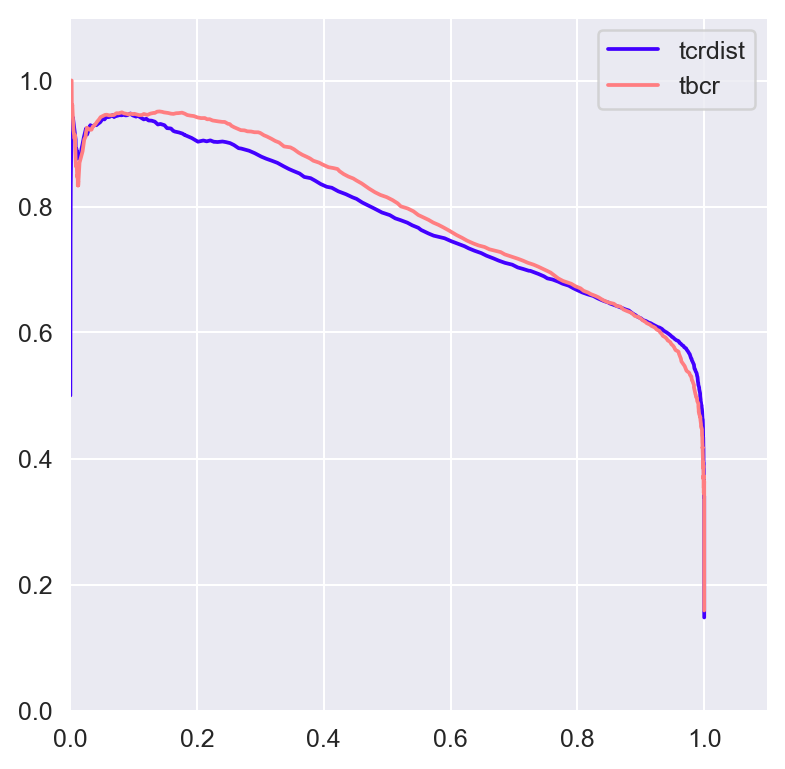

In [1617]:
sns.set_palette('gnuplot2',2)
f,a = plt.subplots(1,1, figsize=(5,5))
a.plot(tcrdist_trainset['retention'], tcrdist_fullset['mean_purity'], label='tcrdist')
a.plot(tbcr_trainset['retention'], tbcr_fullset['mean_purity'], label='tbcr')
a.set_ylim([0,1.1])
a.set_xlim([0,1.1])
a.legend()

### checking with other models

In [1160]:
model = get_model('../output/240415_BL62LO_models/240415_1647_BL62LO_RefiltExpDataWITH10x_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_W10XrefMIN20/')
train_df = new_df_filt.query('partition!=0').sort_values('peptide').drop_duplicates(subset=['A1','A2','A3','B1','B2','B3'])
lat_df = get_latent_df(model, train_df, dataset_params = {'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7,
                                                          'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 
                                                          'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 
                                                          'pep_col': 'peptide', 'add_positional_encoding': True})
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(lat_df)
t = da[da>0].min()
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='complete', distance_threshold=t)
# c = KNeighborsClassifier(n_neighbors=2, metric='precomputed')
c.fit(da, encoded_labels)
wtf = get_all_metrics(t, feats, c, da, labels, encoded_labels, label_encoder)
print(wtf)

Reloading best model:
Best epoch: 28506
total: 0.08011127647062231
reconstruction: 0.05330948159098625
kld: 0.0026160262059420347
triplet: 0.024185769372185955
seq_accuracy: 0.9924525618553162
pos_accuracy: 0.997512936592102
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5868
{'threshold': 0.0012446046, 'n_cluster': 0, 'n_singletons': 5868, 'n_cluster_over_70p': 0, 'mean_purity': nan, 'min_purity': nan, 'max_purity': nan, 'mean_coherence': nan, 'min_coherence': nan, 'max_coherence': nan, 'mean_cluster_size': nan, 'min_cluster_size': nan, 'max_cluster_size': nan, 'silhouette': nan, 'ch_index': nan, 'db_index': nan, 'ARI': 0.0}


In [1054]:
model = get_model('../output/240410_RetrainSmallerData/240411_0006_OLDDATA_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_OLDCosTCRP1/')
train_df = new_df_filt.query('partition!=0').sort_values('peptide').reset_index(drop=True)
lat_df = get_latent_df(model, train_df, dataset_params = {'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7,
                                                          'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 
                                                          'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 
                                                          'pep_col': 'peptide', 'add_positional_encoding': True})
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(lat_df)
t = da[da>0].min()
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='complete', distance_threshold=t)
# c = KNeighborsClassifier(n_neighbors=2, metric='precomputed')
c.fit(da, encoded_labels)
wtf = get_all_metrics(t, feats, c, da, labels, encoded_labels, label_encoder)
print(wtf)

Reloading best model:
Best epoch: 11791
total: 0.11228521011899112
reconstruction: 0.07581794768998108
kld: 0.002668110261791006
triplet: 0.03379915109368813
seq_accuracy: 0.9916457533836365
pos_accuracy: 0.9977738261222839
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5869
{'threshold': 0.0018823743, 'n_cluster': 1250, 'n_singletons': 3368, 'n_cluster_over_70p': 224, 'mean_purity': 0.5897333333333334, 'min_purity': 0.5, 'max_purity': 1.0, 'mean_coherence': 0.0, 'min_coherence': 0.0, 'max_coherence': 0.0, 'mean_cluster_size': 2.0008, 'min_cluster_size': 2, 'max_cluster_size': 3, 'silhouette': nan, 'ch_index': 1.0213631741352547, 'db_index': 1.2593305621147453, 'ARI': 0.00015784997730776068}


In [1054]:

model = get_model('../output/240410_RetrainSmallerData/240411_0006_OLDDATA_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_OLDCosTCRP1/')
train_df = new_df_filt.query('partition!=0').sort_values('peptide').reset_index(drop=True)
lat_df = get_latent_df(model, train_df, dataset_params = {'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7,
                                                          'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 
                                                          'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 
                                                          'pep_col': 'peptide', 'add_positional_encoding': True})
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(lat_df)
t = da[da>0].min()
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='complete', distance_threshold=t)
# c = KNeighborsClassifier(n_neighbors=2, metric='precomputed')
c.fit(da, encoded_labels)
wtf = get_all_metrics(t, feats, c, da, labels, encoded_labels, label_encoder)
print(wtf)

Reloading best model:
Best epoch: 11791
total: 0.11228521011899112
reconstruction: 0.07581794768998108
kld: 0.002668110261791006
triplet: 0.03379915109368813
seq_accuracy: 0.9916457533836365
pos_accuracy: 0.9977738261222839
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5869
{'threshold': 0.0018823743, 'n_cluster': 1250, 'n_singletons': 3368, 'n_cluster_over_70p': 224, 'mean_purity': 0.5897333333333334, 'min_purity': 0.5, 'max_purity': 1.0, 'mean_coherence': 0.0, 'min_coherence': 0.0, 'max_coherence': 0.0, 'mean_cluster_size': 2.0008, 'min_cluster_size': 2, 'max_cluster_size': 3, 'silhouette': nan, 'ch_index': 1.0213631741352547, 'db_index': 1.2593305621147453, 'ARI': 0.00015784997730776068}


In [1053]:
model = get_model('../output/240415_BL62LO_models/240415_1209_BL62LO_ExpData_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_LC62/')
train_df = new_df_filt.query('partition!=0').sort_values('peptide').reset_index(drop=True)
lat_df = get_latent_df(model, train_df, dataset_params = {'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7,
                                                          'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 
                                                          'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 
                                                          'pep_col': 'peptide', 'add_positional_encoding': True})
dm, da, feats, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(lat_df)
t = da[da>0].min()
c = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='complete', distance_threshold=t)
# c = KNeighborsClassifier(n_neighbors=2, metric='precomputed')
c.fit(da, encoded_labels)
wtf = get_all_metrics(t, feats, c, da, labels, encoded_labels, label_encoder)
print(wtf)

Reloading best model:
Best epoch: 29453
total: 0.0663668853099001
reconstruction: 0.041584160178899765
kld: 0.002584905596449971
triplet: 0.022197820698703588
seq_accuracy: 0.993326723575592
pos_accuracy: 0.9976133108139038
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL62LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
5869
{'threshold': 0.0020460486, 'n_cluster': 1261, 'n_singletons': 3346, 'n_cluster_over_70p': 217, 'mean_purity': 0.5861749933914882, 'min_purity': 0.5, 'max_purity': 1.0, 'mean_coherence': 0.0, 'min_coherence': 0.0, 'max_coherence': 0.0, 'mean_cluster_size': 2.000793021411578, 'min_cluster_size': 2, 'max_cluster_size': 3, 'silhouette': nan, 'ch_index': 1.551426594839139, 'db_index': 1.198967602697508, 'ARI': 0.0001471405949736286}


### full runs

### denoising full dataset (filt-exp)

In [1618]:
def get_optimal_model(key, files_dict, compdict):
    folder = files_dict[key]
    stupid_join = '_'.join([compdict[key][-2], compdict[key][-1]])+'_'
    pt = glob.glob(f'{folder}*{stupid_join}*.pt')[0]
    js = glob.glob(f'{folder}*kwargs*.json')[0]
    model = load_model_full(pt, js, map_location='cpu')
    return model


In [1714]:
model = get_optimal_model('17Peps_0200', files_dict, compdict)
latent_df = get_latent_df(model, new_df_filt)
dm_new_df_filt = make_dist_matrix(latent_df, cols=('peptide','original_peptide','binder','partition','raw_index'))
da_new_df_filt = dm_new_df_filt.iloc[:len(dm_new_df_filt), :len(dm_new_df_filt)].values

Reloading best model:
epoch: 6000
total: 0.23586291074752808
reconstruction: 0.2034846693277359
kld: 0.0038797457236796618
triplet: 0.02849850058555603
seq_accuracy: 0.968456506729126
pos_accuracy: 0.9979590177536011
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
7339


In [1715]:
tbcr_dm_filt_reshuffled = tbcr_dm_filt_full.drop_duplicates('raw_index')[[str(x) for x in tbcr_dm_filt_full.drop_duplicates('raw_index').index]+['peptide','original_peptide','binder','partition','raw_index']]
tbcr_dm_filt_reshuffled = tbcr_dm_filt_reshuffled.reset_index().set_index('raw_index').loc[dm_new_df_filt['raw_index'].values].reset_index().set_index('q_index')
tbcr_dm_filt_reshuffled = tbcr_dm_filt_reshuffled[[str(x) for x in tbcr_dm_filt_reshuffled.index]+['peptide','original_peptide','binder','partition','raw_index']]
tbcr_da_filt_reshuffled = tbcr_dm_filt_reshuffled.iloc[:len(tbcr_dm_filt_reshuffled), :len(tbcr_dm_filt_reshuffled)].values

In [1716]:
full_agg_filt = 1 - np.multiply((1-da_new_df_filt), (1-tbcr_da_filt_reshuffled))

In [1718]:
features = torch.rand(len(full_agg_filt), 1)
labels = dm_new_df_filt['peptide'].values
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)
full_agg_results = cluster_all_thresholds(full_agg_filt, features, labels, encoded_labels, label_encoder, n_points=500)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [23:15<00:00,  2.79s/it]


In [1723]:
full_agg_results.query('mean_purity>=0.8 and retention>=0.35').sort_values(['n_cluster_over_70p', 'retention'], ascending=False)[['threshold', 'mean_purity', 'retention', 'n_cluster_over_70p']]

,threshold,mean_purity,retention,n_cluster_over_70p
160,0.19987,0.813115,0.527184,846
162,0.20231,0.807524,0.540673,844
161,0.20109,0.809069,0.535087,843
163,0.20353,0.802916,0.547622,842
159,0.19865,0.816523,0.518736,841
158,0.19743,0.819664,0.511105,838
157,0.19621,0.822442,0.503883,834
152,0.19012,0.843832,0.467911,833
154,0.19256,0.836025,0.481810,832
153,0.19134,0.840529,0.473770,832


In [1729]:
c = AgglomerativeClustering(distance_threshold=0.20353, n_clusters=None, linkage='complete', metric='precomputed')
c.fit(full_agg_filt)
metric_full, stats_df_full = get_all_metrics(0.20353, features, c, full_agg_filt, labels, encoded_labels, label_encoder, return_df=True)


In [ ]:
# save the pruned data as ../data/filtered/240507_nettcr_exp_cluster_denoised_noswap.csv

In [1734]:
latent_df.query('not is_singleton').drop(columns=[x for x in latent_df.columns if x.startswith('z_')]).to_csv('../data/filtered/240507_nettcr_exp_cluster_denoised_noswap.csv')

### denoising full dataset (old)

In [30]:
def get_optimal_model(key, files_dict, compdict):
    folder = files_dict[key]
    stupid_join = '_'.join([compdict[key][-2], compdict[key][-1]])+'_'
    pt = glob.glob(f'{folder}*{stupid_join}*.pt')[0]
    js = glob.glob(f'{folder}*kwargs*.json')[0]
    model = load_model_full(pt, js, map_location='cpu')
    return model


In [32]:
model = get_optimal_model('17Peps_0200', files_dict, compdict)
latent_df = get_latent_df(model, df_old)
dm_old = make_dist_matrix(latent_df, cols=('peptide','original_peptide','binder','partition','original_index'))
da_old = dm_old.iloc[:len(dm_old), :len(dm_old)].values

Reloading best model:
epoch: 6000
total: 0.23586291074752808
reconstruction: 0.2034846693277359
kld: 0.0038797457236796618
triplet: 0.02849850058555603
seq_accuracy: 0.968456506729126
pos_accuracy: 0.9979590177536011
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
6353


In [34]:
tbcr_dm_old_labeled = pd.read_csv('../output/240411_ClusteringTests/dist_matrices/2404XX_OUTPUT_tbcralign_distmatrix_26peps_labeled.csv', index_col=0)
tbcr_dm_old_labeled = tbcr_dm_old_labeled.drop_duplicates('original_index')[[str(x) for x in tbcr_dm_old_labeled.drop_duplicates('original_index').index]+['peptide','original_peptide','binder','partition','original_index']]
tbcr_dm_old_labeled = tbcr_dm_old_labeled.reset_index().set_index('original_index').loc[dm_old['original_index'].values].reset_index().set_index('q_index')
tbcr_dm_old_labeled = tbcr_dm_old_labeled[[str(x) for x in tbcr_dm_old_labeled.index]+['peptide','original_peptide','binder','partition','original_index']]
tbcr_da_old = tbcr_dm_old_labeled.iloc[:len(tbcr_dm_old_labeled), :len(tbcr_dm_old_labeled)].values

In [35]:
full_agg_old = 1 - np.multiply((1-da_old), (1-tbcr_da_old))

In [37]:
features = torch.rand(len(tbcr_dm_old_labeled), 1)
labels = dm_old['peptide'].values
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)
full_agg_old_results = cluster_all_thresholds(full_agg_old, features, labels, encoded_labels, label_encoder, n_points=500)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [15:53<00:00,  1.91s/it]


In [38]:
full_agg_old_results.query('mean_purity>=0.8 and retention>=0.35').sort_values(['n_cluster_over_70p', 'retention'], ascending=False)[['threshold', 'mean_purity', 'retention', 'n_cluster_over_70p']]

,threshold,mean_purity,retention,n_cluster_over_70p
133,0.19342,0.843809,0.482921,739
137,0.19801,0.830356,0.505588,732
134,0.19457,0.838915,0.488588,732
138,0.19916,0.826805,0.512671,731
132,0.19228,0.845553,0.476310,731
131,0.19113,0.848714,0.469385,730
136,0.19686,0.833699,0.499292,729
135,0.19572,0.836196,0.493468,727
130,0.18998,0.850388,0.464505,727
140,0.20145,0.815575,0.529356,726


In [47]:
threshold = 0.19801
c = AgglomerativeClustering(distance_threshold=threshold, n_clusters=None, linkage='complete', metric='precomputed')
c.fit(full_agg_old)
metric_old, stats_df_old = get_all_metrics(threshold, features, c, full_agg_old, labels, encoded_labels, label_encoder, return_df=True)


In [53]:

latent_df['pred_label'] = c.labels_
singleton_flag = np.bincount(c.labels_)==1
latent_df['is_singleton'] = latent_df['pred_label'].apply(lambda x: singleton_flag[x])

In [58]:
latent_df.drop(columns=[x for x in latent_df.columns if x.startswith('z_')]).query('not is_singleton').to_csv('../data/filtered/240507_nettcr_old_cluster_denoised_agg_t019801_noswap.csv')

### full dataset run (filt-exp)

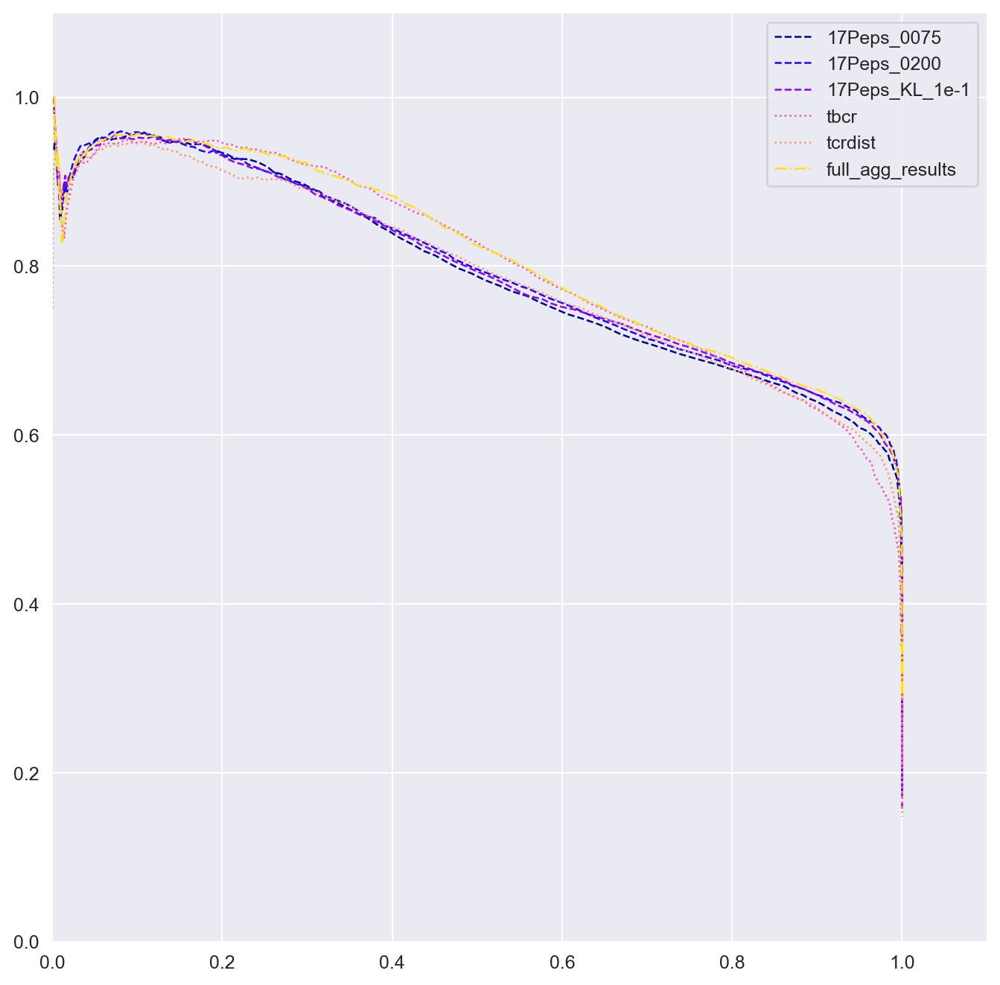

In [1737]:
tmp = pd.concat(results_full_cluster)
f,a = plt.subplots(1,1, figsize=(9,9 ))
a.set_xlim([0,1.1])
a.set_ylim([0,1.1])
for t in tmp.input_type.unique():
    ret = tmp.query('input_type==@t')['retention'].values[1:-1]
    pur = tmp.query('input_type==@t')['mean_purity'].values[1:-1]
    a.plot(ret, pur, label=t, lw=1.0, ls='--')
a.plot(tbcr_fullset['retention'].values[1:-1], tbcr_fullset['mean_purity'].values[1:-1], label='tbcr', lw=1.0, ls=':')
a.plot(tcrdist_fullset['retention'].values[1:-1], tcrdist_fullset['mean_purity'].values[1:-1], label='tcrdist', lw=1.0, ls=':')
a.plot(full_agg_results['retention'].values[1:-1], full_agg_results['mean_purity'].values[1:-1], label='full_agg_results', lw=1.0, ls='-.')
a.legend()

In [1658]:
opt_keys = ['17Peps_0075', '17Peps_0200', '17Peps_KL_1e-1', 'FullExp_0075', 'FullExp_0200', 'FullExp_KL_1e-1']
results_full_cluster = []
for k in opt_keys:
    model = get_optimal_model(k, files_dict, compdict)
    # model = get_model(files_dict[k])
    results_full_cluster.append(pipeline_best_model_clustering(model, new_df_filt, k))

Reloading best model:
epoch: 12000
total: 0.14043596386909485
reconstruction: 0.12555599212646484
kld: 0.0040642255917191505
triplet: 0.010815747082233429
seq_accuracy: 0.9833889603614807
pos_accuracy: 0.997726321220398
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
7339
7339


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [19:39<00:00,  2.36s/it]


Reloading best model:
epoch: 6000
total: 0.23586291074752808
reconstruction: 0.2034846693277359
kld: 0.0038797457236796618
triplet: 0.02849850058555603
seq_accuracy: 0.968456506729126
pos_accuracy: 0.9979590177536011
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
7339
7339


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [20:38<00:00,  2.48s/it]


Reloading best model:
epoch: 6000
total: 0.23878780007362366
reconstruction: 0.18487198650836945
kld: 0.025452343747019768
triplet: 0.02846347540616989
seq_accuracy: 0.9702258706092834
pos_accuracy: 0.9977402687072754
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
7339
7339


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [20:27<00:00,  2.46s/it]


Reloading best model:
Best epoch: 18934
total: 0.07274257391691208
reconstruction: 0.06246810406446457
kld: 0.003820466808974743
triplet: 0.006454008631408215
seq_accuracy: 0.9933130145072937
pos_accuracy: 0.9977250695228577
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}
7339
7339


  5%|███████                                                                                                                                       | 25/500 [01:59<37:51,  4.78s/it]


KeyboardInterrupt: 

In [ ]:
results_full_cluster = pd.concat(results_full_cluster)
results_full_cluster.to_csv('../output/240411_ClusteringTests/240502_FullCluster_results.csv')

In [ ]:
plot_pipeline(results_full_cluster, pd.concat([tbcr_fullset, tcrdist_fullset]), 
              plot_title = 'fullset clustering vae models',
              fig_fn = '240506_fullset_clustering_vaemodels')

# NXMinimum spanning trees

In [740]:
files

['../output/240428_FixTriplet/240426_1609_FullExp_RedoMargin_0010_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0200_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1623_FullExp_RedoMargin_0800_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1617_FullExp_RedoMargin_0500_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1612_FullExp_RedoMargin_0200_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0500_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0010_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1612_FullExp_RedoMargin_0075_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1609_17Peps_RedoMargin_1000_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1633_FullExp_RedoMargin_1000_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_1604_17Peps_RedoMargin_0075_KFold_0_AllTriplet/',
 '../output/240428_FixTriplet/240426_

In [571]:
# Select the best model from FullExp 0200 KL 1e-1
folder = files_dict['FullExp_KL_1e-1']
join = '_'.join([compdict['FullExp_KL_1e-1'][-2], compdict['FullExp_KL_1e-1'][-1]])+'_'
js = glob.glob(f'{folder}*kwargs*.json')[0]
pt = glob.glob(f'{folder}*{join}*.pt')[0]
model = load_model_full(pt, js, map_location='cpu')
latent_df = latent_df.set_index('raw_index').loc[tbcr_dm140_part0['raw_index'].values].reset_index()
dist_matrix, dist_array, features, labels, encoded_labels, label_encoder = get_distances_labels_from_latent(latent_df)
other_array = tbcr_dm140_part0.iloc[:len(tbcr_dm140_part0), :len(tbcr_dm140_part0)].values
agg_array = 1 - np.multiply(1-dist_array, 1-other_array)


Reloading best model:
epoch: 10000
total: 0.133039653301239
reconstruction: 0.0919111892580986
kld: 0.024339670315384865
triplet: 0.016788793727755547
seq_accuracy: 0.9892194867134094
pos_accuracy: 0.9978100657463074


In [593]:
G = nx.Graph(agg_array)
G

In [596]:
G.get_edge_data(1,2)

{'weight': 0.23597070880357418}

In [597]:
T = nx.minimum_spanning_tree(G)

In [ ]:
elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d["weight"] > 0.5]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d["weight"] <= 0.5]

pos = nx.spring_layout(G, seed=7)  # positions for all nodes - seed for reproducibility


In [1628]:
from src.networkx_utils import collect_init_subgraphs, create_graph_from_subgraphsets, trim_graph_into_subgraphs
priority_abags = set()

#create initial graphs
#abag_adjmatrix np.array (nr_seq, nr_seqs)
init_graph = nx.Graph(agg_array)
datasize = len(init_graph)
size_cutoff = 3

okay_subgraphs, subgraphs_to_trim = collect_init_subgraphs(init_graph, size_cutoff = size_cutoff)
print(f"Number of decently sized subgraphs  {len(okay_subgraphs)}")
print(f"Number of subgraphs that need to be trimmed {len(subgraphs_to_trim)}")

if subgraphs_to_trim:
    trimmed_subgraphs = []
    for g in subgraphs_to_trim: trimmed_subgraphs.extend(trim_graph_into_subgraphs(g, size_cutoff=size_cutoff, priority_nodes=priority_abags,
                                                                                   remove_multnodes=remove_multnodes, priority_limit=priority_limit))
#trim the graphs
all_graphs = okay_subgraphs + trimmed_subgraphs
finalG = create_graph_from_subgraphsets(init_graph, all_graphs)
finalG_subgraphs = list(nx.connected_components(finalG))
final_sizes = [len(t) for t in finalG_subgraphs ]
print(f"Final graph sizes {final_sizes}")

KeyboardInterrupt: 

In [79]:
# Using that best cos model
cos_model = get_model('../output/240404_TCRONLY_onetwostage_smallLARGE/240404_2342_ExpData_TCRONLY_1stage_LARGE_256h_100l_CosTrp_KFold_0_SmCosTCRP1/')
latent_df = get_latent_df(cos_model, new_df_filt)
cos_dm, cos_array, _, _ , _, _ = get_distances_labels_from_latent(latent_df)

Reloading best model:
Best epoch: 11882
total: 0.10637179474033316
reconstruction: 0.08248233795166016
kld: 0.0027784218546003103
triplet: 0.021111038426532353
seq_accuracy: 0.9905097484588623
pos_accuracy: 0.9976889491081238
{'max_len_a1': 7, 'max_len_a2': 8, 'max_len_a3': 22, 'max_len_b1': 6, 'max_len_b2': 7, 'max_len_b3': 23, 'max_len_pep': 0, 'encoding': 'BL50LO', 'pad_scale': -20, 'a1_col': 'A1', 'a2_col': 'A2', 'a3_col': 'A3', 'b1_col': 'B1', 'b2_col': 'B2', 'b3_col': 'B3', 'pep_col': 'peptide', 'add_positional_encoding': True}


In [ ]:
g = nx.from_numpy_array(